#### <center><h1><b>Importing Libraries</b></h1></center>

In [1]:
#Importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import copy
import shap
import time
from shap.maskers import Independent
import tqdm as notebook_tqdm
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, roc_curve, auc
from scipy.stats import norm
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [2]:
from qiskit.circuit.library import ZZFeatureMap, ZFeatureMap,PauliFeatureMap , RealAmplitudes, EfficientSU2
from qiskit_algorithms.utils import algorithm_globals
import qiskit_algorithms.optimizers as op
from qiskit.primitives import Sampler
from qiskit_machine_learning.algorithms.classifiers import VQC

#### <center><h1><b>Data Cleaning</b></h1></center>

In [3]:
df1 = pd.read_excel('Hum_ZP_updated_AT_111124_train.xlsx', sheet_name = 'Group_1_Healthy_EVs')

In [4]:
df2 = pd.read_excel('Hum_ZP_updated_AT_111124_train.xlsx', sheet_name = 'Group_2_Cancer_EVs')

In [5]:
df3 = pd.read_excel('Hum_ZP_updated_AT_111124_train.xlsx', sheet_name = 'Group_3_Cancer_EVs_NP')

In [6]:
df4 = pd.read_excel('Hum_ZP_updated_AT_111124_train.xlsx', sheet_name = 'Group_4_Healthy EVs_NP')

In [7]:
df5 = pd.read_excel('Hum_ZP_updated_AT_111124_train.xlsx', sheet_name = 'Group_5_Healthy Plasma')

In [8]:
df6 = pd.read_excel('Hum_ZP_updated_AT_111124_train.xlsx', sheet_name = 'Group_6_Cancer Plasma')

In [9]:
df7 = pd.read_excel('Hum_ZP_updated_AT_111124_train.xlsx', sheet_name = 'Group_7_Healthy Palsma_NP')

In [10]:
df8 = pd.read_excel('Hum_ZP_updated_AT_111124_train.xlsx', sheet_name = 'Group_8_Cancer Plasma_NP')

In [11]:
df1.head()

,Record,Type,Sample Name,Measurement Date and Time,T,Surface Zeta Potential,Surface Zeta Potential Uncertainty,Zeta Potential,Mob,Cond,Tracer Zeta Potential,Mean Count Rate
0,,NaN,,,°C,mV,mV,mV,µmcm/Vs,mS/cm,mV,kcps
1,1,Zeta,Hum_H1 1,"Thursday, November 30, 2023 7:58:08 PM",25,NaN,NaN,-5.69,-0.4461,18.9,NaN,210.8
2,2,Zeta,Hum_H1 2,"Thursday, November 30, 2023 7:59:49 PM",25,NaN,NaN,-6.28,-0.4924,19.9,NaN,53
3,3,Zeta,Hum_H1 3,"Thursday, November 30, 2023 8:00:10 PM",25,NaN,NaN,-7.12,-0.5582,20.7,NaN,440.6
4,4,Zeta,Hum_H1 4,"Thursday, November 30, 2023 8:00:31 PM",25,NaN,NaN,-5.93,-0.4651,21.2,NaN,177.6


In [12]:
df1 = df1.iloc[1:]
df2 = df2.iloc[1:]
df3 = df3.iloc[1:]
df4 = df4.iloc[1:]
df5 = df5.iloc[1:]
df6 = df6.iloc[1:]
df7 = df7.iloc[1:]
df8 = df8.iloc[1:]

In [13]:
df9 = pd.read_excel('Hum_ZP_updated_AT_111124_test.xlsx', sheet_name = 'Group_1_Healthy_EVs')

In [14]:
df10 = pd.read_excel('Hum_ZP_updated_AT_111124_test.xlsx', sheet_name = 'Group_2_Cancer_EVs')

In [15]:
df11 = pd.read_excel('Hum_ZP_updated_AT_111124_test.xlsx', sheet_name = 'Group_3_Cancer_EVs_NP')

In [16]:
df12 = pd.read_excel('Hum_ZP_updated_AT_111124_test.xlsx', sheet_name = 'Group_4_Healthy EVs_NP')

In [17]:
df13 = pd.read_excel('Hum_ZP_updated_AT_111124_test.xlsx', sheet_name = 'Group_5_Healthy Plasma')

In [18]:
df14 = pd.read_excel('Hum_ZP_updated_AT_111124_test.xlsx', sheet_name = 'Group_6_Cancer Plasma')

In [19]:
df15 = pd.read_excel('Hum_ZP_updated_AT_111124_test.xlsx', sheet_name = 'Group_7_Healthy Palsma_NP')

In [20]:
df16 = pd.read_excel('Hum_ZP_updated_AT_111124_test.xlsx', sheet_name = 'Group_8_Cancer Plasma_NP')

In [21]:
def redefine_sample_name(sample):
    if 'Hum_H' in sample:
        return 0
    elif 'Hum_C_NP' in sample:
        return 2
    elif 'Healthy EVs_NP' in sample:
        return 3
    elif 'Healthy Plasma_NP_' in sample:
        return 6
    elif 'Cancer Plasma_NP_' in sample:
        return 7
    elif 'Healthy Plasma_' in sample:
        return 4
    elif 'Cancer Plasma_' in sample:
        return 5
    else:
        return 1

In [22]:
df4.dtypes

Record                                object
Type                                  object
Sample Name                           object
Measurement Date and Time             object
T                                     object
Surface Zeta Potential                object
Surface Zeta Potential Uncertainty    object
Reported Zeta Potential               object
Mob                                   object
Cond                                  object
Tracer Zeta Potential                 object
Derived Count Rate                    object
dtype: object

In [23]:
df1['Sample Name'] = df1['Sample Name'].apply(redefine_sample_name)
df2['Sample Name'] = df2['Sample Name'].apply(redefine_sample_name)
df3['Sample Name'] = df3['Sample Name'].apply(redefine_sample_name)
df4['Sample Name'] = df4['Sample Name'].apply(redefine_sample_name)
df5['Sample Name'] = df5['Sample Name'].apply(redefine_sample_name)
df6['Sample Name'] = df6['Sample Name'].apply(redefine_sample_name)
df7['Sample Name'] = df7['Sample Name'].apply(redefine_sample_name)
df8['Sample Name'] = df8['Sample Name'].apply(redefine_sample_name)

In [24]:
df9['Sample Name'] = df9['Sample Name'].apply(redefine_sample_name)
df10['Sample Name'] = df10['Sample Name'].apply(redefine_sample_name)
df11['Sample Name'] = df11['Sample Name'].apply(redefine_sample_name)
df12['Sample Name'] = df12['Sample Name'].apply(redefine_sample_name)
df13['Sample Name'] = df13['Sample Name'].apply(redefine_sample_name)
df14['Sample Name'] = df14['Sample Name'].apply(redefine_sample_name)
df15['Sample Name'] = df15['Sample Name'].apply(redefine_sample_name)
df16['Sample Name'] = df16['Sample Name'].apply(redefine_sample_name)

In [25]:
df1.columns

Index(['Record', 'Type', 'Sample Name', 'Measurement Date and Time', 'T',
       'Surface Zeta Potential', 'Surface Zeta Potential Uncertainty',
       'Zeta Potential', 'Mob', 'Cond', 'Tracer Zeta Potential',
       'Mean Count Rate'],
      dtype='object')

In [26]:
columns = ['Record', 'Type', 'Measurement Date and Time', 'T',
       'Surface Zeta Potential', 'Surface Zeta Potential Uncertainty','Mob',
        'Tracer Zeta Potential']

In [27]:
df1.drop(columns = columns, inplace = True)
df9.drop(columns = columns, inplace = True)

In [28]:
df3.drop(columns = columns, inplace = True)
df11.drop(columns = columns, inplace = True)

In [29]:
df3.columns

Index(['Sample Name', 'Zeta Potential', 'Cond', 'Mean Count Rate'], dtype='object')

In [30]:
df2.columns

Index(['Record', 'Type', 'Sample Name', 'Measurement Date and Time', 'T',
       'Surface Zeta Potential', 'Surface Zeta Potential Uncertainty',
       'Reported Zeta Potential', 'Mob', 'Cond', 'Tracer Zeta Potential',
       'Derived Count Rate'],
      dtype='object')

In [31]:
columns = ['Record', 'Type', 'Measurement Date and Time', 'T','Mob',
       'Surface Zeta Potential', 'Surface Zeta Potential Uncertainty',
        'Tracer Zeta Potential']

In [32]:
df2.drop(columns = columns, inplace = True)
df4.drop(columns = columns, inplace = True)
df5.drop(columns = columns, inplace = True)
df6.drop(columns = columns, inplace = True)
df7.drop(columns = columns, inplace = True)
df8.drop(columns = columns, inplace = True)

In [33]:
df10.drop(columns = columns, inplace = True)
df12.drop(columns = columns, inplace = True)
df13.drop(columns = columns, inplace = True)
df14.drop(columns = columns, inplace = True)
df15.drop(columns = columns, inplace = True)
df16.drop(columns = columns, inplace = True)

In [34]:
df2.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)
df4.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)
df5.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)
df6.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)
df7.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)
df8.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)

In [35]:
df10.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)
df12.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)
df13.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)
df14.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)
df15.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)
df16.rename(columns={'Reported Zeta Potential' : 'Zeta Potential'}, inplace = True)

In [36]:
df2.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)
df4.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)
df5.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)
df6.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)
df7.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)
df8.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)

In [37]:
df10.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)
df12.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)
df13.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)
df14.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)
df15.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)
df16.rename(columns={'Derived Count Rate' : 'Mean Count Rate'}, inplace = True)

In [38]:
df1.isnull().sum()

Sample Name        0
Zeta Potential     0
Cond               0
Mean Count Rate    0
dtype: int64

In [39]:
df2.isnull().sum()

Sample Name        0
Zeta Potential     0
Cond               0
Mean Count Rate    0
dtype: int64

In [40]:
df3.isnull().sum()

Sample Name        0
Zeta Potential     0
Cond               0
Mean Count Rate    0
dtype: int64

In [41]:
df4.isnull().sum()

Sample Name        0
Zeta Potential     0
Cond               0
Mean Count Rate    0
dtype: int64

In [42]:
df5.isnull().sum()

Sample Name        0
Zeta Potential     0
Cond               0
Mean Count Rate    0
dtype: int64

In [43]:
df6.isnull().sum()

Sample Name        0
Zeta Potential     0
Cond               0
Mean Count Rate    0
dtype: int64

In [44]:
df7.isnull().sum()

Sample Name        0
Zeta Potential     0
Cond               0
Mean Count Rate    0
dtype: int64

In [45]:
df8.isnull().sum()

Sample Name        0
Zeta Potential     0
Cond               0
Mean Count Rate    0
dtype: int64

In [46]:
del columns

In [47]:
df2.columns

Index(['Sample Name', 'Zeta Potential', 'Cond', 'Mean Count Rate'], dtype='object')

In [48]:
dataset1 = pd.concat([df1, df2], axis = 0)
dataset2 = pd.concat([df1, df4], axis = 0)
dataset3 = pd.concat([df2, df3], axis = 0)
dataset4 = pd.concat([df5, df7], axis = 0)
dataset5 = pd.concat([df6, df8], axis = 0)
dataset11 = pd.concat([df4, df3], axis = 0)

In [49]:
dataset6 = pd.concat([df9, df10], axis = 0)
dataset7 = pd.concat([df9, df12], axis = 0)
dataset8 = pd.concat([df10, df11], axis = 0)
dataset9 = pd.concat([df13, df15], axis = 0)
dataset10 = pd.concat([df14, df16], axis = 0)
dataset12 = pd.concat([df12, df11], axis = 0)

In [50]:
del df1, df2, df3, df4, df5, df6, df7, df8, df9, df10, df11, df12, df13, df14, df15, df16

In [51]:
columns = ['Zeta Potential', 'Cond', 'Mean Count Rate']

In [52]:
dataset1[columns] = dataset1[columns].astype(float)
dataset2[columns] = dataset2[columns].astype(float)
dataset3[columns] = dataset3[columns].astype(float)
dataset4[columns] = dataset4[columns].astype(float)
dataset5[columns] = dataset5[columns].astype(float)

In [53]:
dataset6[columns] = dataset6[columns].astype(float)
dataset7[columns] = dataset7[columns].astype(float)
dataset8[columns] = dataset8[columns].astype(float)
dataset9[columns] = dataset9[columns].astype(float)
dataset10[columns] = dataset10[columns].astype(float)
dataset11[columns] = dataset11[columns].astype(float)
dataset12[columns] = dataset12[columns].astype(float)

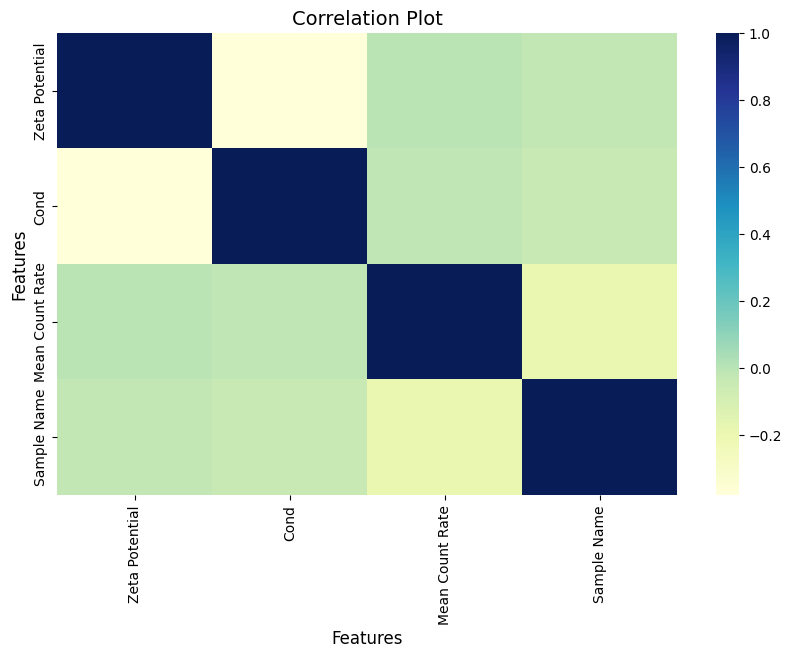

In [54]:
#========================Creating correlation matrix for the Glioma datastet==================================
columns = ['Zeta Potential', 'Cond', 'Mean Count Rate', 'Sample Name']

correlation_matrix = dataset1[columns].corr()
# Create a correlation plot
plt.figure(figsize=(10, 6))  # Set the figure size
sns.heatmap(correlation_matrix, cmap='YlGnBu')
# Add plot title and adjust font size
plt.title('Correlation Plot', fontsize=14)
# Set the font size of the axis labels
plt.xlabel('Features', fontsize=12)
plt.ylabel('Features', fontsize=12)

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)
# Show the plot
plt.show()
#==========================================================================================================

In [55]:
#================Method to evaluate classical ML models==============
def evaluate_model(model, train_set, X_train, y_train, X_test, y_test):
    acc_ls = []
    pred_ls = []
    train_data = []
    pred_proba_ls = []
    for elm in train_set:
        clf = copy.deepcopy(model)
        X_t, dummy_x, y_t, dummy_y = train_test_split(copy.copy(X_train), y_train, train_size=elm, random_state=algorithm_globals.random_seed)
        # Fitting the classifier to the training data
        clf.fit(X_t, y_t)
        train_data.append(y_t)
        # Making predictions on the testing data
        start = time.time()
        y_pred = clf.predict(X_test)
        end = time.time()
        y_pred_proba = clf.predict_proba(X_test)
        pred_ls.append(y_pred)
        pred_proba_ls.append(y_pred_proba)
        # Evaluating the accuracy of the model
        accuracy = accuracy_score(y_test, y_pred)
        acc_ls.append(accuracy)
        execution_time = end-start
        print(f'Accuracy score({clf.__class__.__name__} model): {accuracy:.6f} with {elm*100}% training records')
        print(f'Execution Time({clf.__class__.__name__} model): {execution_time:.6f} seconds with {elm*100}% training records')
        print()
    return acc_ls, pred_ls, train_data, pred_proba_ls

In [56]:
#=====================Method to show ROC Curve of the model based on different training set===========================
def evaluate_ROC(train_set, y_test, pred_ls):
    for i in range(len(train_set)):
        # Compute the ROC curve and AUC
        fpr, tpr, thresholds = roc_curve(y_test, pred_ls[i])
        roc_auc = auc(fpr, tpr)
        # Compute the confidence interval
        std_err = np.sqrt(np.divide(tpr * (1 - tpr), y_test.size, where=(y_test.size != 0)) * (fpr + tpr))
        # Compute the confidence interval with explicit broadcasting
        upper_bound = tpr + std_err * 1.96
        lower_bound = tpr - std_err * 1.96
        # Plot the ROC curve
        plt.figure()
        plt.plot(fpr, tpr, color='b', label='AUC = %0.2f' % roc_auc)
        plt.fill_between(fpr, lower_bound, upper_bound, color='lightblue', alpha=0.5,label = '\n95%% CI: [%0.2f, %0.2f]' % (lower_bound[1], upper_bound[1]))
        plt.plot([0, 1], [0, 1], color='r', linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.0])
        plt.xlabel('FPR')
        plt.ylabel('TPR')
        plt.title(f'ROC Curve (95% CI), {train_set[i]*100}% Training Data')
        plt.legend(loc="lower right")
        plt.show()

In [57]:
#=========================Method to show Confusion Matrix on different Training Set==============================
def evaluate_con_mat(train_set, y_test, pred_ls):
    for i in range(len(train_set)):
        # Calculate the confusion matrix
        cm = confusion_matrix(y_test, pred_ls[i])
        # Create a heatmap of the confusion matrix
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.xlabel('Predicted Labels')
        plt.ylabel('True Labels')
        plt.title(f'Confusion Matrix ({train_set[i]*100}% Training Data)')
        plt.show()

In [58]:
train_set = [0.70, 0.50, 0.1, 0.05]

In [59]:
training_sample = []
for i in range(len(train_set)):
    training_sample.append(train_set[i] * 100)

In [60]:
algorithm_globals.random_seed = 123

# <center><h1><b>Task 1 (Healthy_EVs vs Cancer_EVs)</b></h1></center>

In [77]:
#==================Predictor Variables=====================================
X_train = dataset1[['Zeta Potential', 'Cond', 'Mean Count Rate']]
X_test = dataset6[['Zeta Potential', 'Cond', 'Mean Count Rate']]
#===================Output Variable========================================
y_train = dataset1['Sample Name']
y_test = dataset6['Sample Name']
# X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=algorithm_globals.random_seed)

## Logistic Regression

### Logistic Regression without hyperparameter tuning (Healthy_EVs vs Cancer_EVs)

In [62]:
#=====================Logistic Regression Model with different training sets================
eval_mod=evaluate_model(LogisticRegression(solver='lbfgs', max_iter=1000), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.816667 with 70.0% training records
Execution Time(LogisticRegression model): 0.007815 seconds with 70.0% training records

Accuracy score(LogisticRegression model): 0.816667 with 50.0% training records
Execution Time(LogisticRegression model): 0.007448 seconds with 50.0% training records

Accuracy score(LogisticRegression model): 0.516667 with 10.0% training records
Execution Time(LogisticRegression model): 0.007311 seconds with 10.0% training records

Accuracy score(LogisticRegression model): 0.816667 with 5.0% training records
Execution Time(LogisticRegression model): 0.007395 seconds with 5.0% training records



In [63]:
#===============================Hyperparameter Tuning================================
clf_LR = LogisticRegression(solver = 'lbfgs', max_iter=1000)
param_grid = { 'C': [0.001, 0.01, 0.1, 1, 10, 100],'penalty': ['l2'], 'solver': ['newton-cg','lbfgs' ,'liblinear', 'saga']}
grid_search = GridSearchCV(clf_LR, param_grid, cv=10, verbose=0 ,scoring='accuracy')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 0.001, 'penalty': 'l2', 'solver': 'saga'}


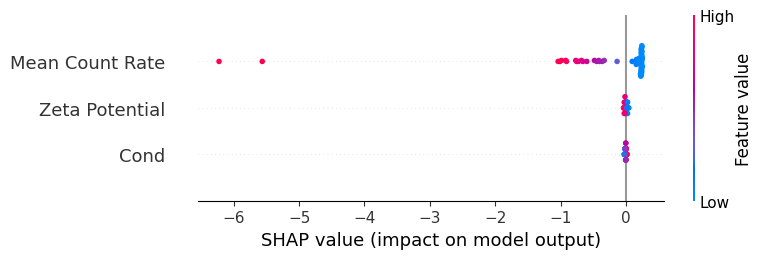

In [64]:
best_model = grid_search.best_estimator_
# Use SHAP's LinearExplainer with the best model
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    explainer = shap.LinearExplainer(best_model, X_train, feature_perturbation="interventional")
    shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values,X_test)

### Logistic Regression with hyperparameter tuning (Healthy_EVs vs Cancer_EVs)

In [65]:
#==============================Logistic Regression Model with Hyperparameter Tuning===========================
acc_LR, pred_LR, train_data, pred_proba_LR = evaluate_model(LogisticRegression(solver = best_params['solver'], penalty=best_params['penalty'], C = best_params['C']), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.816667 with 70.0% training records
Execution Time(LogisticRegression model): 0.006867 seconds with 70.0% training records

Accuracy score(LogisticRegression model): 0.800000 with 50.0% training records
Execution Time(LogisticRegression model): 0.006798 seconds with 50.0% training records

Accuracy score(LogisticRegression model): 0.500000 with 10.0% training records
Execution Time(LogisticRegression model): 0.006690 seconds with 10.0% training records

Accuracy score(LogisticRegression model): 0.500000 with 5.0% training records
Execution Time(LogisticRegression model): 0.006710 seconds with 5.0% training records



### Learning Curve for Logistic Regression (Healthy_EVs vs Cancer_EVs)

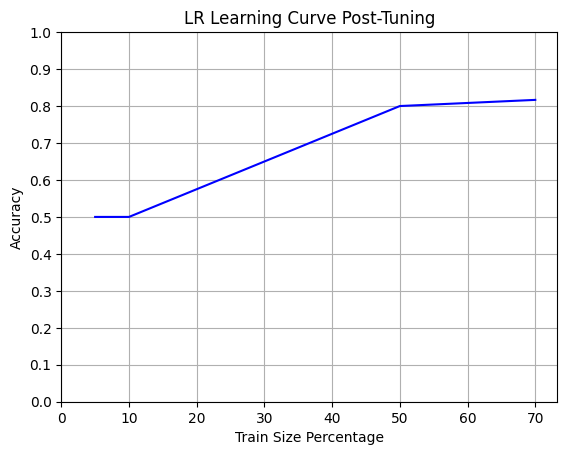

In [66]:
#===============================Learning Curve for LR===========================================
plt.plot(training_sample,acc_LR, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Logistic Regression (Healthy_EVs vs Cancer_EVs)

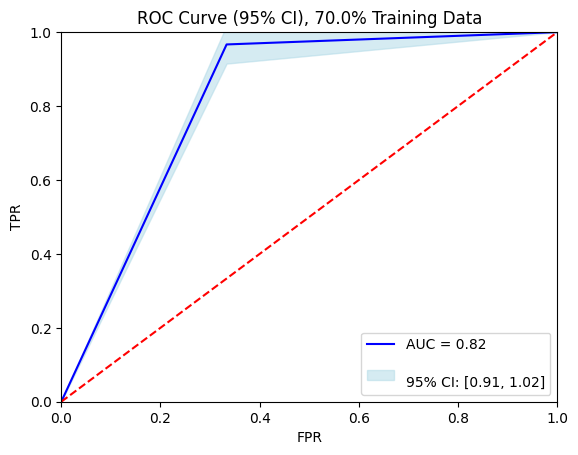

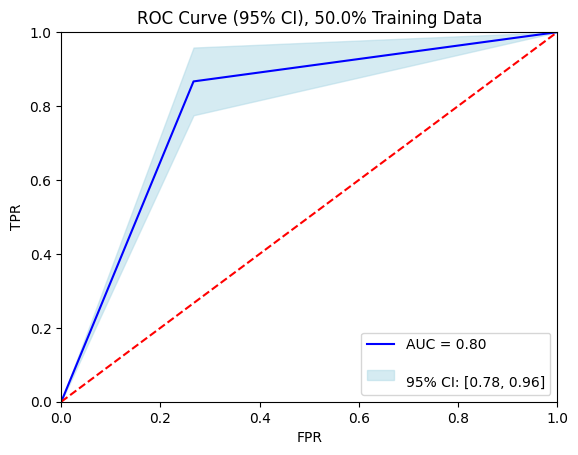

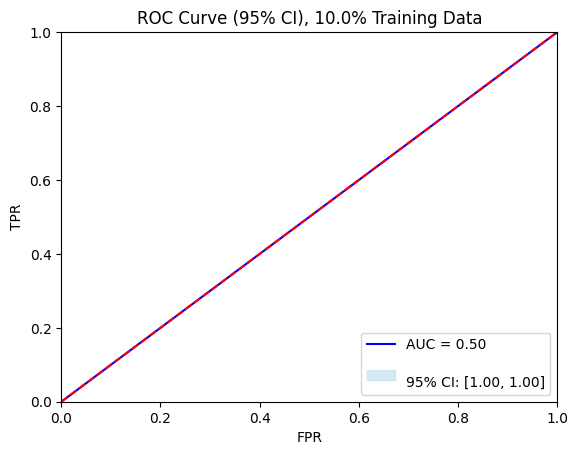

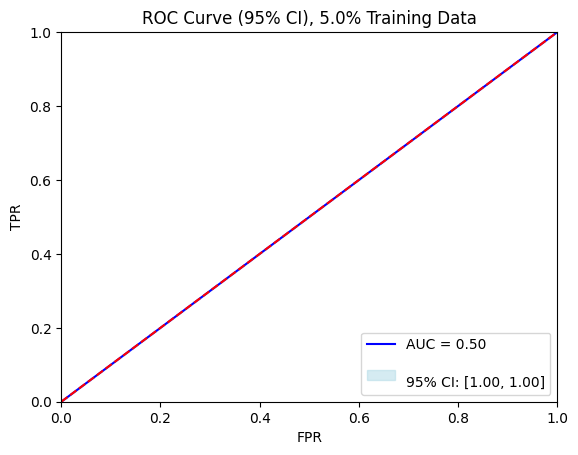

In [67]:
evaluate_ROC(train_set, y_test, pred_LR)

### Confusion Matrix for Logistic Regression (Healthy_EVs vs Cancer_EVs)

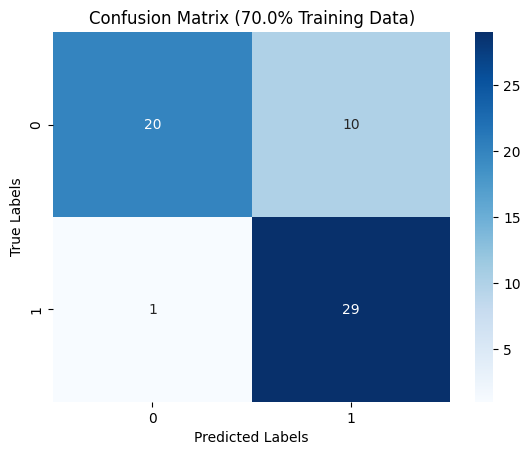

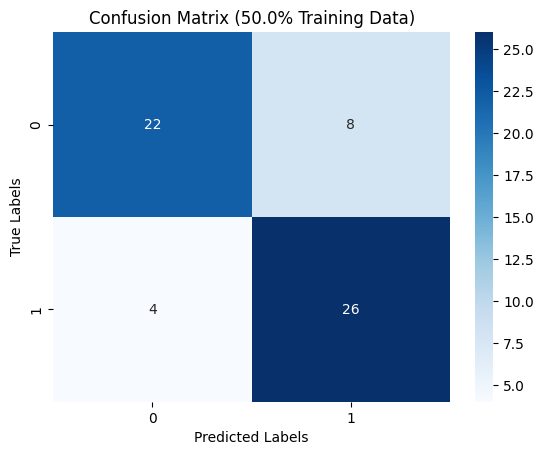

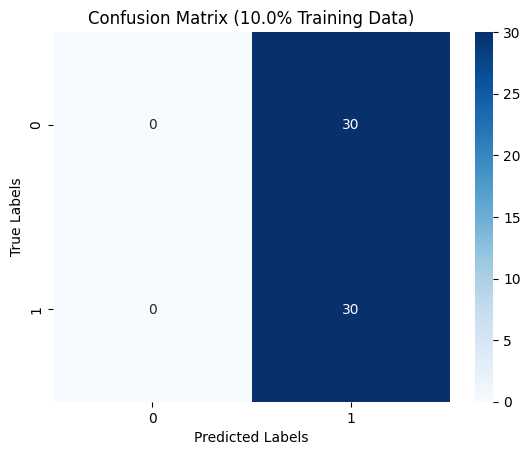

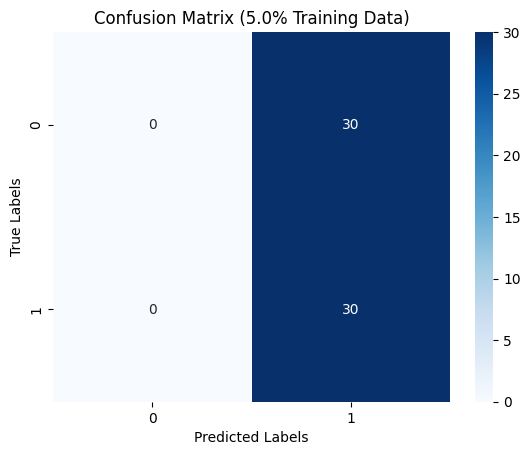

In [68]:
evaluate_con_mat(train_set, y_test, pred_LR)

In [69]:
del acc_LR, pred_LR, train_data, pred_proba_LR, best_params, clf_LR

## Random Forest

### Random Forest without hyperparameter tuning (Healthy_EVs vs Cancer_EVs)

In [70]:
eval_mod=evaluate_model(RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10), train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.716667 with 70.0% training records
Execution Time(RandomForestClassifier model): 0.172576 seconds with 70.0% training records

Accuracy score(RandomForestClassifier model): 0.716667 with 50.0% training records
Execution Time(RandomForestClassifier model): 0.169379 seconds with 50.0% training records

Accuracy score(RandomForestClassifier model): 0.500000 with 10.0% training records
Execution Time(RandomForestClassifier model): 0.166109 seconds with 10.0% training records

Accuracy score(RandomForestClassifier model): 0.500000 with 5.0% training records
Execution Time(RandomForestClassifier model): 0.165551 seconds with 5.0% training records



In [71]:
#==============================Hyperparameter  Tuning======================================
clf_RF = RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10)
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
}
grid_search = GridSearchCV(estimator=clf_RF, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 300}


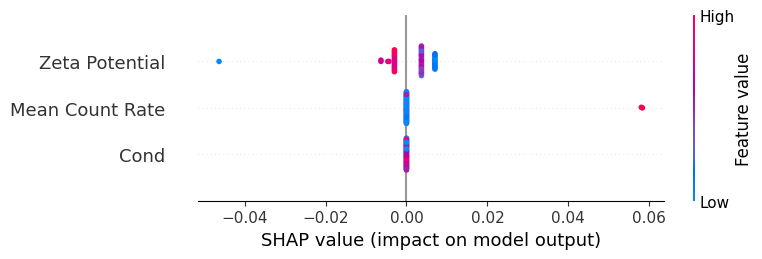

In [72]:
scaler = StandardScaler()
X_train_norm = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_norm = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
explainer_rf = shap.Explainer(grid_search.best_estimator_, X_train_norm)
shap_values_rf = explainer_rf(X_test_norm)
shap_values_class_1 = shap_values_rf.values[..., 1]
shap.summary_plot(shap_values_class_1, X_test_norm)

### Random Forest with hyperparameter tuning (Healthy_EVs vs Cancer_EVs)

In [73]:
#==============================Random Forest Model with Hyperparameter Tuning===========================
acc_RF, pred_RF, train_data, pred_proba_RF = evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.700000 with 70.0% training records
Execution Time(RandomForestClassifier model): 0.173031 seconds with 70.0% training records

Accuracy score(RandomForestClassifier model): 0.733333 with 50.0% training records
Execution Time(RandomForestClassifier model): 0.172522 seconds with 50.0% training records

Accuracy score(RandomForestClassifier model): 0.500000 with 10.0% training records
Execution Time(RandomForestClassifier model): 0.173337 seconds with 10.0% training records

Accuracy score(RandomForestClassifier model): 0.466667 with 5.0% training records
Execution Time(RandomForestClassifier model): 0.167137 seconds with 5.0% training records



### Learning Curve for Random Forest (Healthy_EVs vs Cancer_EVs)

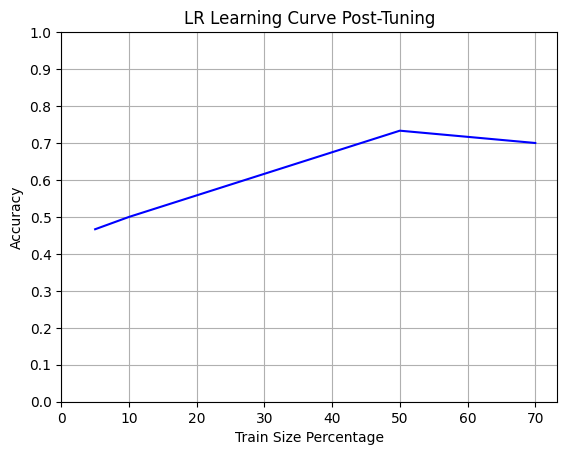

In [74]:
#===============================Learning Curve for Random Forest===========================================
plt.plot(training_sample,acc_RF, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Random Forest (Healthy_EVs vs Cancer_EVs)

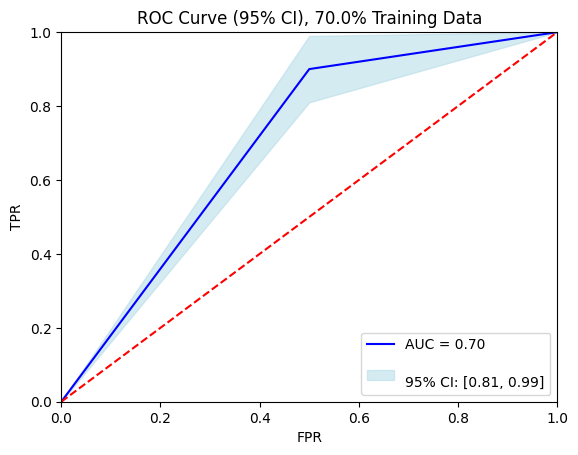

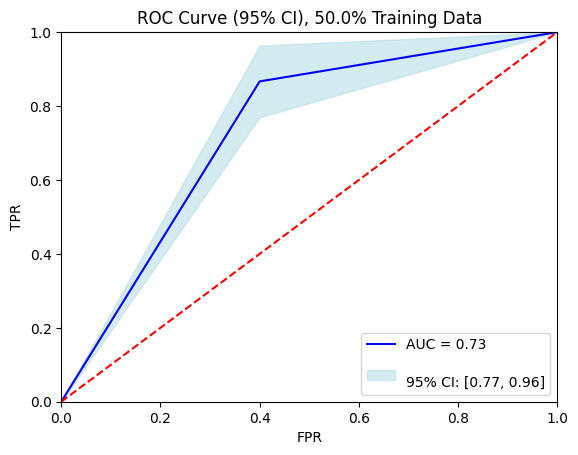

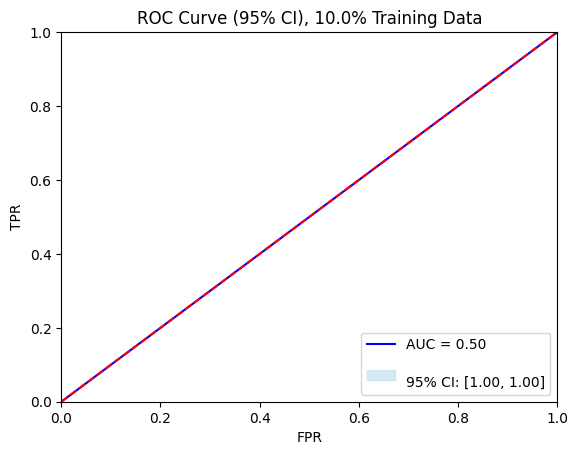

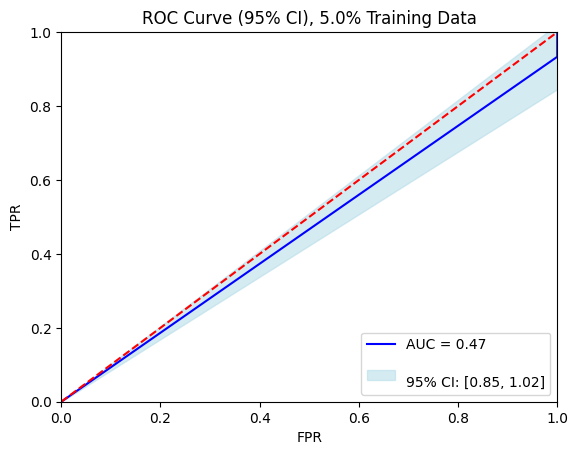

In [75]:
evaluate_ROC(train_set, y_test, pred_RF)

### Confusion Matrix for Random Forest (Healthy_EVs vs Cancer_EVs)

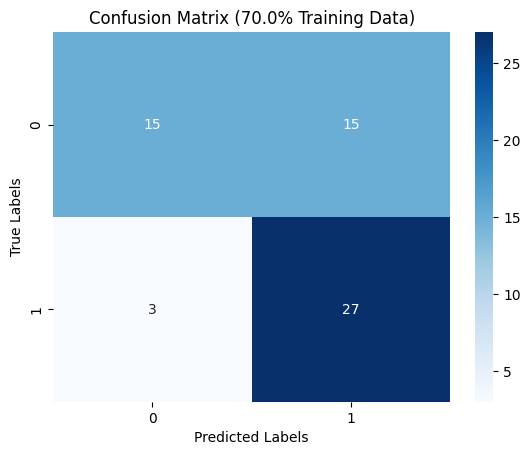

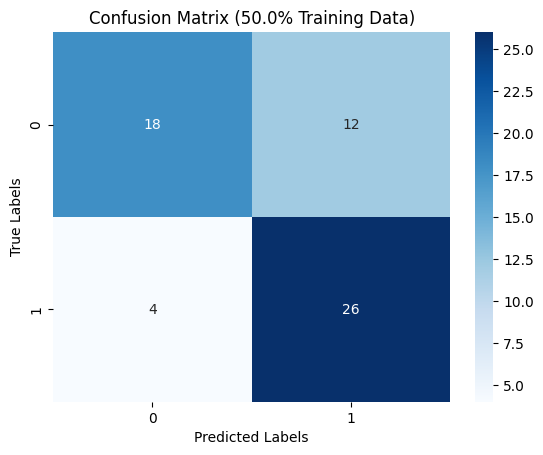

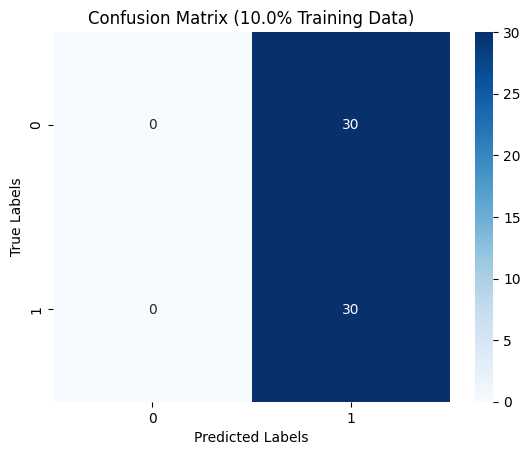

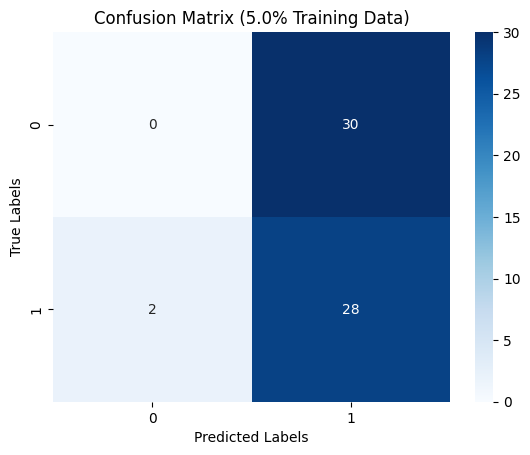

In [76]:
evaluate_con_mat(train_set, y_test, pred_RF)

In [77]:
del  acc_RF, pred_RF, train_data, pred_proba_RF, best_params, clf_RF

## Support Vector Classifier

### Support Vector Classifier  without hyperparameter tuning (Healthy_EVs vs Cancer_EVs)

In [78]:
eval_mod=evaluate_model(SVC(kernel='sigmoid', probability=True, C = 100, gamma='auto'), train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.500000 with 70.0% training records
Execution Time(SVC model): 0.008279 seconds with 70.0% training records

Accuracy score(SVC model): 0.500000 with 50.0% training records
Execution Time(SVC model): 0.007646 seconds with 50.0% training records

Accuracy score(SVC model): 0.500000 with 10.0% training records
Execution Time(SVC model): 0.007102 seconds with 10.0% training records

Accuracy score(SVC model): 0.500000 with 5.0% training records
Execution Time(SVC model): 0.007018 seconds with 5.0% training records



In [79]:
#==========================Hyperparameter Tuning==========================
clf_SVM = SVC(probability=True)
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': [0.01, 0.1]
}
grid_search = GridSearchCV(estimator=clf_SVM, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 1, 'gamma': 0.01, 'kernel': 'rbf'}


Using 140 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/60 [00:00<?, ?it/s]

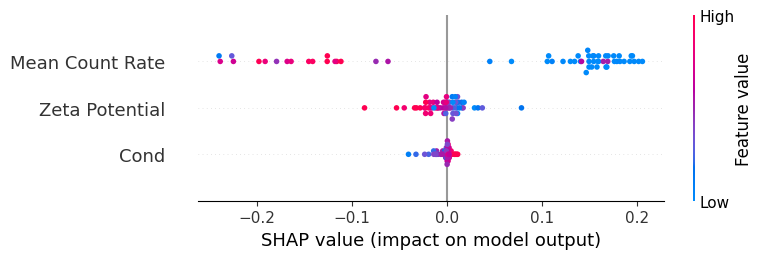

In [80]:
best_model = grid_search.best_estimator_
explainer_svc = shap.KernelExplainer(best_model.predict_proba, X_train)
shap_values_svc = explainer_svc(X_test)
shap_values_svc_class_1 = shap_values_svc.values[..., 1]
shap.summary_plot(shap_values_svc_class_1, X_test)

### Support Vector Classifier with hyperparameter tuning (Healthy_EVs vs Cancer_EVs)

In [81]:
acc_SVC, pred_SVC, train_data, pred_proba_SVC=evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.766667 with 70.0% training records
Execution Time(SVC model): 0.010589 seconds with 70.0% training records

Accuracy score(SVC model): 0.816667 with 50.0% training records
Execution Time(SVC model): 0.009305 seconds with 50.0% training records

Accuracy score(SVC model): 0.500000 with 10.0% training records
Execution Time(SVC model): 0.007536 seconds with 10.0% training records

Accuracy score(SVC model): 0.500000 with 5.0% training records
Execution Time(SVC model): 0.007377 seconds with 5.0% training records



### Learning Curve for Support Vector Classifier (Healthy_EVs vs Cancer_EVs)

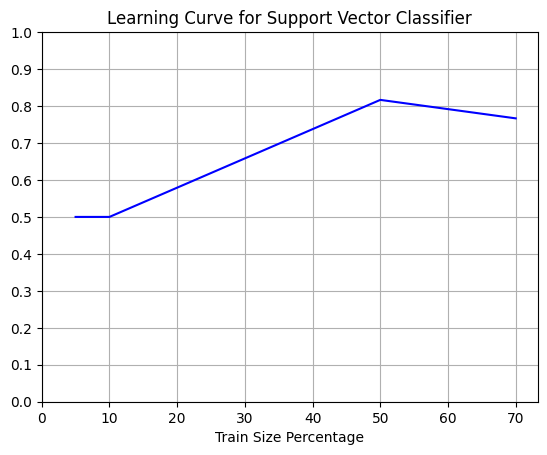

In [82]:
#===============================Learning Curve for SVC===========================================
plt.plot(training_sample,acc_SVC, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for Support Vector Classifier')
plt.show()

### ROC Curve for Support Vector Classifier (Healthy_EVs vs Cancer_EVs)

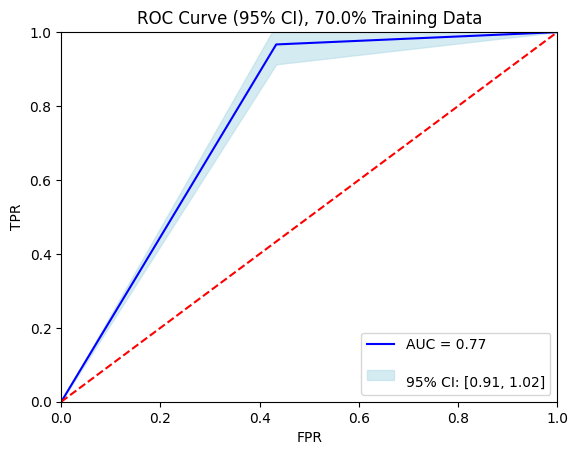

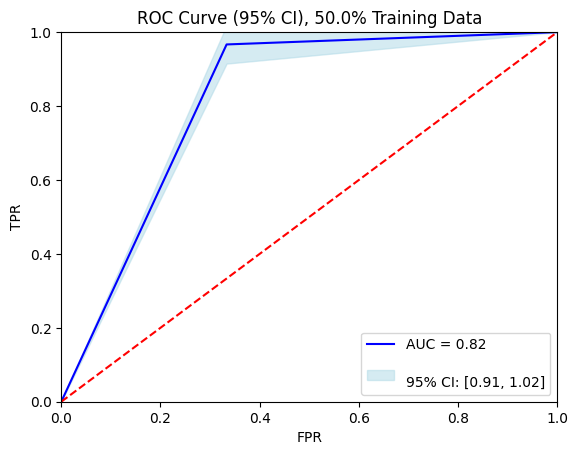

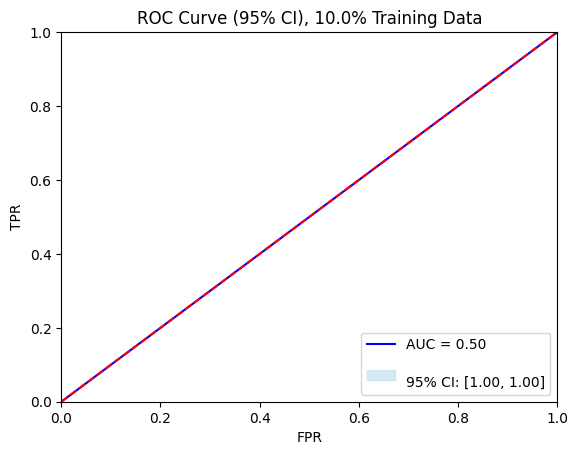

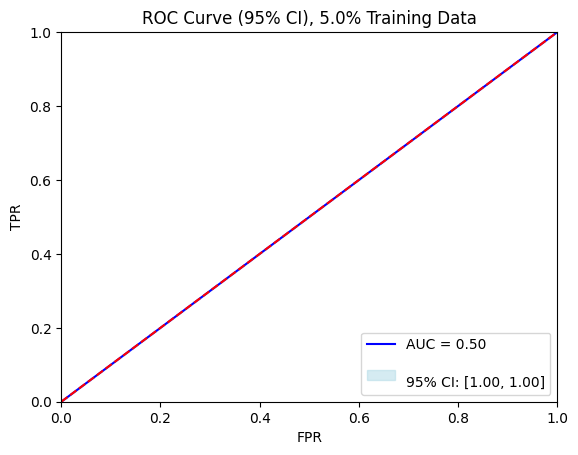

In [83]:
evaluate_ROC(train_set, y_test, pred_SVC)

### Confusion Matrix for Support Vector Classifier (Healthy_EVs vs Cancer_EVs)

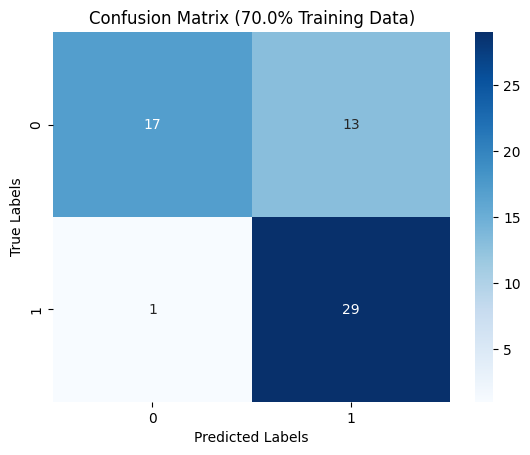

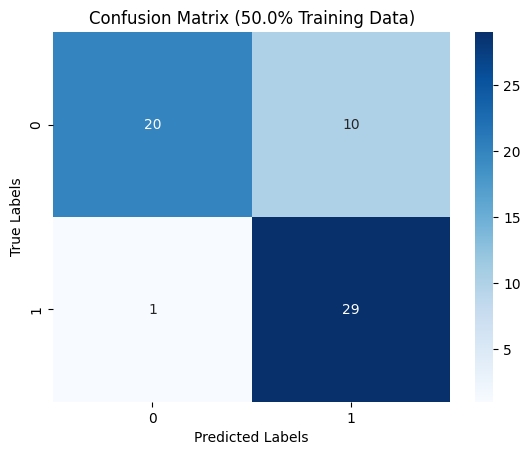

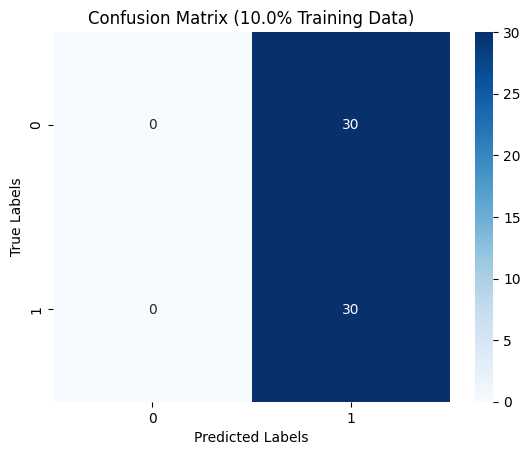

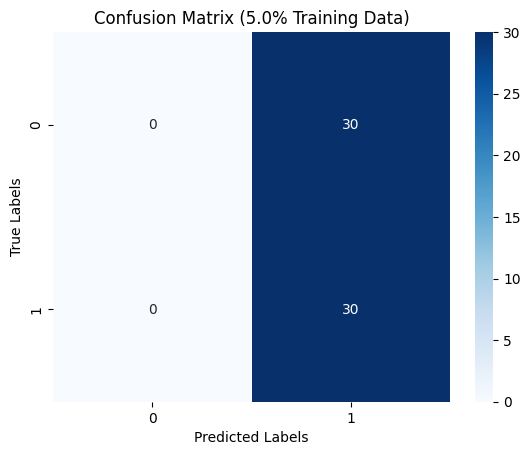

In [84]:
evaluate_con_mat(train_set, y_test, pred_SVC)

In [85]:
del acc_SVC, pred_SVC, train_data, pred_proba_SVC, best_params, clf_SVM

## Vector Quantum Classifier

In [86]:
#=====================Vector Quantum Classifier Model with different training sets================
scaler = MinMaxScaler()
train_features = scaler.fit_transform(X_train)
train_labels = y_train
test_features = scaler.transform(X_test)
test_labels = y_test
num_features = train_features.shape[1]
feature_map = ZZFeatureMap(feature_dimension=num_features, reps=1)

In [87]:
# del X_train, y_train

In [88]:
ansatz = EfficientSU2(num_qubits=num_features,entanglement='sca', reps=2)

In [89]:
optimizer = op.COBYLA(maxiter=300)

In [90]:
sampler = Sampler()

### Vector Quantum Classifier with Hyperparameter Tuning (Healthy_EVs vs Cancer_EVs)

In [91]:
#======================================VQC=================================================
clf_vqc = VQC(
    sampler=sampler,
    feature_map=feature_map,
    ansatz=ansatz,
    loss = 'squared_error',
    optimizer=optimizer
)
acc_vqtask1 = []
pred_vqtask1 = []
for elm in train_set:
    vqc = copy.deepcopy(clf_vqc)
    X_t, dummy_x, y_t, dummy_y = train_test_split(train_features, train_labels, train_size=elm, random_state=algorithm_globals.random_seed)
    vqc.fit(X_t, y_t.values)
    start = time.time()
    pred = vqc.predict(test_features)
    end = time.time()
    accuracy = accuracy_score(test_labels.values, pred)
    execution_time = end-start
    pred_vqtask1.append(pred)
    acc_vqtask1.append(accuracy)
    print(f'Accuracy score(VQC Model): {accuracy} with {elm*100}% training records')
    print(f'Execution Time(VQC Model): {execution_time} seconds with {elm*100}% training records')
    print()
#======================================VQC=================================================

Accuracy score(VQC Model): 0.7333333333333333 with 70.0% training records
Execution Time(VQC Model): 0.39510512351989746 seconds with 70.0% training records

Accuracy score(VQC Model): 0.6833333333333333 with 50.0% training records
Execution Time(VQC Model): 0.392291784286499 seconds with 50.0% training records

Accuracy score(VQC Model): 0.4 with 10.0% training records
Execution Time(VQC Model): 0.24554800987243652 seconds with 10.0% training records

Accuracy score(VQC Model): 0.5166666666666667 with 5.0% training records
Execution Time(VQC Model): 0.24446678161621094 seconds with 5.0% training records



## Learning Curve for VQC

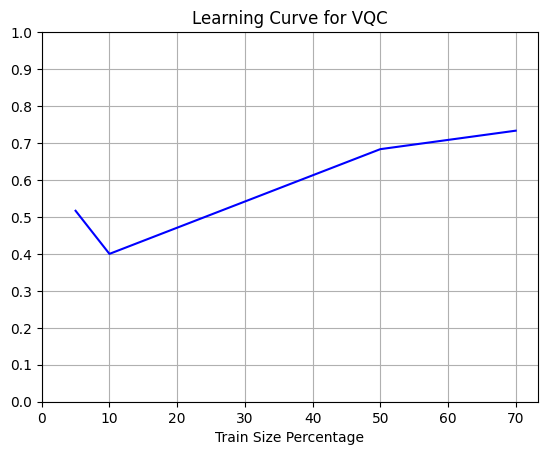

In [73]:
#===============================Learning Curve for VQC===========================================
plt.plot(training_sample,acc_vqtask1, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for VQC')
plt.show()

### 3D Scatter Plot for VQC Model (Healthy_EVs vs Cancer_EVs)

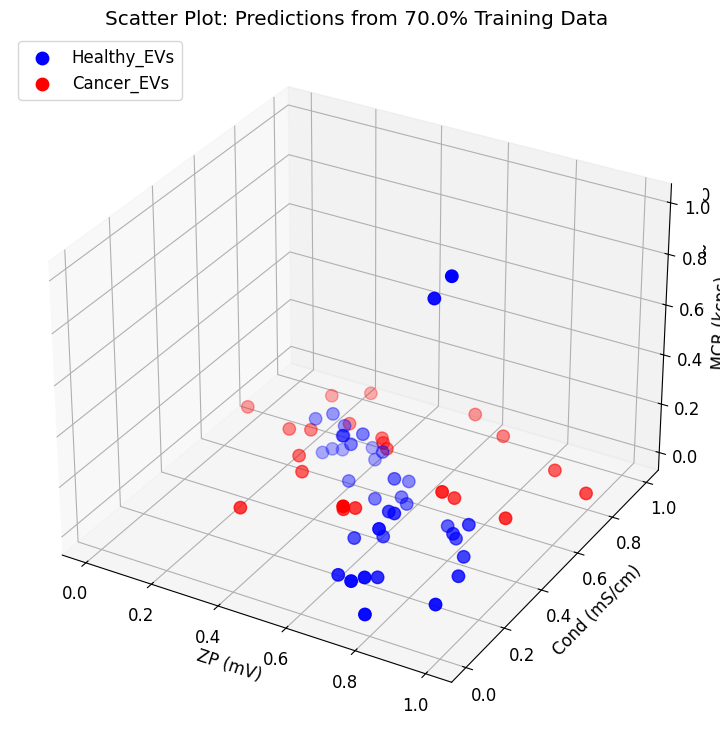

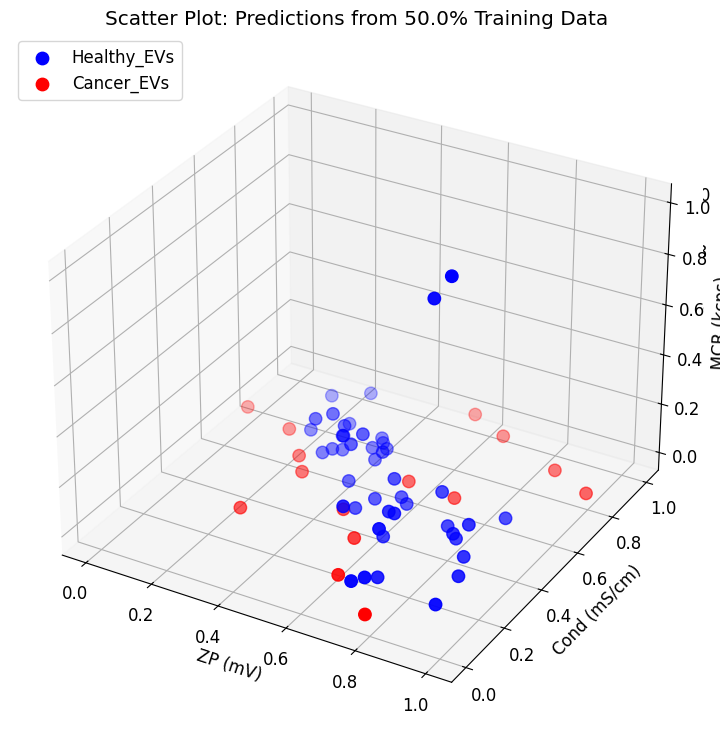

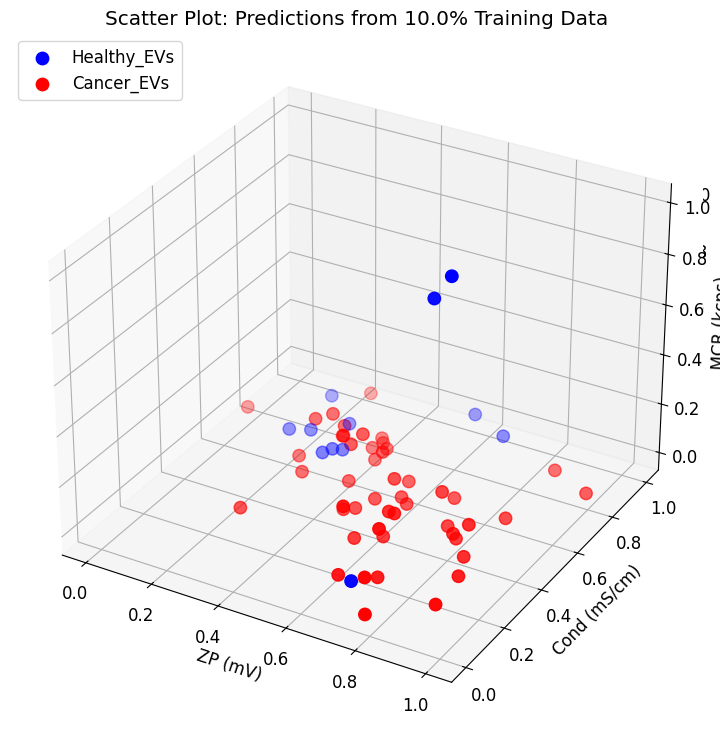

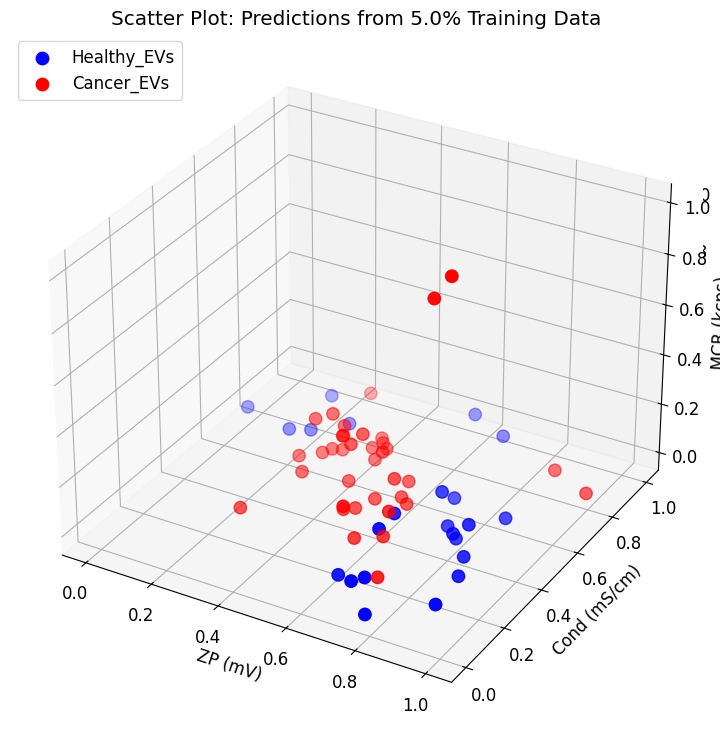

In [93]:
#=======================================3D Scatter Plot===============================
for i in range(len(train_set)):
    plt.rcParams.update({'font.size': 12})
    fig = plt.figure(figsize=(9,9))
    ax = plt.subplot(1,1,1,projection='3d')
    ax = fig.add_subplot(111,projection='3d')
    ax.scatter(test_features[pred_vqtask1[i]==0,0], test_features[pred_vqtask1[i]==0,1], test_features[pred_vqtask1[i]==0,2], c='blue', marker='o', label='Healthy_EVs', s=80)
    ax.scatter(test_features[pred_vqtask1[i]==1,0], test_features[pred_vqtask1[i]==1,1], test_features[pred_vqtask1[i]==1,2], c='red', marker='o', label='Cancer_EVs',s=80)
  # Set labels for each axis
    ax.set_xlabel('ZP (mV)')
    ax.set_ylabel('Cond (mS/cm)')
    ax.set_zlabel('MCR (kcps)')
    ax.set_title(f'Scatter Plot: Predictions from {train_set[i]*100}% Training Data')
    ax.tick_params("z", which="major",length=15,width = 2.0)
    ax.legend(loc='upper left')
    plt.show()

### ROC Curve for Vector Quantum Classifier (Healthy_EVs vs Cancer_EVs)

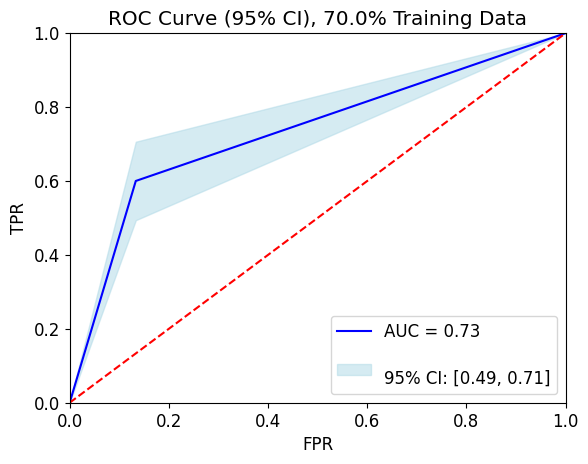

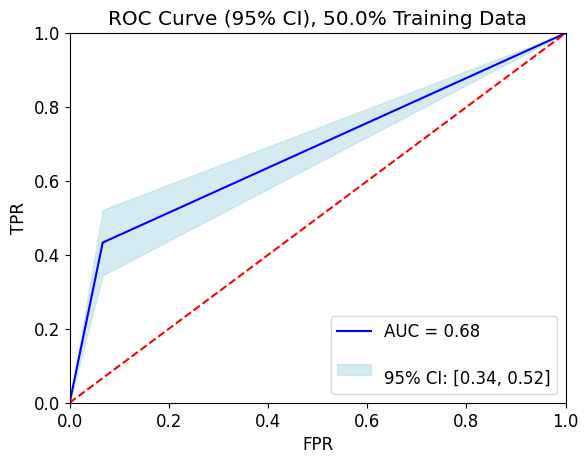

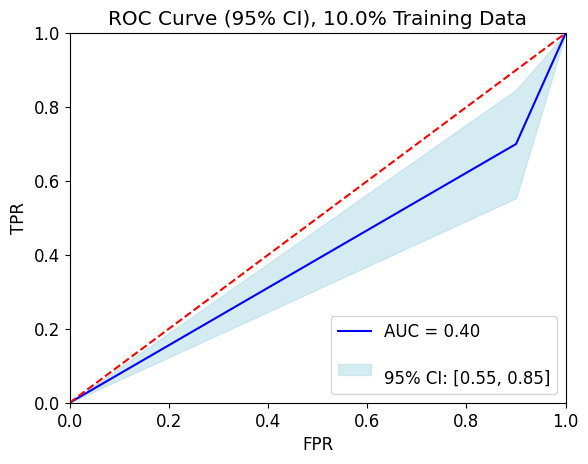

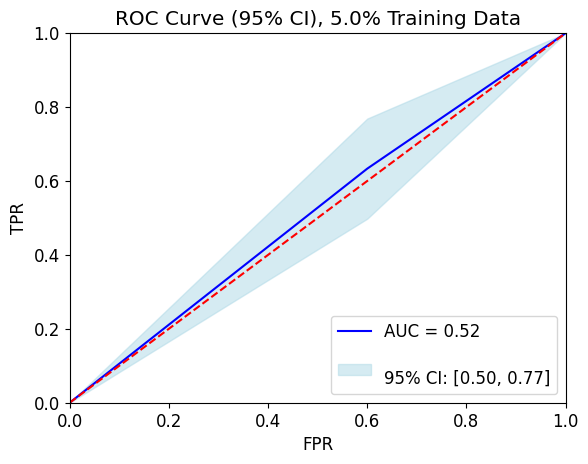

In [94]:
evaluate_ROC(train_set, test_labels, pred_vqtask1)

### Confusion Matrix for Vector Quantum Classifier (Healthy_EVs vs Cancer_EVs)

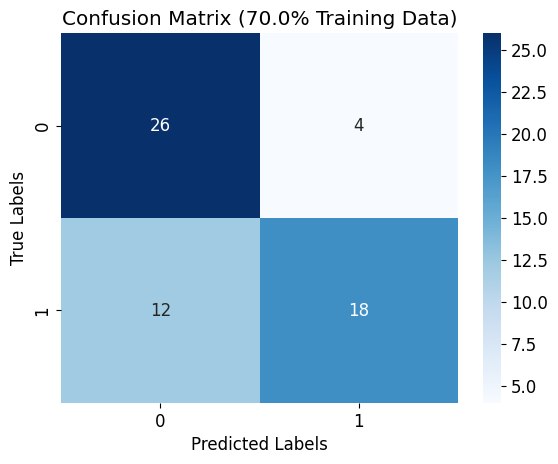

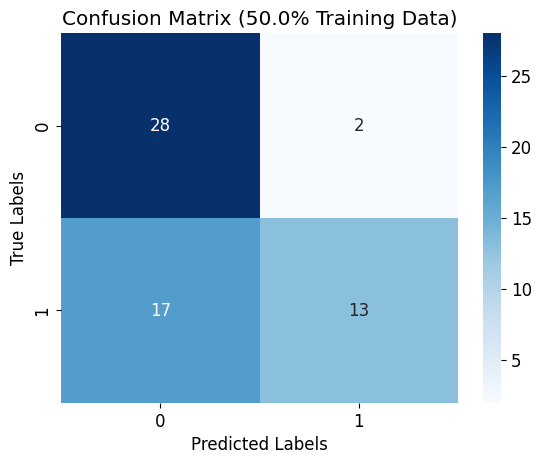

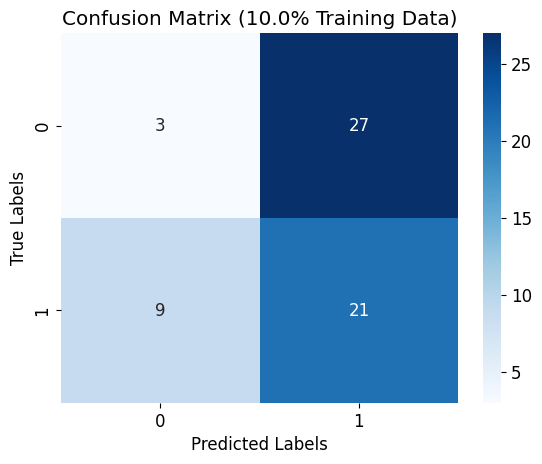

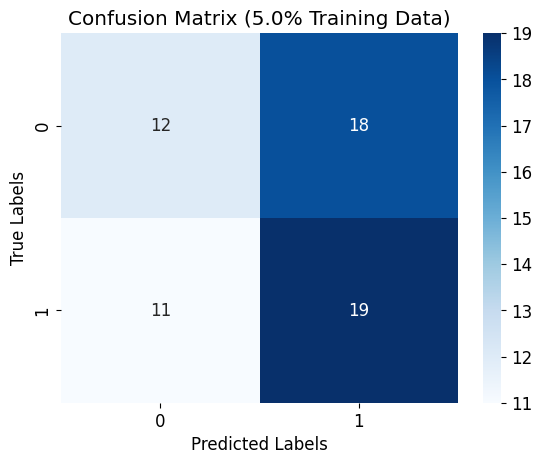

In [95]:
evaluate_con_mat(train_set, test_labels, pred_vqtask1)

# <center><h1><b>Task 2 (Healthy_EVs vs Healthy_EVs_NPs)</b></h1></center>

In [96]:
#==================Predictor Variables for dataset 2=====================================
X_train = dataset2[['Zeta Potential', 'Cond', 'Mean Count Rate']]
X_test = dataset7[['Zeta Potential', 'Cond', 'Mean Count Rate']]
#===================Output Variable========================================
y_train = dataset2['Sample Name']
y_test = dataset7['Sample Name']
y_train = y_train.map(lambda x: 1 if x == 3 else 0)
y_test = y_test.map(lambda x: 1 if x == 3 else 0)

## Logistic Regression

### Logistic Regression without hyperparameter tuning

In [73]:
#=====================Logistic Regression Model with different training sets================
eval_mod=evaluate_model(LogisticRegression(solver='lbfgs', max_iter=1000), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.966667 with 70.0% training records
Execution Time(LogisticRegression model): 0.008121 seconds with 70.0% training records

Accuracy score(LogisticRegression model): 0.966667 with 50.0% training records
Execution Time(LogisticRegression model): 0.007426 seconds with 50.0% training records

Accuracy score(LogisticRegression model): 0.783333 with 10.0% training records
Execution Time(LogisticRegression model): 0.007164 seconds with 10.0% training records

Accuracy score(LogisticRegression model): 0.966667 with 5.0% training records
Execution Time(LogisticRegression model): 0.007556 seconds with 5.0% training records



In [74]:
#===============================Hyperparameter Tuning================================
warnings.filterwarnings("ignore", category=ConvergenceWarning)
clf_LR = LogisticRegression(solver = 'lbfgs', max_iter=1000)
param_grid = { 'C': [0.001, 0.01, 0.1, 1, 10, 100],'penalty': ['l2'], 'solver': ['newton-cg','lbfgs' ,'liblinear', 'saga']}
grid_search = GridSearchCV(clf_LR, param_grid, cv=10, verbose=0 ,scoring='accuracy')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}


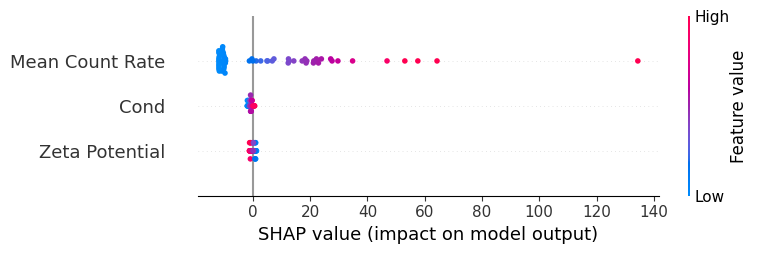

In [75]:
best_model = grid_search.best_estimator_
# Use SHAP's LinearExplainer with the best model
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    explainer = shap.LinearExplainer(best_model, X_train, feature_perturbation="interventional")
    shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values,X_test)

### Logistic Regression with hyperparameter tuning

In [76]:
#==============================Logistic Regression Model with Hyperparameter Tuning===========================
acc_LR, pred_LR, train_data, pred_proba_LR = evaluate_model(LogisticRegression(solver = best_params['solver'], penalty=best_params['penalty'], C = best_params['C']), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.966667 with 70.0% training records
Execution Time(LogisticRegression model): 0.007402 seconds with 70.0% training records

Accuracy score(LogisticRegression model): 0.966667 with 50.0% training records
Execution Time(LogisticRegression model): 0.007346 seconds with 50.0% training records

Accuracy score(LogisticRegression model): 0.783333 with 10.0% training records
Execution Time(LogisticRegression model): 0.007087 seconds with 10.0% training records

Accuracy score(LogisticRegression model): 0.966667 with 5.0% training records
Execution Time(LogisticRegression model): 0.007121 seconds with 5.0% training records



### Learning Curve for Logistic Regression

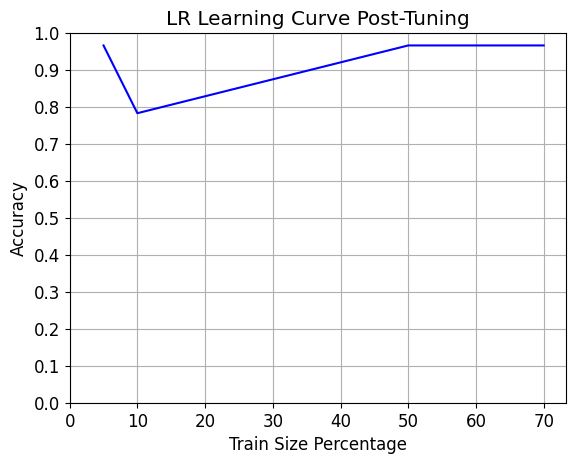

In [77]:
#===============================Learning Curve for LR===========================================
plt.plot(training_sample,acc_LR, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Logistic Regression

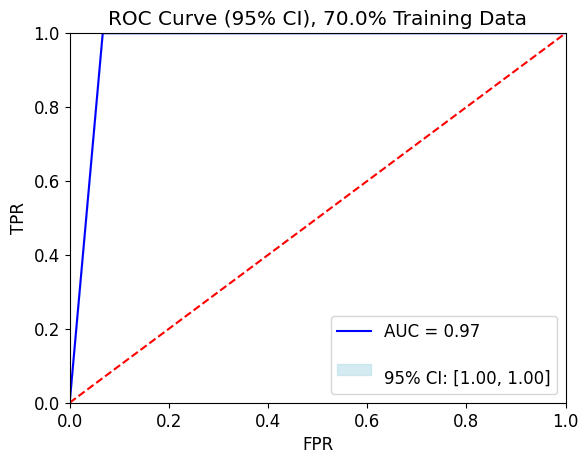

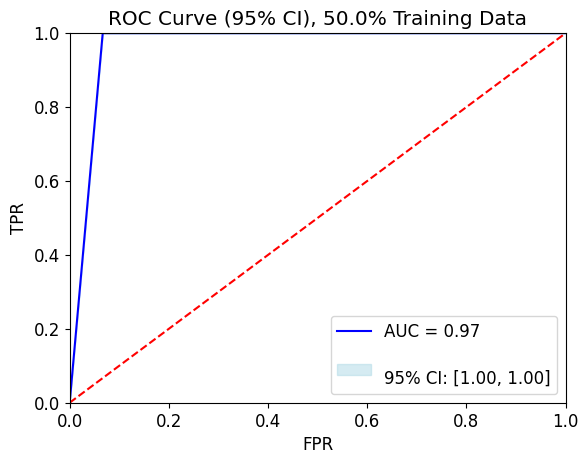

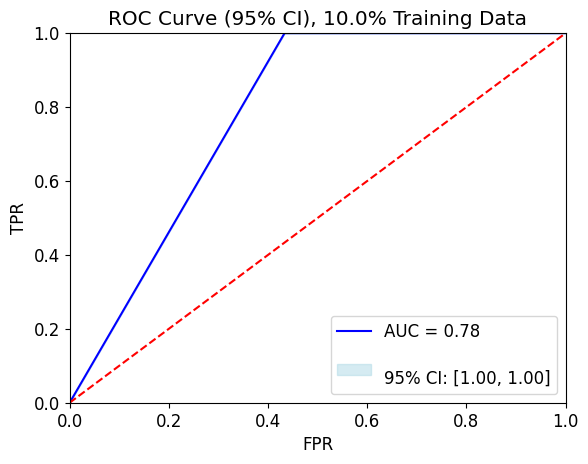

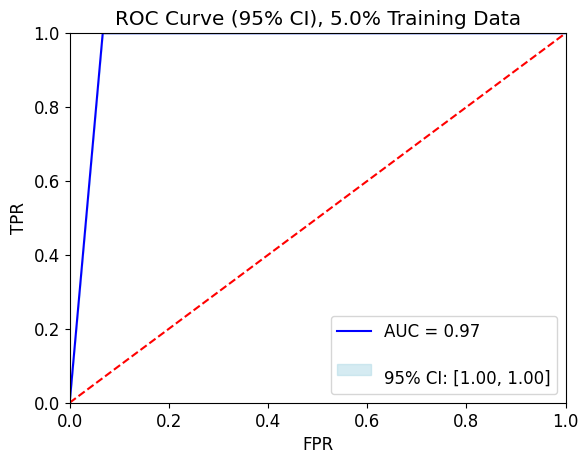

In [78]:
evaluate_ROC(train_set, y_test, pred_LR)

### Confusion Matrix for Logistic Regression

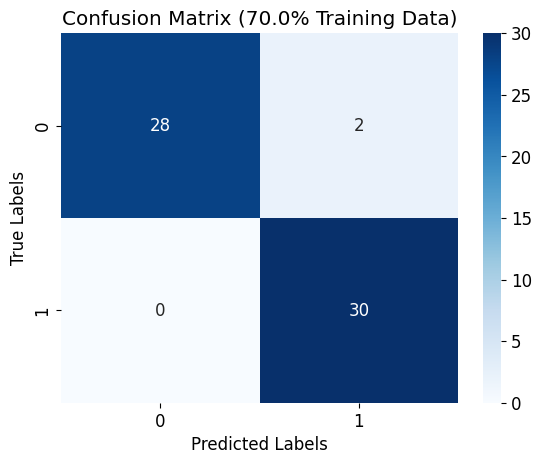

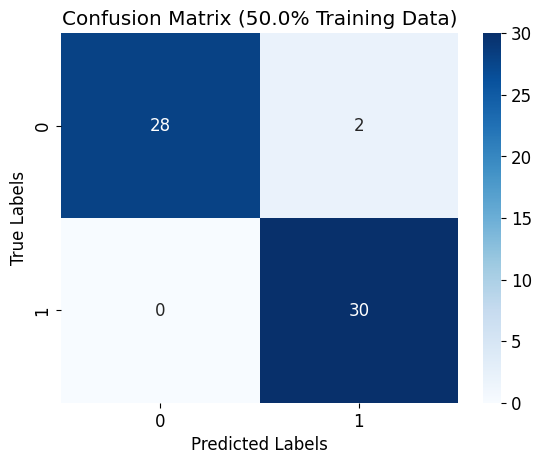

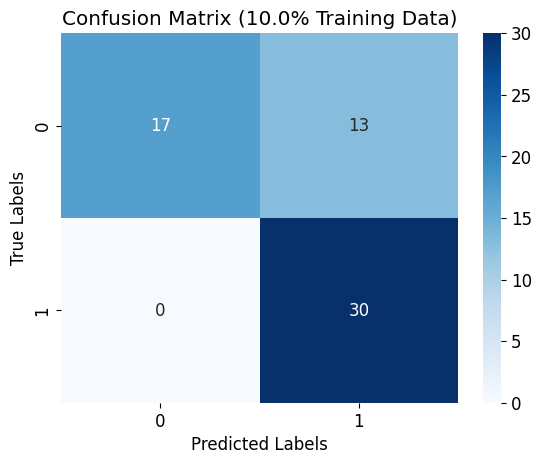

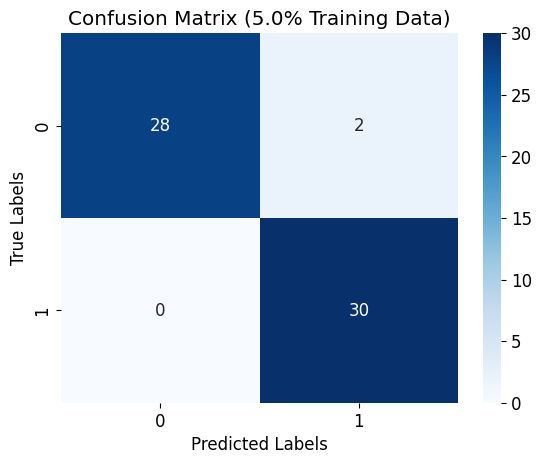

In [79]:
evaluate_con_mat(train_set, y_test, pred_LR)

In [80]:
del acc_LR, pred_LR, train_data, pred_proba_LR, best_params, clf_LR

## Random Forest

### Random Forest without hyperparameter tuning

In [81]:
eval_mod=evaluate_model(RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10), train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.983333 with 70.0% training records
Execution Time(RandomForestClassifier model): 0.172179 seconds with 70.0% training records

Accuracy score(RandomForestClassifier model): 0.966667 with 50.0% training records
Execution Time(RandomForestClassifier model): 0.170105 seconds with 50.0% training records

Accuracy score(RandomForestClassifier model): 0.500000 with 10.0% training records
Execution Time(RandomForestClassifier model): 0.168189 seconds with 10.0% training records

Accuracy score(RandomForestClassifier model): 0.500000 with 5.0% training records
Execution Time(RandomForestClassifier model): 0.168574 seconds with 5.0% training records



In [82]:
#==============================Hyperparameter  Tuning======================================
clf_RF = RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10)
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
}
grid_search = GridSearchCV(estimator=clf_RF, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 200}


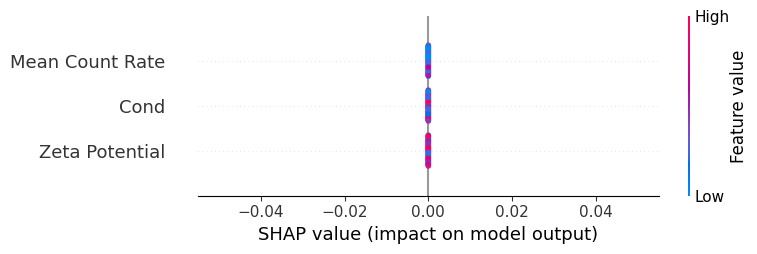

In [83]:
X_train_norm = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_norm = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
explainer_rf = shap.Explainer(grid_search.best_estimator_, X_train_norm)
shap_values_rf = explainer_rf(X_test_norm)
shap_values_class_1 = shap_values_rf.values[..., 1]
shap.summary_plot(shap_values_class_1, X_test_norm)

### Random Forest with hyperparameter tuning

In [84]:
#==============================Random Forest Model with Hyperparameter Tuning===========================
acc_RF, pred_RF, train_data, pred_proba_RF = evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 1.000000 with 70.0% training records
Execution Time(RandomForestClassifier model): 0.117253 seconds with 70.0% training records

Accuracy score(RandomForestClassifier model): 1.000000 with 50.0% training records
Execution Time(RandomForestClassifier model): 0.117055 seconds with 50.0% training records

Accuracy score(RandomForestClassifier model): 0.966667 with 10.0% training records
Execution Time(RandomForestClassifier model): 0.116317 seconds with 10.0% training records

Accuracy score(RandomForestClassifier model): 0.966667 with 5.0% training records
Execution Time(RandomForestClassifier model): 0.116479 seconds with 5.0% training records



### Learning Curve for Random Forest

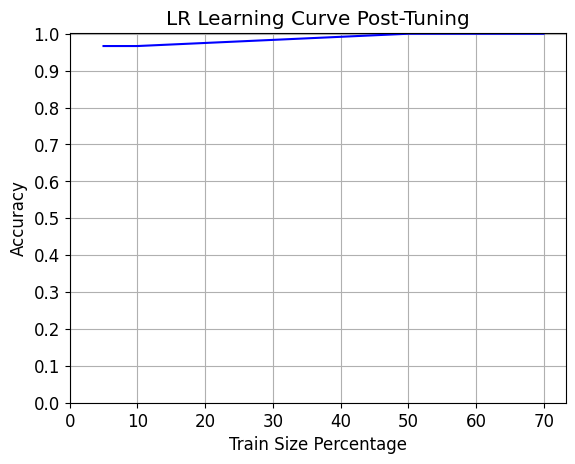

In [85]:
#===============================Learning Curve for Random Forest===========================================
plt.plot(training_sample,acc_RF, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Random Forest

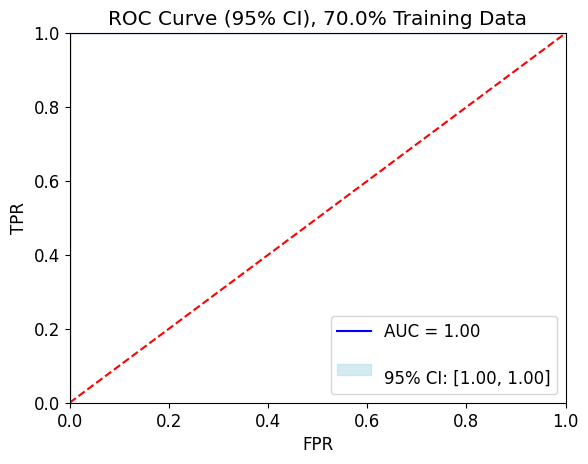

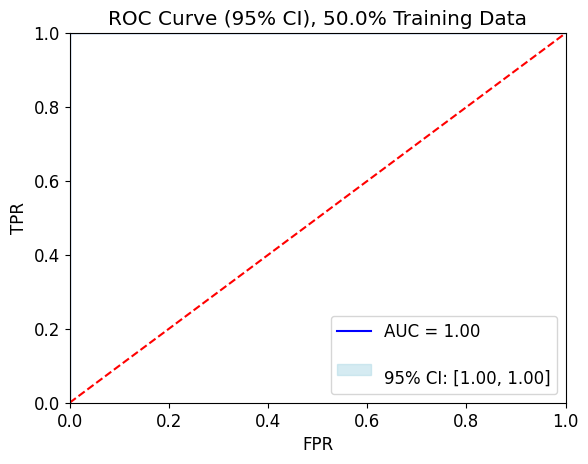

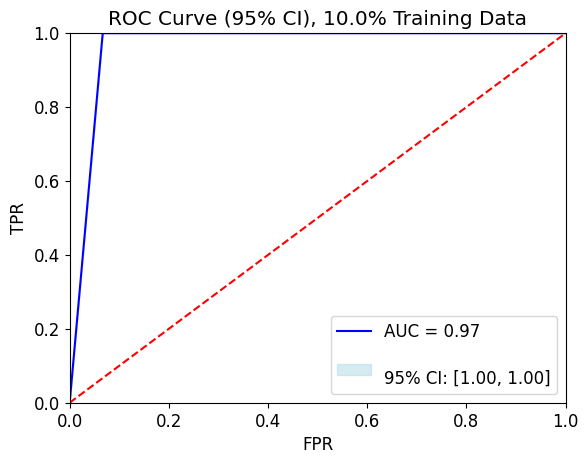

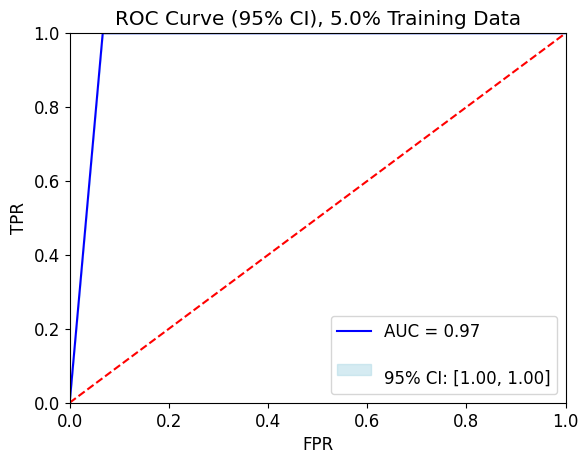

In [86]:
evaluate_ROC(train_set, y_test, pred_RF)

### Confusion Matrix for Random Forest

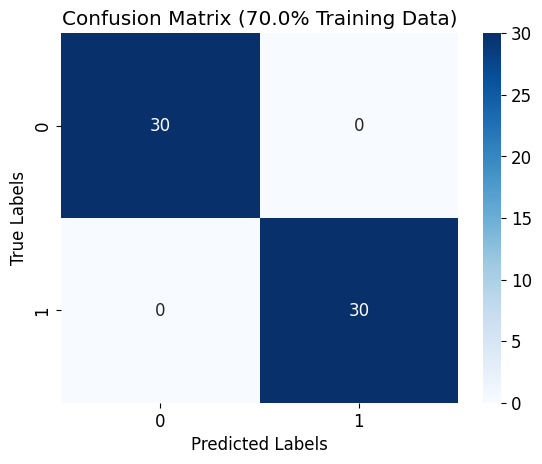

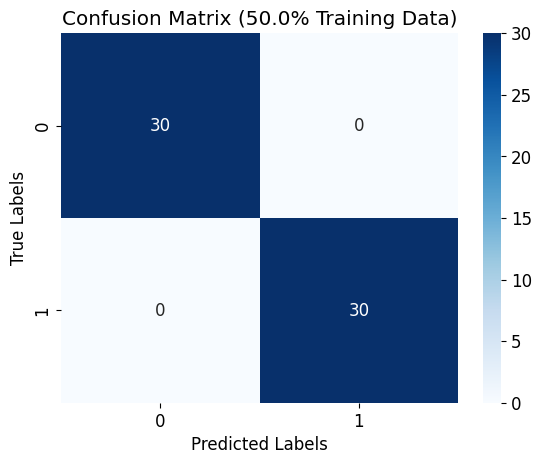

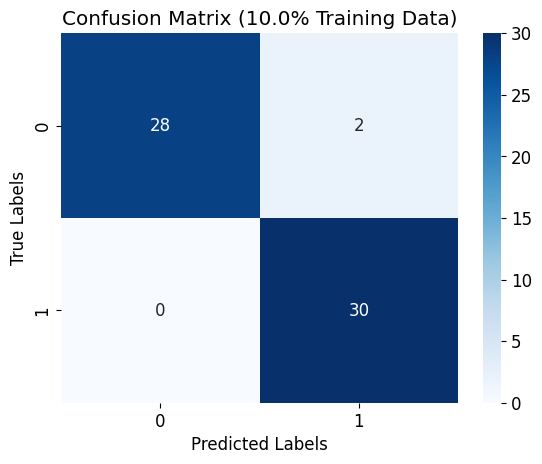

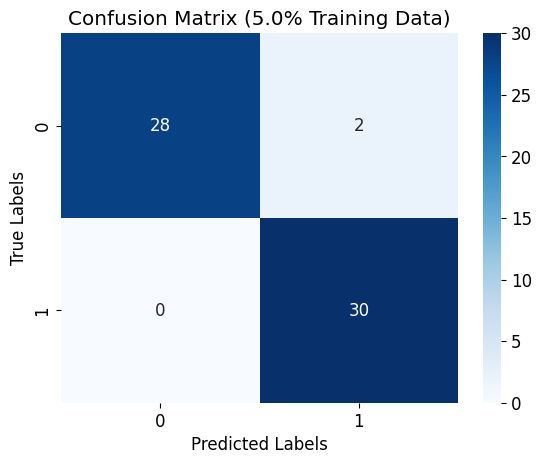

In [87]:
evaluate_con_mat(train_set, y_test, pred_RF)

In [88]:
del  acc_RF, pred_RF, train_data, pred_proba_RF, best_params, clf_RF

## Support Vector Classifier

### Support Vector Classifier without hyperparameter tuning

In [89]:
eval_mod=evaluate_model(SVC(kernel='sigmoid', probability=True, C = 100, gamma='auto'), train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.500000 with 70.0% training records
Execution Time(SVC model): 0.008471 seconds with 70.0% training records

Accuracy score(SVC model): 0.500000 with 50.0% training records
Execution Time(SVC model): 0.007672 seconds with 50.0% training records

Accuracy score(SVC model): 0.500000 with 10.0% training records
Execution Time(SVC model): 0.007056 seconds with 10.0% training records

Accuracy score(SVC model): 0.500000 with 5.0% training records
Execution Time(SVC model): 0.007112 seconds with 5.0% training records



In [90]:
#==========================Hyperparameter Tuning==========================
clf_SVM = SVC(probability=True)
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': [0.01, 0.1]
}
grid_search = GridSearchCV(estimator=clf_SVM, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}


Using 140 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/60 [00:00<?, ?it/s]

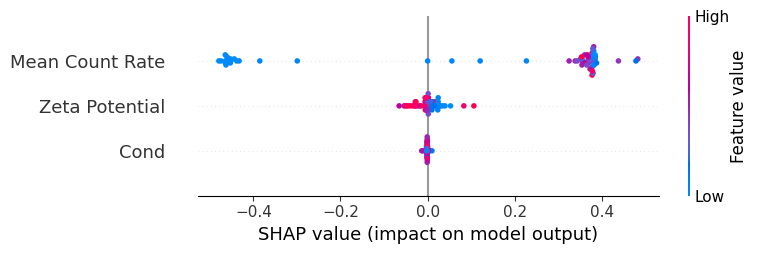

In [91]:
best_model = grid_search.best_estimator_
explainer_svc = shap.KernelExplainer(best_model.predict_proba, X_train)
shap_values_svc = explainer_svc(X_test)
shap_values_svc_class_1 = shap_values_svc.values[..., 1]
shap.summary_plot(shap_values_svc_class_1, X_test)

### Support Vector Classifier with hyperparameter tuning

In [92]:
acc_SVC, pred_SVC, train_data, pred_proba_SVC=evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.716667 with 70.0% training records
Execution Time(SVC model): 0.010268 seconds with 70.0% training records

Accuracy score(SVC model): 0.733333 with 50.0% training records
Execution Time(SVC model): 0.009215 seconds with 50.0% training records

Accuracy score(SVC model): 0.666667 with 10.0% training records
Execution Time(SVC model): 0.007500 seconds with 10.0% training records

Accuracy score(SVC model): 0.516667 with 5.0% training records
Execution Time(SVC model): 0.007252 seconds with 5.0% training records



### Learning Curve for Support Vector Classifier

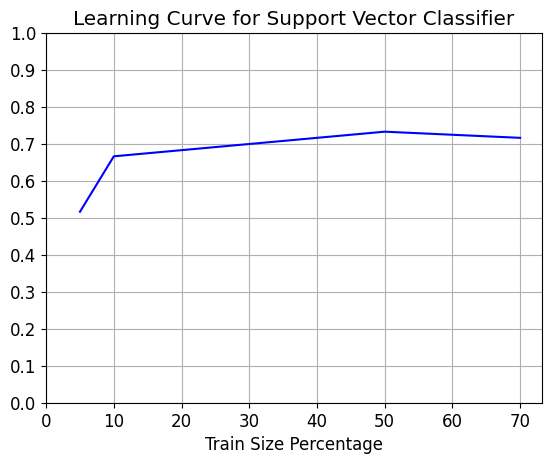

In [93]:
#===============================Learning Curve for SVC===========================================
plt.plot(training_sample,acc_SVC, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for Support Vector Classifier')
plt.show()

### ROC Curve for Support Vector Classifier

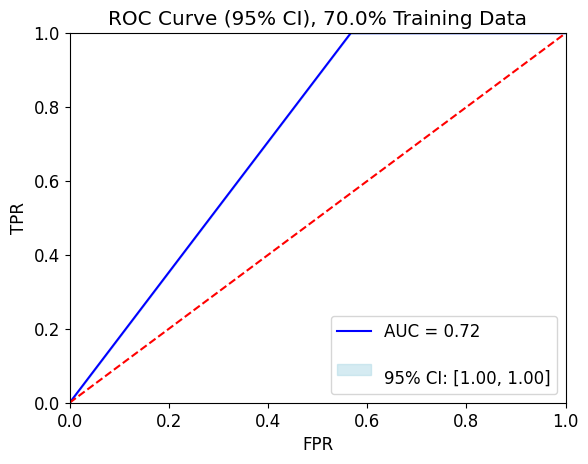

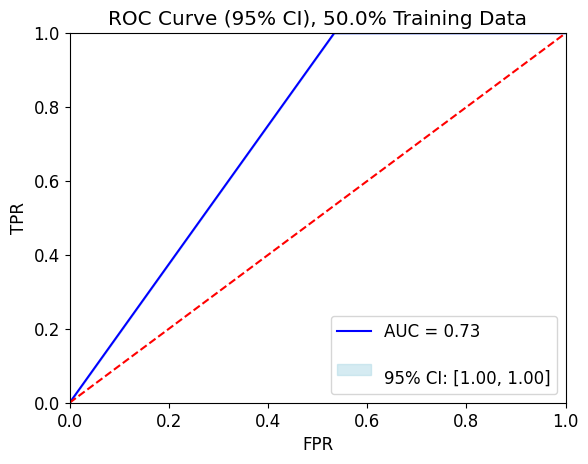

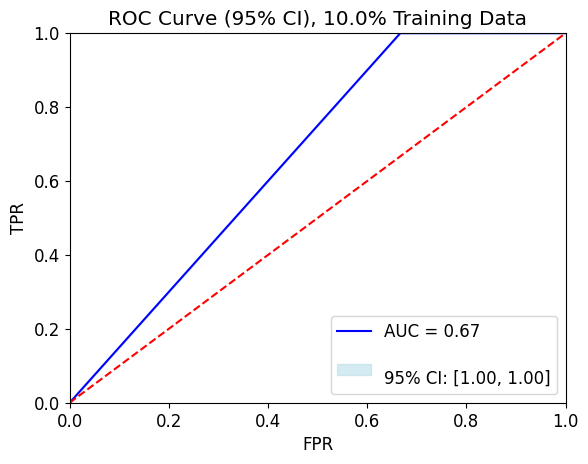

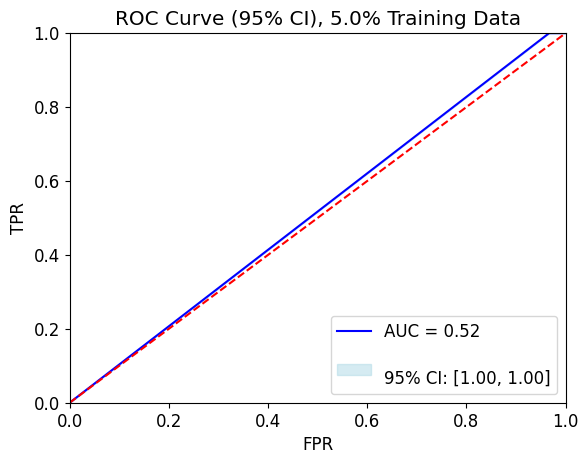

In [94]:
evaluate_ROC(train_set, y_test, pred_SVC)

### Confusion Matrix for Support Vector Classifier

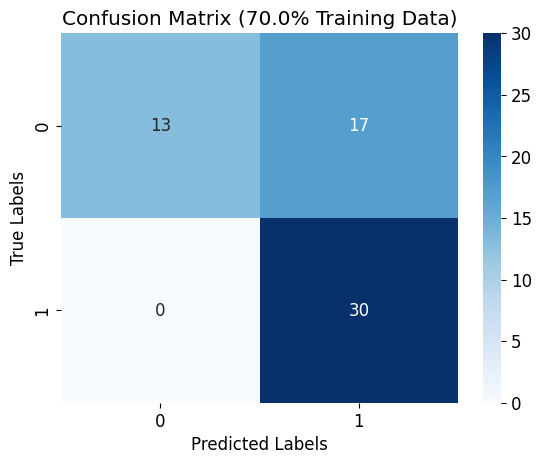

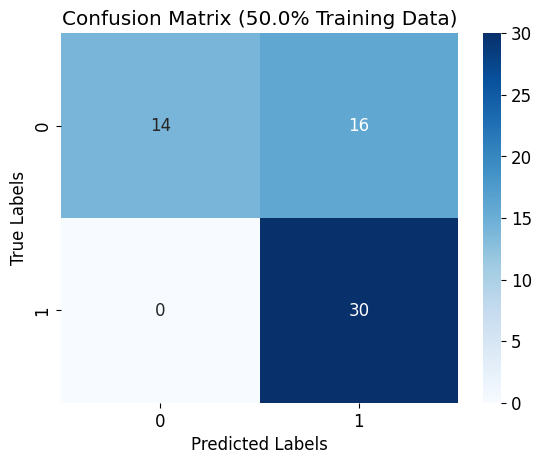

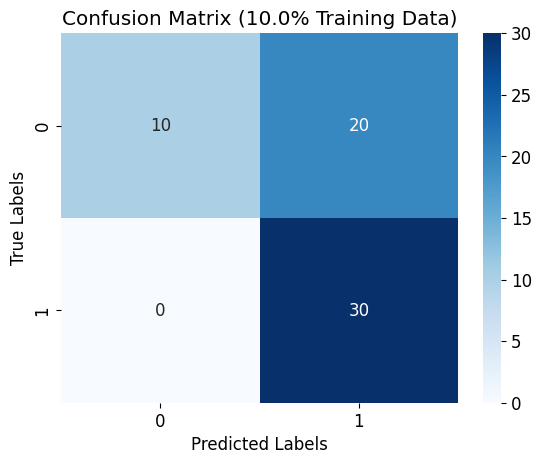

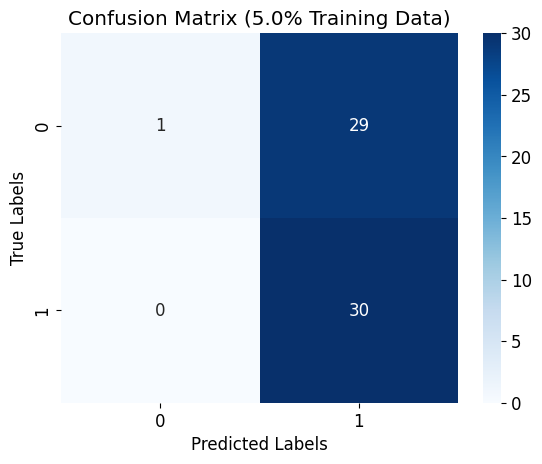

In [95]:
evaluate_con_mat(train_set, y_test, pred_SVC)

In [96]:
del acc_SVC, pred_SVC, train_data, pred_proba_SVC, best_params, clf_SVM

## Vector Quantum Classifier

In [97]:
#=====================Vector Quantum Classifier Model with different training sets================
train_features = MinMaxScaler().fit_transform(X_train)
train_labels = y_train
test_features = MinMaxScaler().fit_transform(X_test)
test_labels = y_test
num_features = train_features.shape[1]
feature_map = ZZFeatureMap(feature_dimension=num_features, reps=1)

In [98]:
# del X_train, y_train

In [99]:
ansatz = EfficientSU2(num_qubits=num_features, entanglement = 'sca', reps=1)

In [100]:
optimizer = op.POWELL(maxiter=150)

In [101]:
sampler = Sampler()

### Vector Quantum Classifier with Hyperparameter Tuning

In [102]:
#======================================VQC=================================================
clf_vqc = VQC(
    sampler=sampler,
    feature_map=feature_map,
    ansatz=ansatz,
    loss = 'squared_error',
    optimizer=optimizer
)
acc_vqtask1 = []
pred_vqtask1 = []
for elm in train_set:
    vqc=copy.deepcopy(clf_vqc)
    X_t, dummy_x, y_t, dummy_y = train_test_split(train_features, train_labels, train_size=elm, random_state=algorithm_globals.random_seed)
    vqc.fit(X_t, y_t.values)
    start = time.time()
    pred = vqc.predict(test_features)
    end = time.time()
    accuracy = accuracy_score(test_labels.values, pred)
    execution_time = end-start
    pred_vqtask1.append(pred)
    acc_vqtask1.append(accuracy)
    print(f'Accuracy score(VQC Model): {accuracy} with {elm*100}% training records')
    print(f'Execution Time(VQC Model): {execution_time} seconds with {elm*100}% training records')
    print()
#======================================VQC=================================================

Accuracy score(VQC Model): 0.7666666666666667 with 70.0% training records
Execution Time(VQC Model): 0.19978833198547363 seconds with 70.0% training records

Accuracy score(VQC Model): 0.8 with 50.0% training records
Execution Time(VQC Model): 0.1997849941253662 seconds with 50.0% training records

Accuracy score(VQC Model): 0.6333333333333333 with 10.0% training records
Execution Time(VQC Model): 0.199873685836792 seconds with 10.0% training records

Accuracy score(VQC Model): 0.8666666666666667 with 5.0% training records
Execution Time(VQC Model): 0.19422459602355957 seconds with 5.0% training records



## Learning Curve for VQC

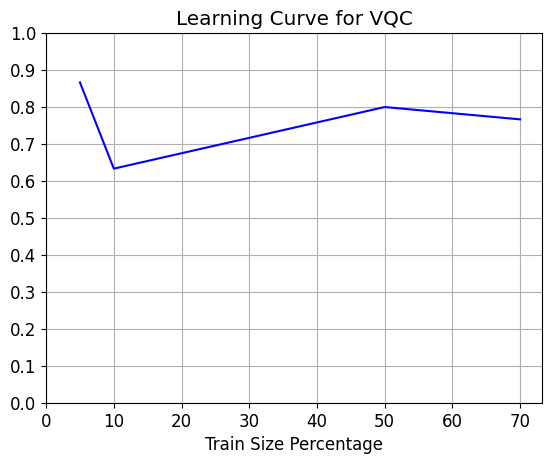

In [103]:
#===============================Learning Curve for VQC===========================================
plt.plot(training_sample,acc_vqtask1, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for VQC')
plt.show()

### 3D Scatter Plot for VQC Model

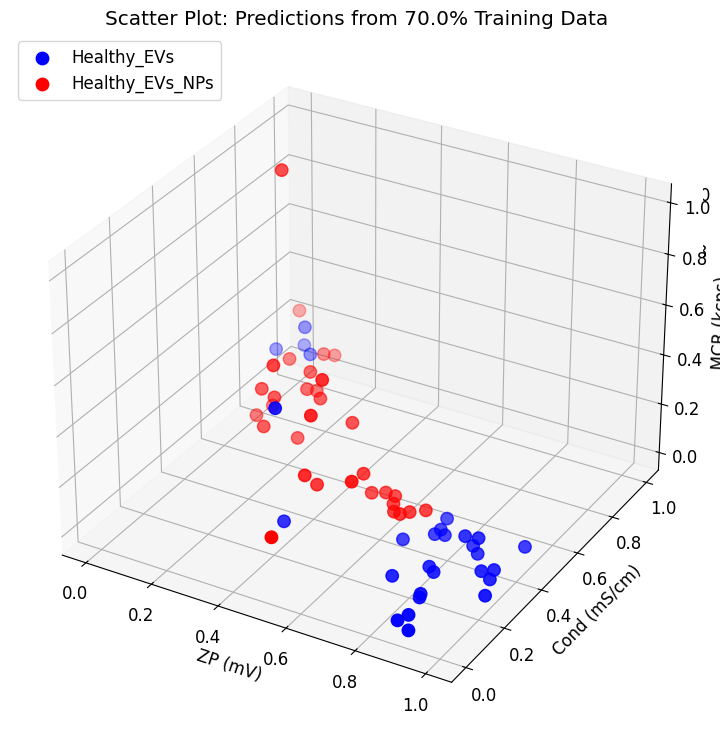

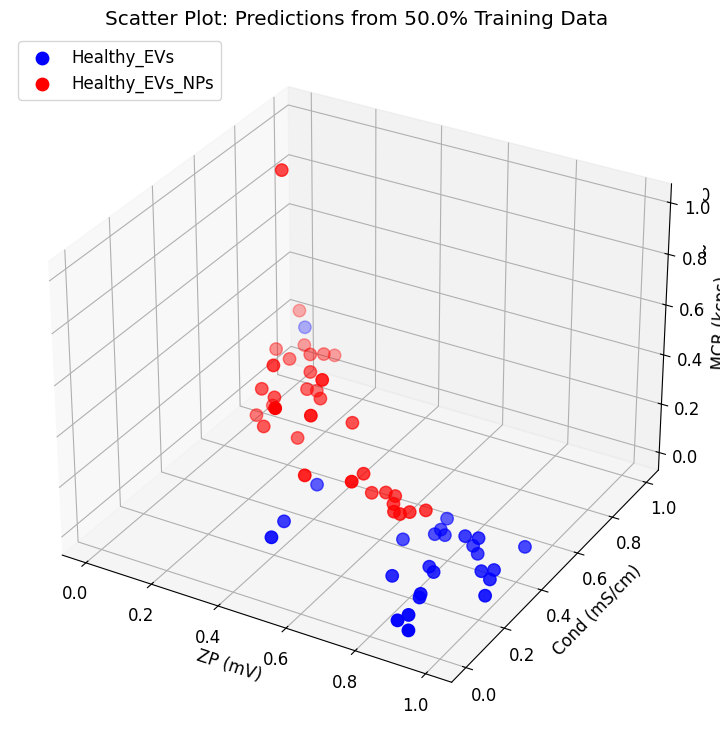

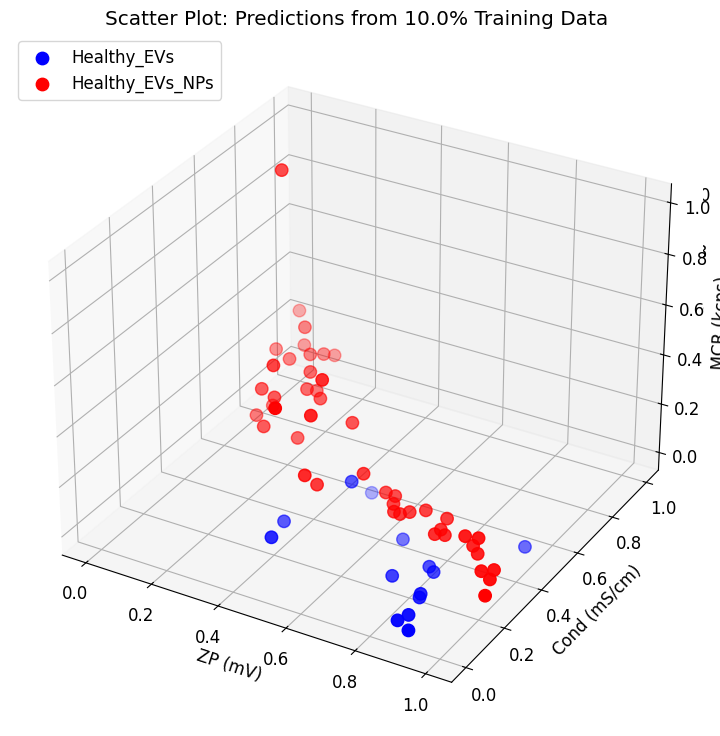

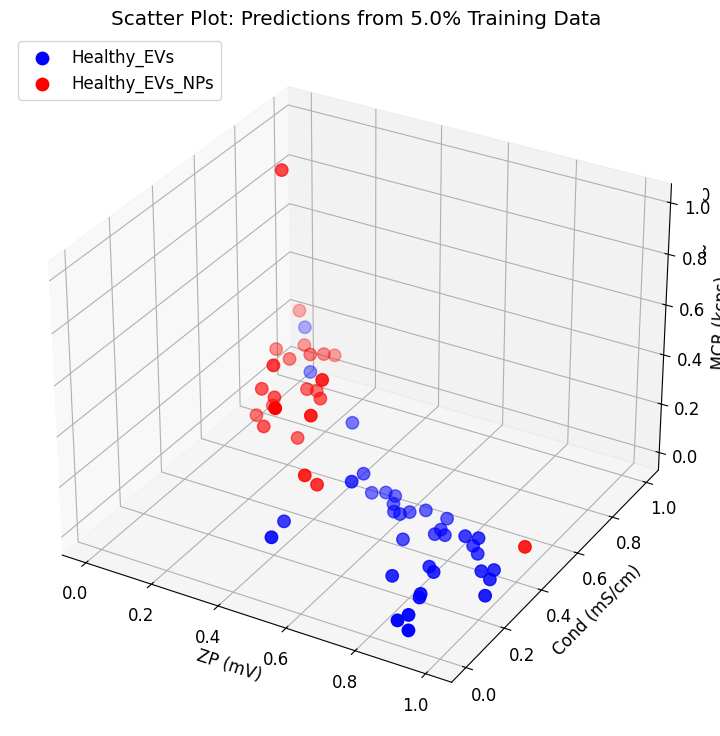

In [104]:
#=======================================3D Scatter Plot===============================
for i in range(len(train_set)):
    plt.rcParams.update({'font.size': 12})
    fig = plt.figure(figsize=(9,9))
    ax = plt.subplot(1,1,1,projection='3d')
    ax = fig.add_subplot(111,projection='3d')
    ax.scatter(test_features[pred_vqtask1[i]==0,0], test_features[pred_vqtask1[i]==0,1], test_features[pred_vqtask1[i]==0,2], c='blue', marker='o', label='Healthy_EVs', s=80)
    ax.scatter(test_features[pred_vqtask1[i]==1,0], test_features[pred_vqtask1[i]==1,1], test_features[pred_vqtask1[i]==1,2], c='red', marker='o', label='Healthy_EVs_NPs',s=80)
  # Set labels for each axis
    ax.set_xlabel('ZP (mV)')
    ax.set_ylabel('Cond (mS/cm)')
    ax.set_zlabel('MCR (kcps)')
    ax.set_title(f'Scatter Plot: Predictions from {train_set[i]*100}% Training Data')
    ax.tick_params("z", which="major",length=15,width = 2.0)
    ax.legend(loc='upper left')
    plt.show()

### ROC Curve for Vector Quantum Classifier

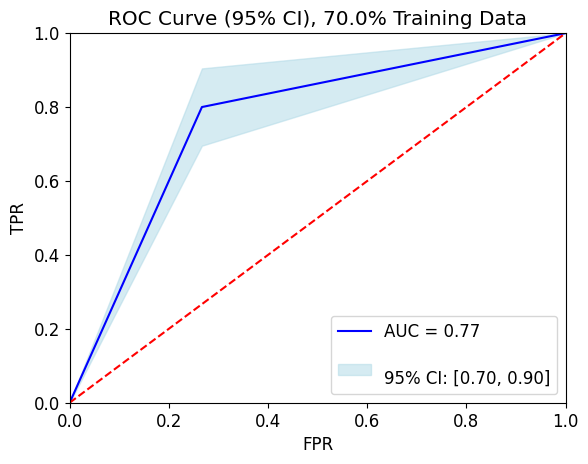

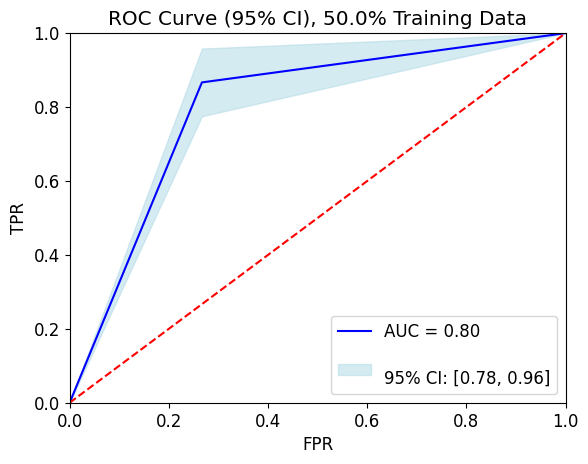

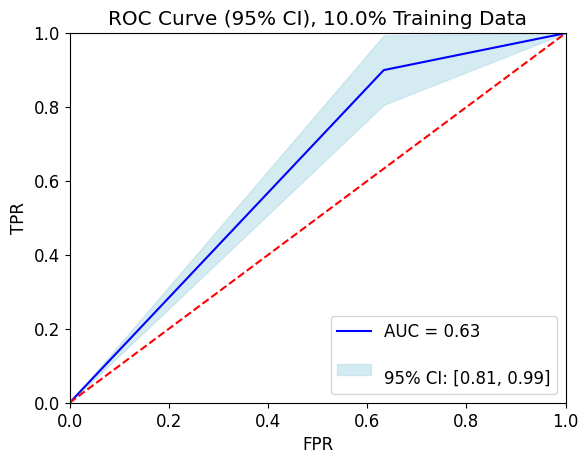

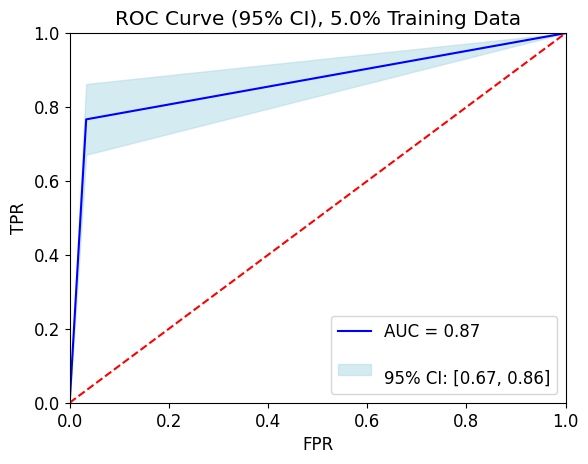

In [105]:
evaluate_ROC(train_set, test_labels, pred_vqtask1)

### Confusion Matrix for Vector Quantum Classifier

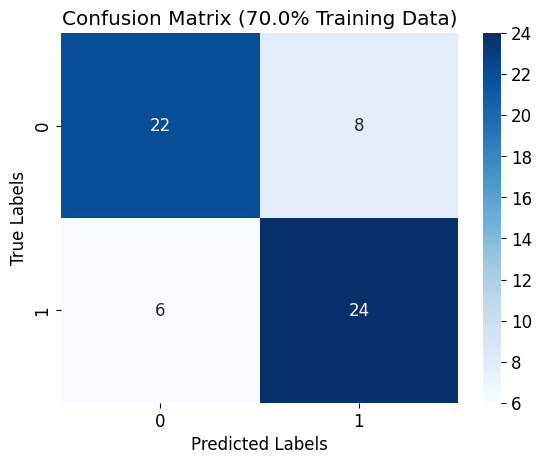

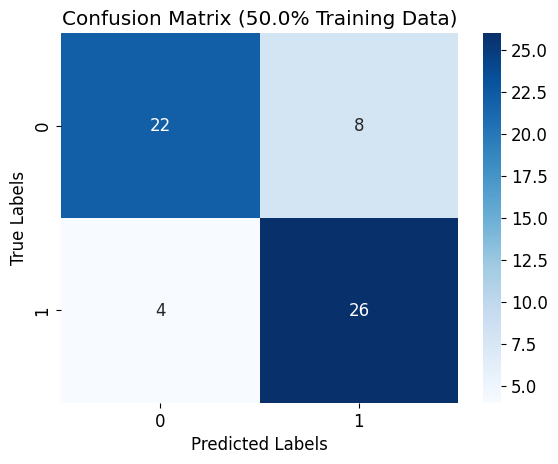

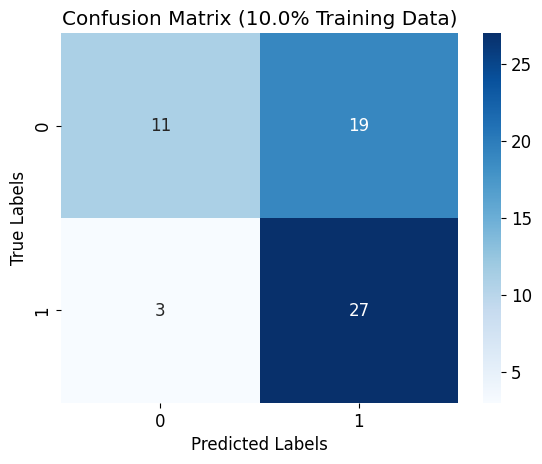

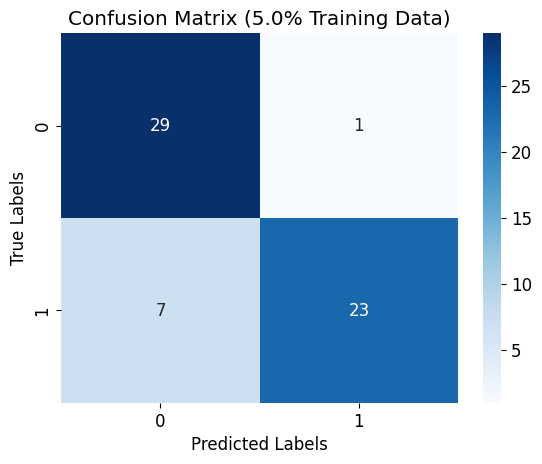

In [106]:
evaluate_con_mat(train_set, test_labels, pred_vqtask1)

# <center><h1><b>Task 3 (Cancer_EVs vs Cancer_EVs_NPs)</b></h1></center>

In [116]:
#==================Predictor Variables for dataset 3===================================
X_train = dataset3[['Zeta Potential', 'Cond', 'Mean Count Rate']]
X_test = dataset8[['Zeta Potential', 'Cond', 'Mean Count Rate']]
#===================Output Variable========================================
y_train = dataset3['Sample Name']
y_test = dataset8['Sample Name']
y_train = y_train.map(lambda x: 1 if x == 2 else 0)
y_test = y_test.map(lambda x: 1 if x == 2 else 0)

## Logistic Regression

### Logistic Regression without hyperparameter tuning

In [108]:
#=====================Logistic Regression Model with different training sets================
eval_mod=evaluate_model(LogisticRegression(solver='lbfgs', max_iter=1000), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 1.000000 with 70.0% training records
Execution Time(LogisticRegression model): 0.007578 seconds with 70.0% training records

Accuracy score(LogisticRegression model): 1.000000 with 50.0% training records
Execution Time(LogisticRegression model): 0.006900 seconds with 50.0% training records

Accuracy score(LogisticRegression model): 1.000000 with 10.0% training records
Execution Time(LogisticRegression model): 0.007012 seconds with 10.0% training records

Accuracy score(LogisticRegression model): 1.000000 with 5.0% training records
Execution Time(LogisticRegression model): 0.007089 seconds with 5.0% training records



In [109]:
#===============================Hyperparameter Tuning================================
import warnings
from sklearn.exceptions import ConvergenceWarning
# Supressing Warning related to convergence
warnings.filterwarnings("ignore", category=ConvergenceWarning)

clf_LR = LogisticRegression(solver = 'lbfgs', max_iter=1000)
param_grid = { 'C': [0.001, 0.01, 0.1, 1, 10, 100],'penalty': ['l2'], 'solver': ['newton-cg','lbfgs' ,'liblinear', 'saga']}
grid_search = GridSearchCV(clf_LR, param_grid, cv=10, verbose=0 ,scoring='accuracy')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 0.01, 'penalty': 'l2', 'solver': 'newton-cg'}


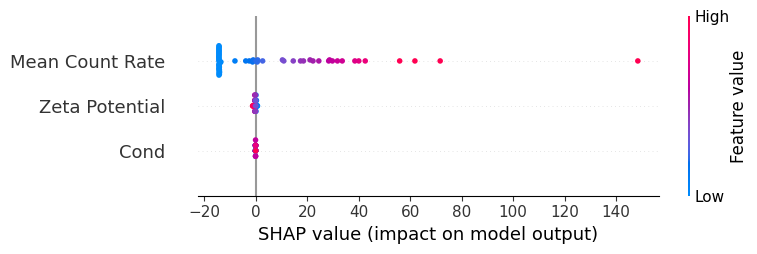

In [110]:
best_model = grid_search.best_estimator_
# Use SHAP's LinearExplainer with the best model
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    explainer = shap.LinearExplainer(best_model, X_train, feature_perturbation="interventional")
    shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values,X_test)

### Logistic Regression with hyperparameter tuning

In [111]:
#==============================Logistic Regression Model with Hyperparameter Tuning===========================
acc_LR, pred_LR, train_data, pred_proba_LR = evaluate_model(LogisticRegression(solver = best_params['solver'], penalty=best_params['penalty'], C = best_params['C']), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 1.000000 with 70.0% training records
Execution Time(LogisticRegression model): 0.007311 seconds with 70.0% training records

Accuracy score(LogisticRegression model): 1.000000 with 50.0% training records
Execution Time(LogisticRegression model): 0.006987 seconds with 50.0% training records

Accuracy score(LogisticRegression model): 1.000000 with 10.0% training records
Execution Time(LogisticRegression model): 0.007171 seconds with 10.0% training records

Accuracy score(LogisticRegression model): 1.000000 with 5.0% training records
Execution Time(LogisticRegression model): 0.007174 seconds with 5.0% training records



### Learning Curve for Logistic Regression

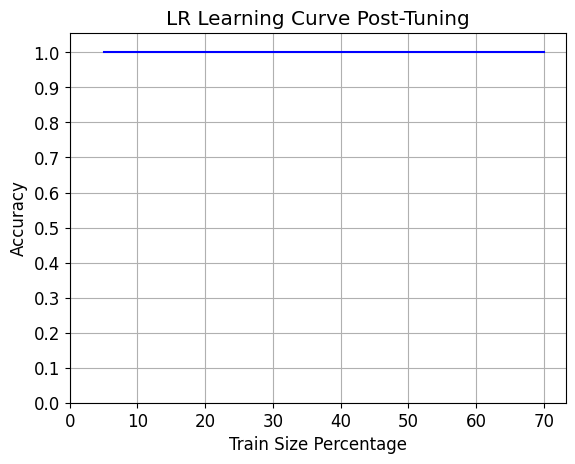

In [112]:
#===============================Learning Curve for LR===========================================
plt.plot(training_sample,acc_LR, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Logistic Regression

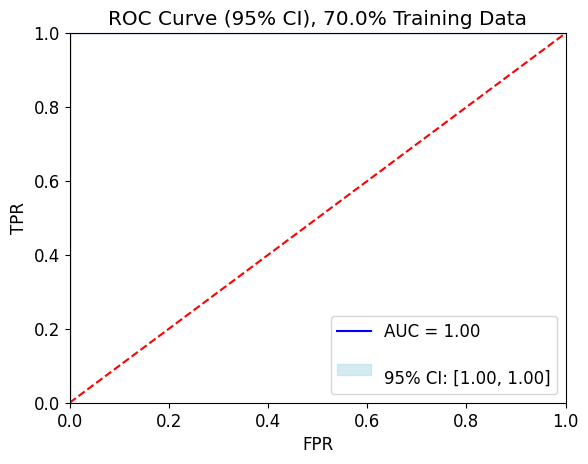

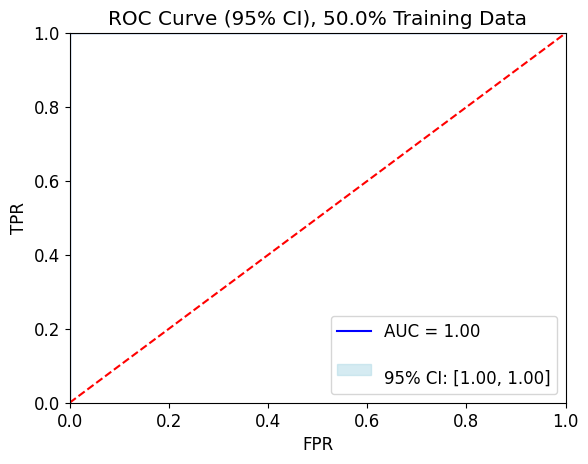

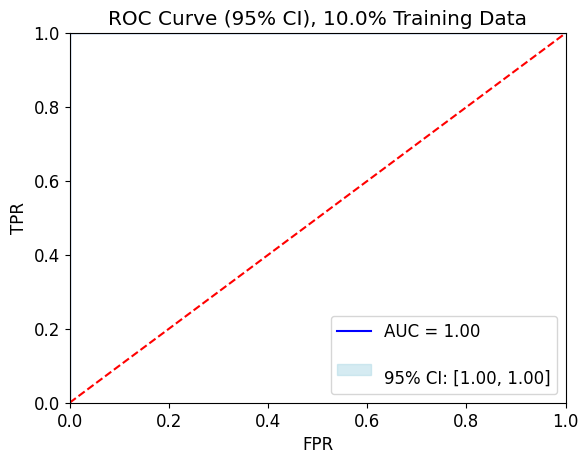

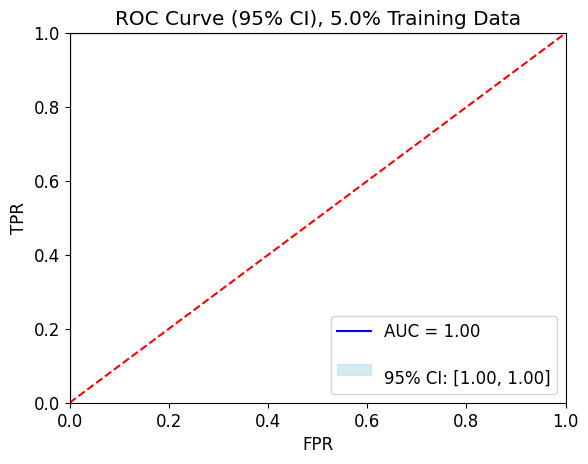

In [113]:
evaluate_ROC(train_set, y_test, pred_LR)

### Confusion Matrix for Logistic Regression

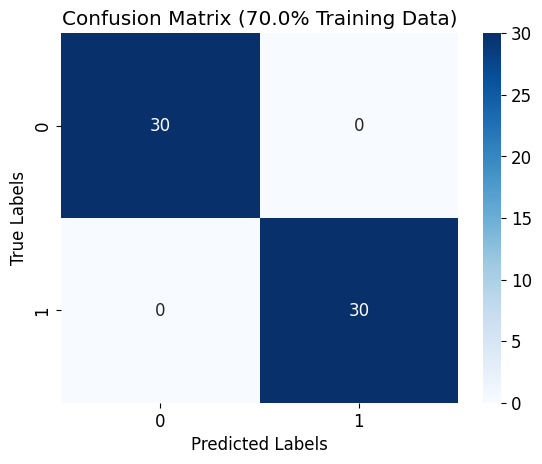

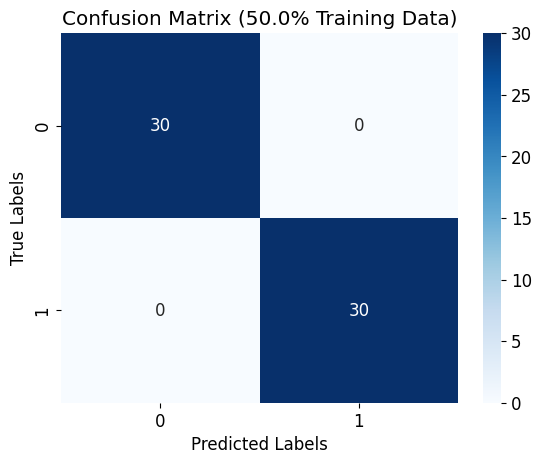

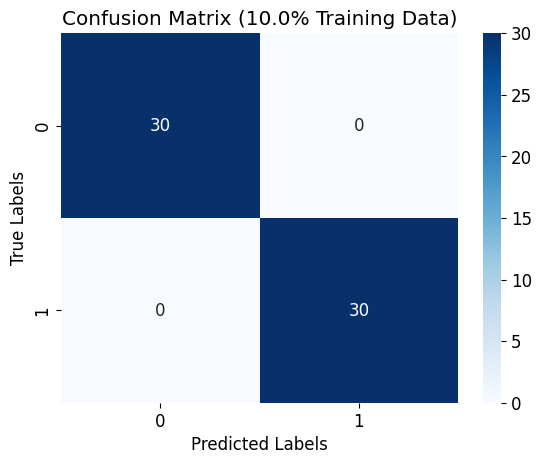

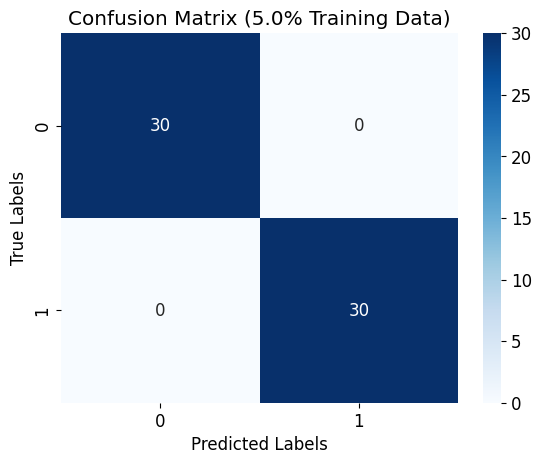

In [114]:
evaluate_con_mat(train_set, y_test, pred_LR)

In [115]:
del acc_LR, pred_LR, train_data, pred_proba_LR, best_params, clf_LR

## Random Forest

### Random Forest without hyperparameter tuning

In [116]:
eval_mod=evaluate_model(RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10), train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 1.000000 with 70.0% training records
Execution Time(RandomForestClassifier model): 0.171654 seconds with 70.0% training records

Accuracy score(RandomForestClassifier model): 0.950000 with 50.0% training records
Execution Time(RandomForestClassifier model): 0.170666 seconds with 50.0% training records

Accuracy score(RandomForestClassifier model): 0.500000 with 10.0% training records
Execution Time(RandomForestClassifier model): 0.167664 seconds with 10.0% training records

Accuracy score(RandomForestClassifier model): 0.500000 with 5.0% training records
Execution Time(RandomForestClassifier model): 0.167797 seconds with 5.0% training records



In [117]:
#==============================Hyperparameter  Tuning======================================
clf_RF = RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10)
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
}
grid_search = GridSearchCV(estimator=clf_RF, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'max_depth': 20, 'min_samples_split': 5, 'n_estimators': 300}


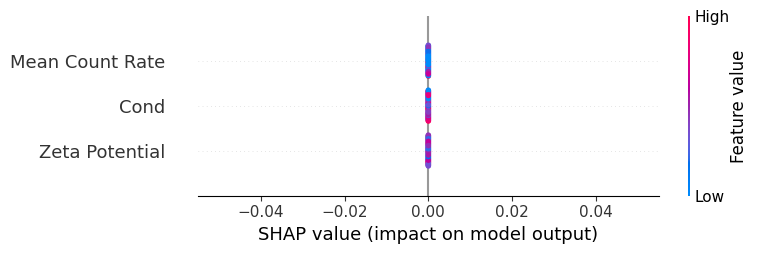

In [118]:
X_train_norm = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_norm = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
explainer_rf = shap.Explainer(grid_search.best_estimator_, X_train_norm)
shap_values_rf = explainer_rf(X_test_norm)
shap_values_class_1 = shap_values_rf.values[..., 1]
shap.summary_plot(shap_values_class_1, X_test_norm)

### Random Forest with hyperparameter tuning

In [119]:
#==============================Random Forest Model with Hyperparameter Tuning===========================
acc_RF, pred_RF, train_data, pred_proba_RF = evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 1.000000 with 70.0% training records
Execution Time(RandomForestClassifier model): 0.171745 seconds with 70.0% training records

Accuracy score(RandomForestClassifier model): 1.000000 with 50.0% training records
Execution Time(RandomForestClassifier model): 0.172304 seconds with 50.0% training records

Accuracy score(RandomForestClassifier model): 0.766667 with 10.0% training records
Execution Time(RandomForestClassifier model): 0.169897 seconds with 10.0% training records

Accuracy score(RandomForestClassifier model): 0.566667 with 5.0% training records
Execution Time(RandomForestClassifier model): 0.168342 seconds with 5.0% training records



### Learning Curve for Random Forest

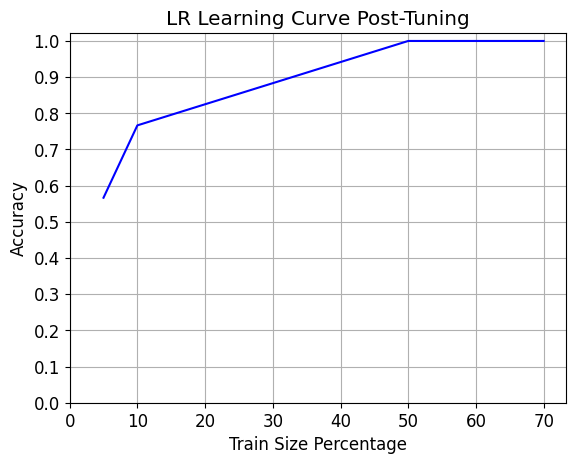

In [120]:
#===============================Learning Curve for Random Forest===========================================
plt.plot(training_sample,acc_RF, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Random Forest

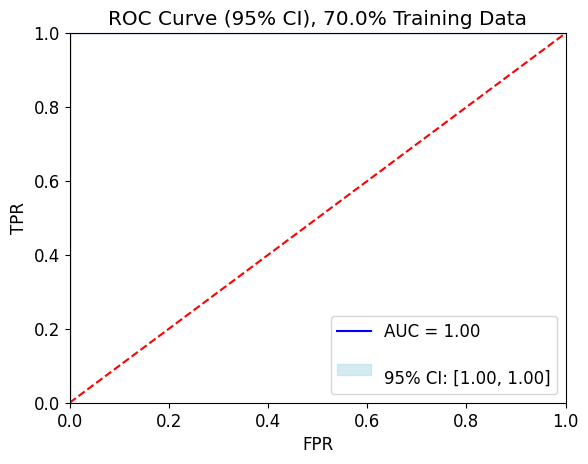

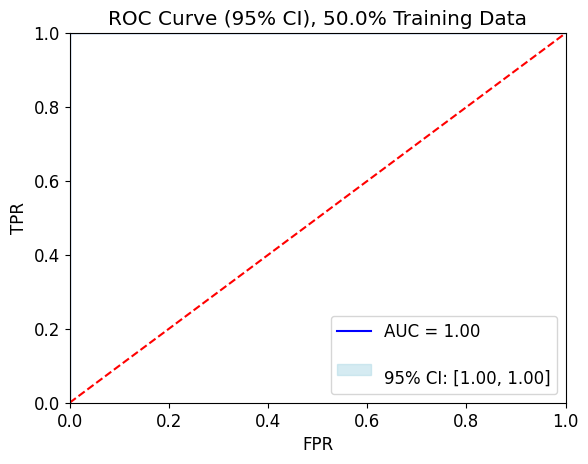

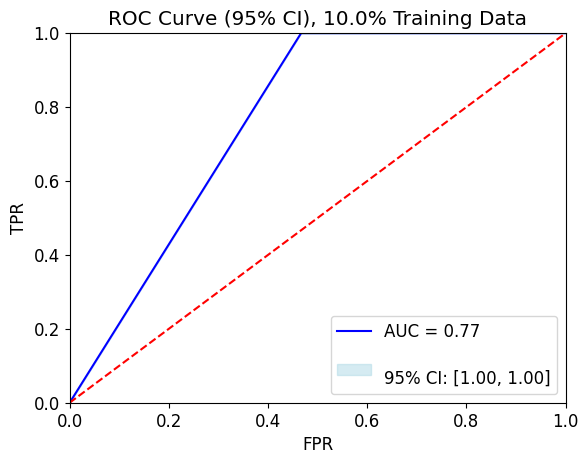

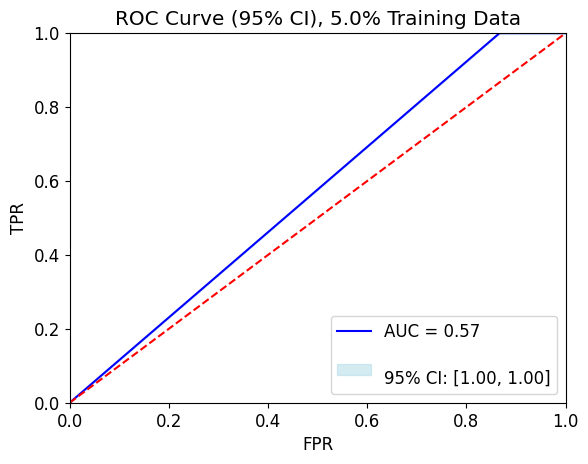

In [121]:
evaluate_ROC(train_set, y_test, pred_RF)

### Confusion Matrix for Random Forest

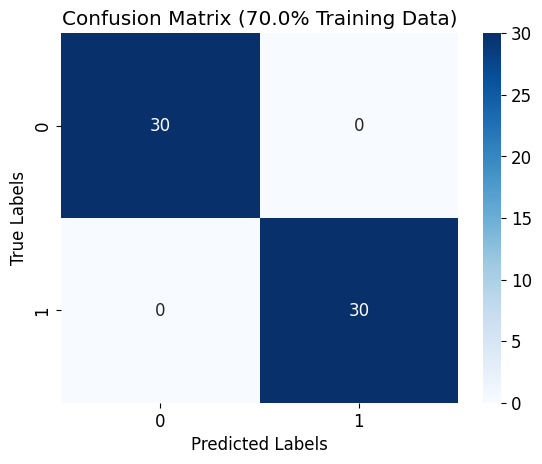

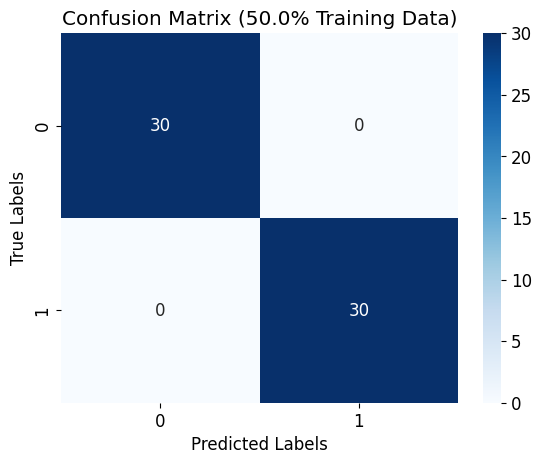

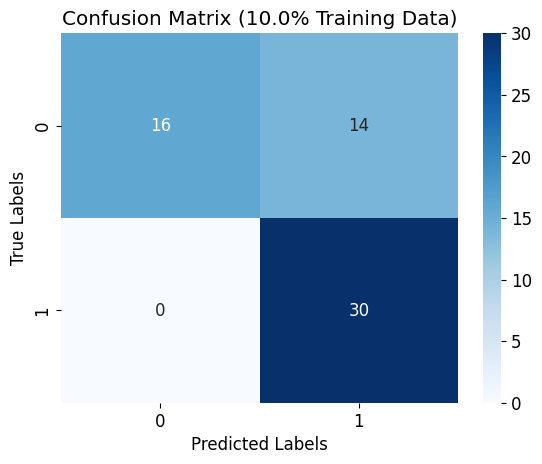

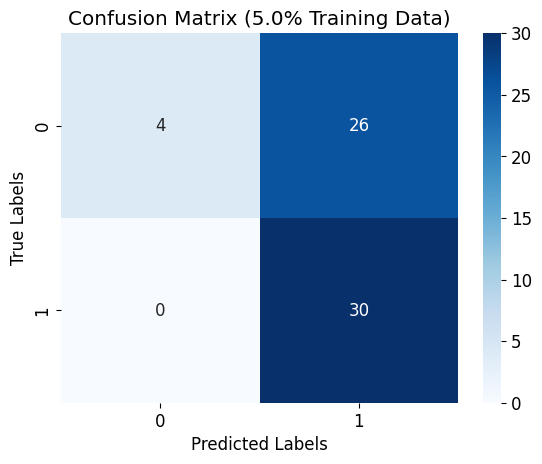

In [122]:
evaluate_con_mat(train_set, y_test, pred_RF)

In [123]:
del acc_RF, pred_RF, train_data, pred_proba_RF, best_params, clf_RF

## Support Vector Classifier

### Support Vector Classifier without hyperparameter tuning

In [124]:
eval_mod=evaluate_model(SVC(kernel='sigmoid', probability=True, C = 100, gamma='auto'), train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.500000 with 70.0% training records
Execution Time(SVC model): 0.008330 seconds with 70.0% training records

Accuracy score(SVC model): 0.500000 with 50.0% training records
Execution Time(SVC model): 0.007836 seconds with 50.0% training records

Accuracy score(SVC model): 0.500000 with 10.0% training records
Execution Time(SVC model): 0.007093 seconds with 10.0% training records

Accuracy score(SVC model): 0.500000 with 5.0% training records
Execution Time(SVC model): 0.006996 seconds with 5.0% training records



In [125]:
#==========================Hyperparameter Tuning==========================
clf_SVM = SVC(probability=True)
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': [0.01, 0.1]
}
grid_search = GridSearchCV(estimator=clf_SVM, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 1, 'gamma': 0.01, 'kernel': 'linear'}


Using 140 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/60 [00:00<?, ?it/s]

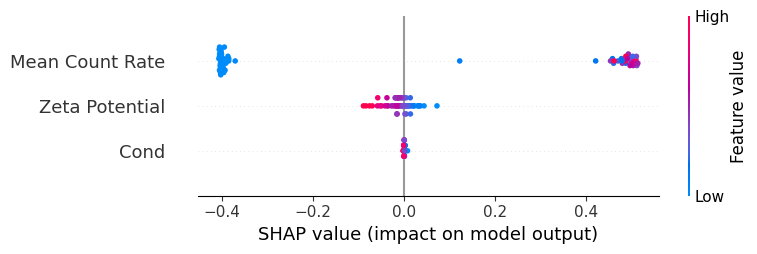

In [126]:
best_model = grid_search.best_estimator_
explainer_svc = shap.KernelExplainer(best_model.predict_proba, X_train)
shap_values_svc = explainer_svc(X_test)
shap_values_svc_class_1 = shap_values_svc.values[..., 1]
shap.summary_plot(shap_values_svc_class_1, X_test)

### Support Vector Classifier with hyperparameter tuning

In [127]:
acc_SVC, pred_SVC, train_data, pred_proba_SVC=evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 1.000000 with 70.0% training records
Execution Time(SVC model): 0.007941 seconds with 70.0% training records

Accuracy score(SVC model): 1.000000 with 50.0% training records
Execution Time(SVC model): 0.007655 seconds with 50.0% training records

Accuracy score(SVC model): 1.000000 with 10.0% training records
Execution Time(SVC model): 0.007044 seconds with 10.0% training records

Accuracy score(SVC model): 1.000000 with 5.0% training records
Execution Time(SVC model): 0.007005 seconds with 5.0% training records



### Learning Curve for Support Vector Classifier

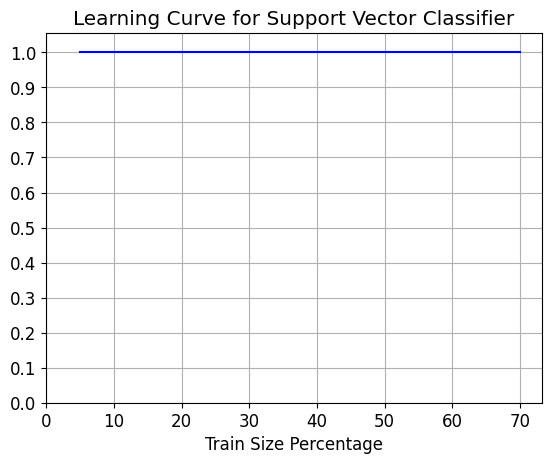

In [128]:
#===============================Learning Curve for SVC===========================================
plt.plot(training_sample,acc_SVC, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for Support Vector Classifier')
plt.show()

### ROC Curve for Support Vector Classifier

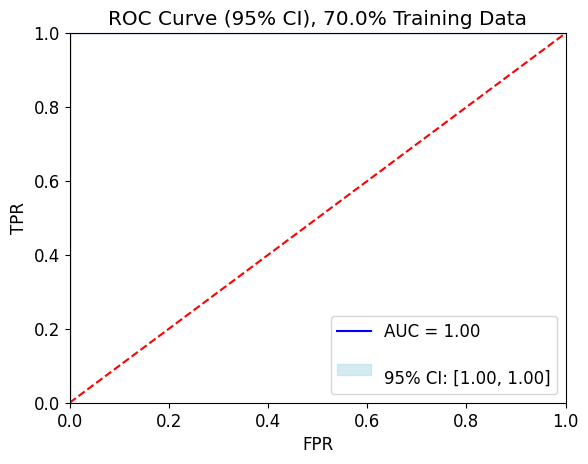

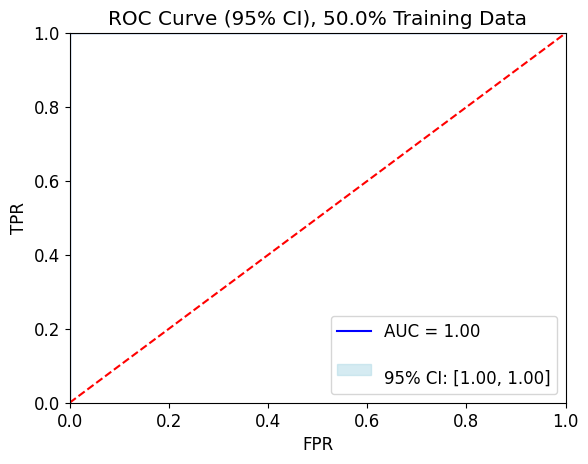

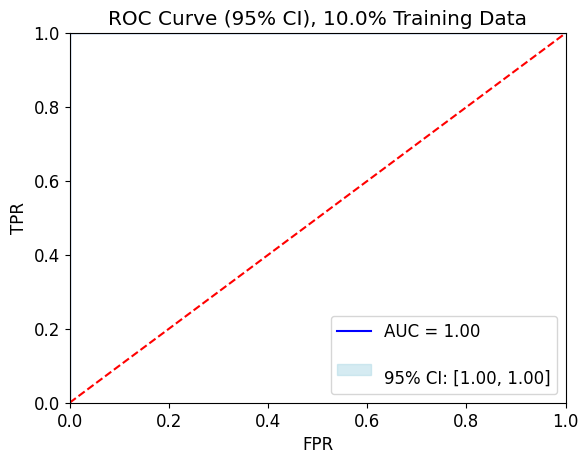

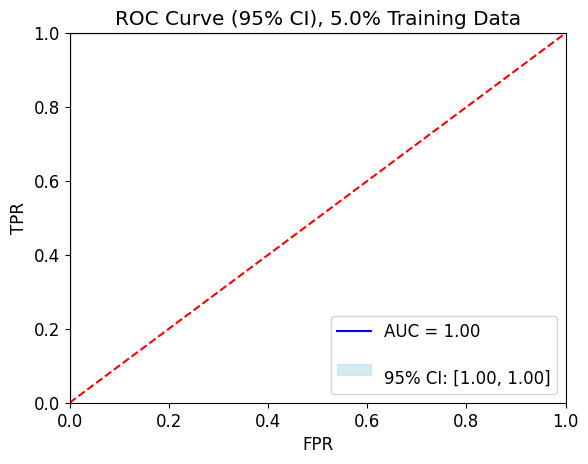

In [129]:
evaluate_ROC(train_set, y_test, pred_SVC)

### Confusion Matrix for Support Vector Classifier

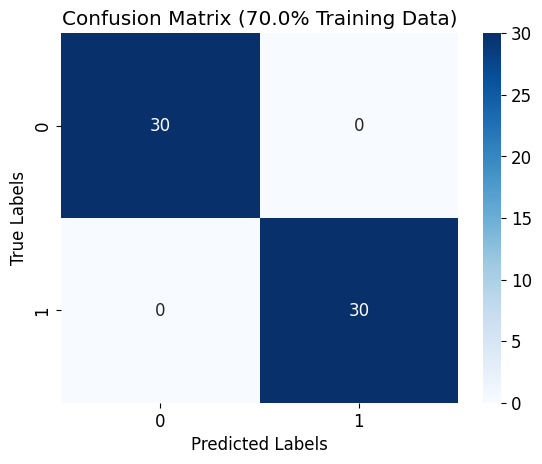

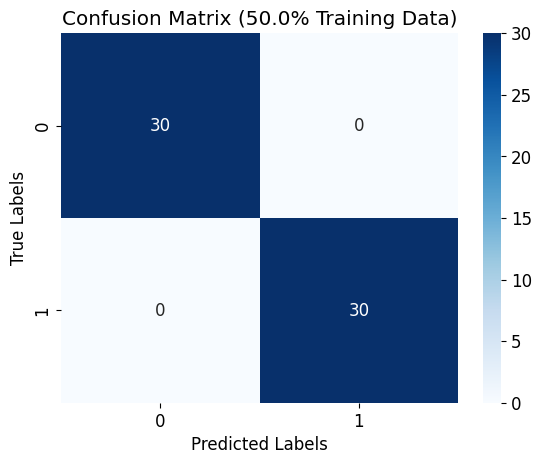

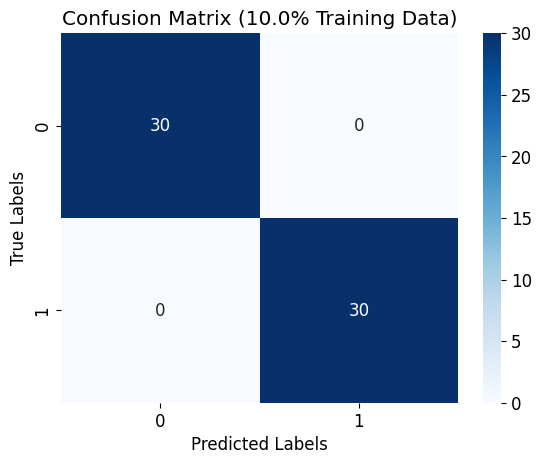

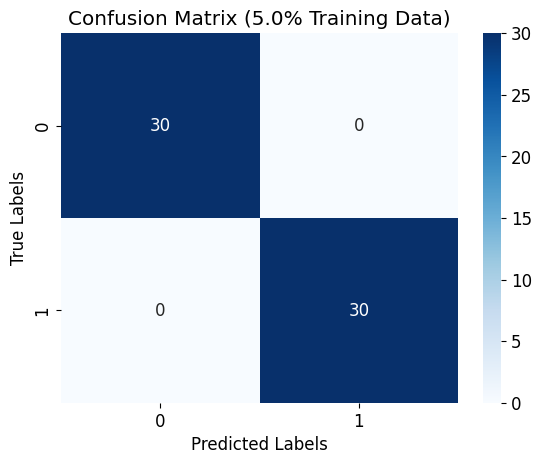

In [130]:
evaluate_con_mat(train_set, y_test, pred_SVC)

In [131]:
del acc_SVC, pred_SVC, train_data, pred_proba_SVC, best_params, clf_SVM

## Vector Quantum Classifier

In [144]:
#=====================Vector Quantum Classifier Model with different training sets================
train_features = MinMaxScaler().fit_transform(X_train)
train_labels = y_train
test_features = MinMaxScaler().fit_transform(X_test)
test_labels = y_test
num_features = train_features.shape[1] 
feature_map = PauliFeatureMap(feature_dimension=num_features, reps=2, paulis=['X', 'Z'])

In [145]:
# del X_train, y_train

In [146]:
ansatz = EfficientSU2(num_qubits=num_features, reps=2)

In [147]:
optimizer = op.SPSA(maxiter=350)

In [148]:
sampler = Sampler()

### Vector Quantum Classifier with Hyperparameter Tuning

In [149]:
# #======================================VQC=================================================
clf_vqc = VQC(
    sampler=sampler,
    feature_map=feature_map,
    ansatz=ansatz,
    loss = 'squared_error',
    optimizer=optimizer
)
acc_vqtask1 = []
pred_vqtask1 = []
for elm in train_set:
    vqc = copy.deepcopy(clf_vqc)
    X_t, dummy_x, y_t, dummy_y = train_test_split(train_features, train_labels, train_size=elm, random_state=algorithm_globals.random_seed)
    vqc.fit(X_t, y_t.values)
    start = time.time()
    pred = vqc.predict(test_features)
    end = time.time()
    accuracy = accuracy_score(test_labels.values, pred)
    pred_vqtask1.append(pred)
    acc_vqtask1.append(accuracy)
    execution_time = end - start
    print(f'Accuracy score(VQC Model): {accuracy} with {elm*100}% training records')
    print(f'Execution Time(VQC Model): {execution_time} seconds with {elm*100}% training records')
    print()
# #======================================VQC=================================================

Accuracy score(VQC Model): 0.7166666666666667 with 70.0% training records
Execution Time(VQC Model): 0.2933471202850342 seconds with 70.0% training records

Accuracy score(VQC Model): 0.7333333333333333 with 50.0% training records
Execution Time(VQC Model): 0.29391956329345703 seconds with 50.0% training records

Accuracy score(VQC Model): 0.7833333333333333 with 10.0% training records
Execution Time(VQC Model): 0.29442930221557617 seconds with 10.0% training records

Accuracy score(VQC Model): 0.9333333333333333 with 5.0% training records
Execution Time(VQC Model): 0.29374098777770996 seconds with 5.0% training records



## Learning Curve for VQC

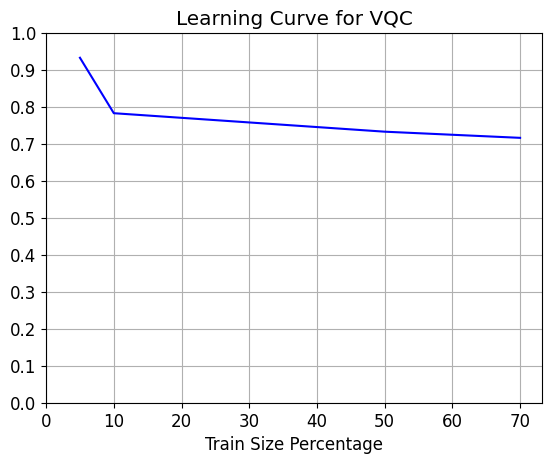

In [150]:
#===============================Learning Curve for VQC===========================================
plt.plot(training_sample,acc_vqtask1, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for VQC')
plt.show()

### 3D Scatter Plot for VQC Model

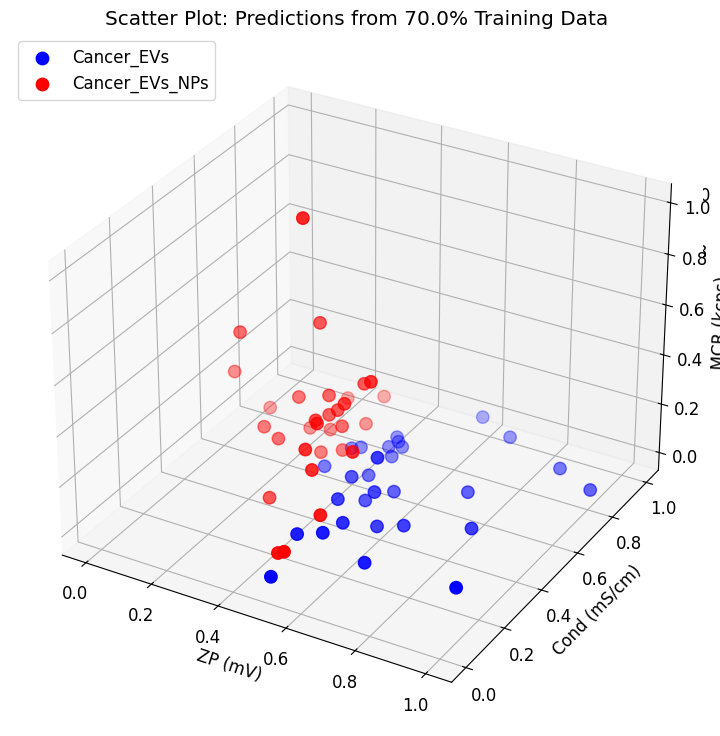

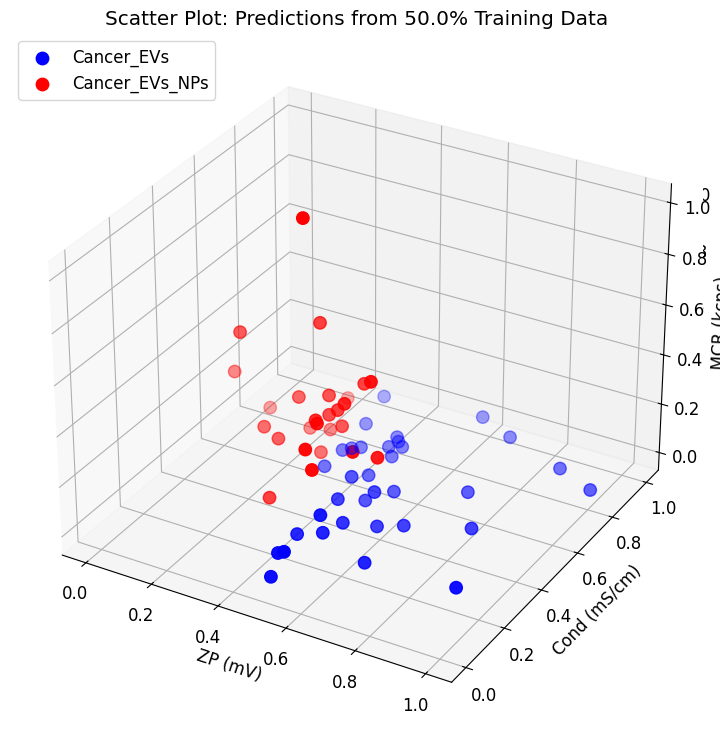

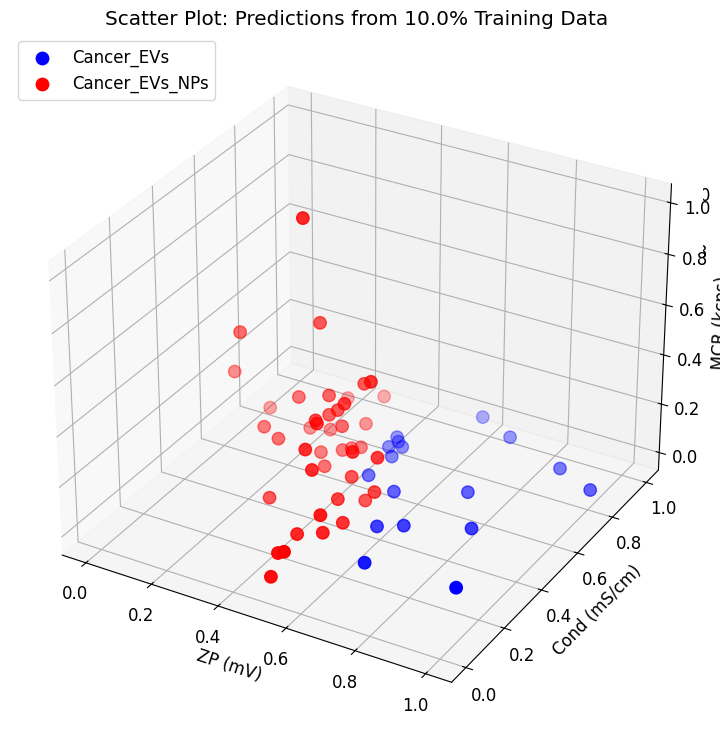

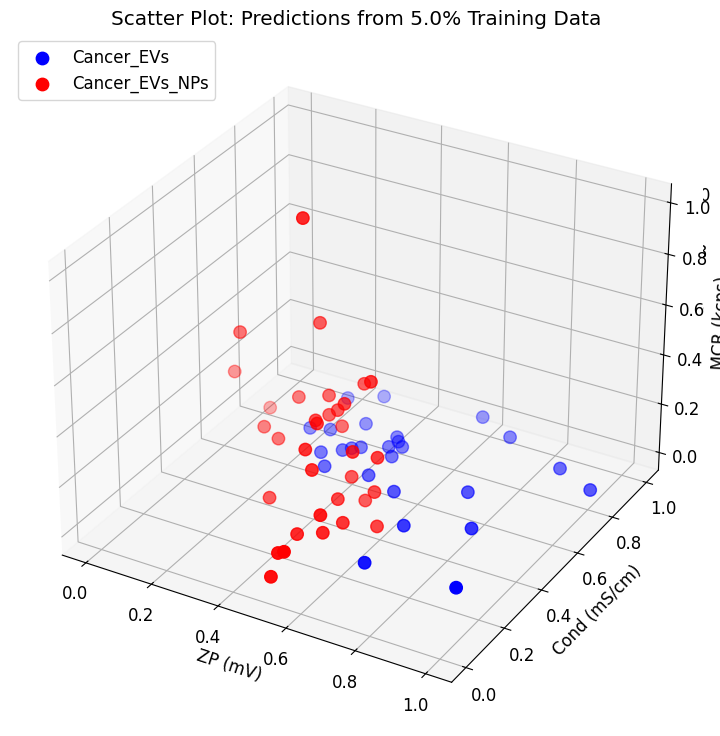

In [151]:
#=======================================3D Scatter Plot===============================
for i in range(len(train_set)):
    plt.rcParams.update({'font.size': 12})
    fig = plt.figure(figsize=(9,9))
    ax = plt.subplot(1,1,1,projection='3d')
    ax = fig.add_subplot(111,projection='3d')
    ax.scatter(test_features[pred_vqtask1[i]==0,0], test_features[pred_vqtask1[i]==0,1], test_features[pred_vqtask1[i]==0,2], c='blue', marker='o', label='Cancer_EVs', s=80)
    ax.scatter(test_features[pred_vqtask1[i]==1,0], test_features[pred_vqtask1[i]==1,1], test_features[pred_vqtask1[i]==1,2], c='red', marker='o', label='Cancer_EVs_NPs',s=80)
  # Set labels for each axis
    ax.set_xlabel('ZP (mV)')
    ax.set_ylabel('Cond (mS/cm)')
    ax.set_zlabel('MCR (kcps)')
    ax.set_title(f'Scatter Plot: Predictions from {train_set[i]*100}% Training Data')
    ax.tick_params("z", which="major",length=15,width = 2.0)
    ax.legend(loc='upper left')
    plt.show()

### ROC Curve for Vector Quantum Classifier

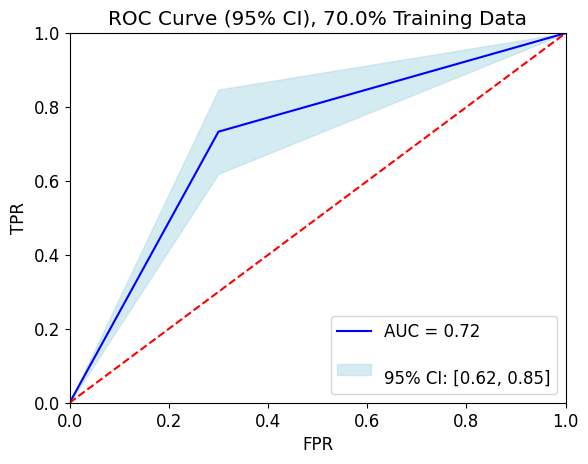

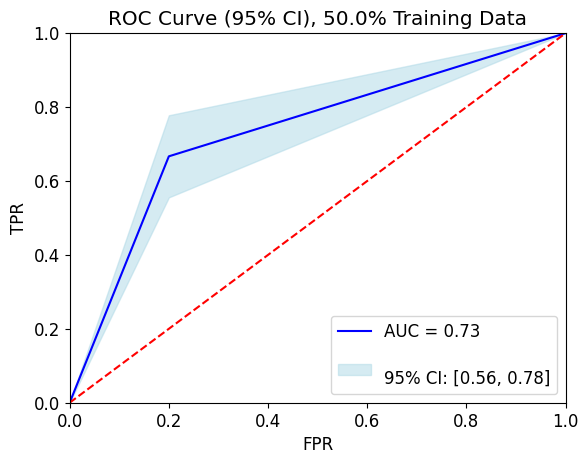

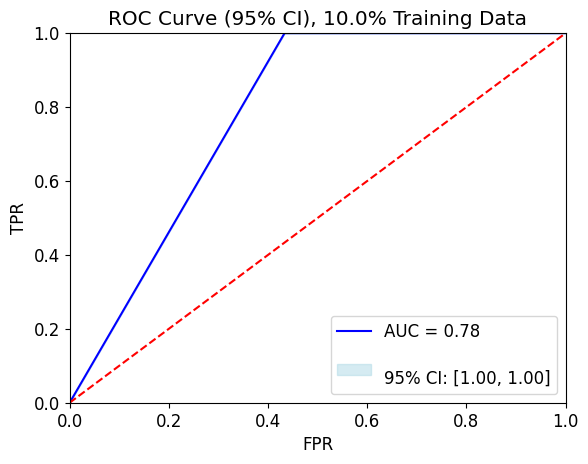

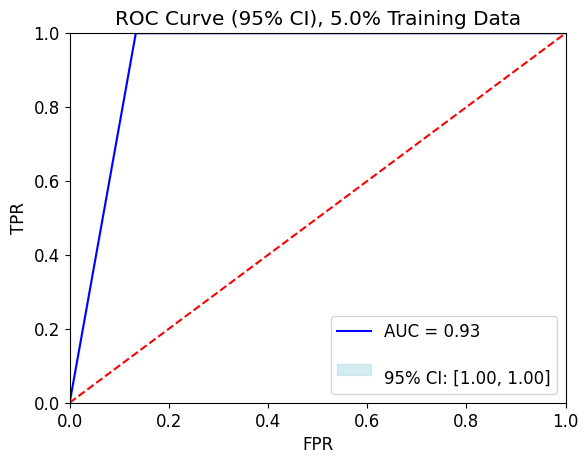

In [152]:
evaluate_ROC(train_set, test_labels, pred_vqtask1)

### Confusion Matrix for Vector Quantum Classifier

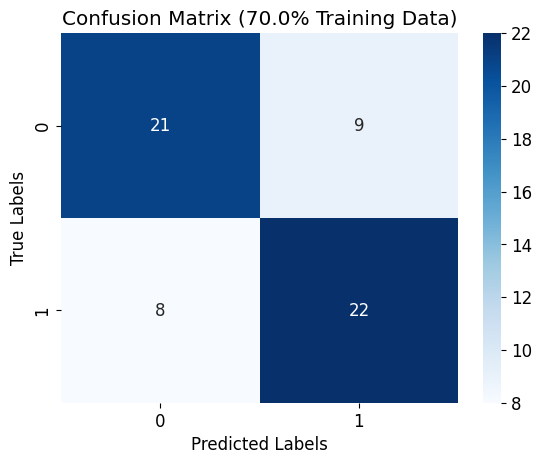

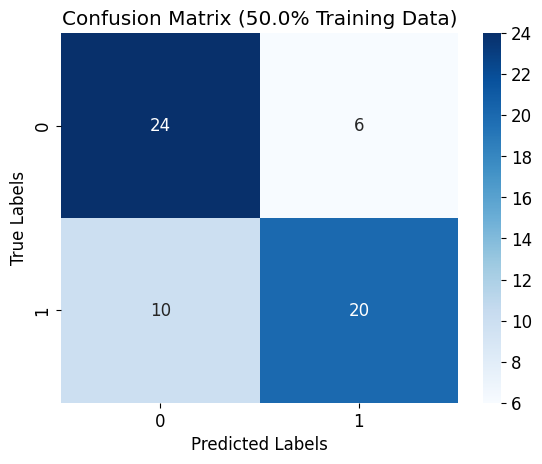

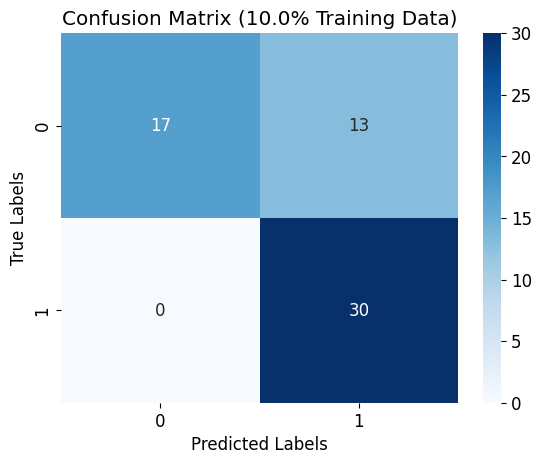

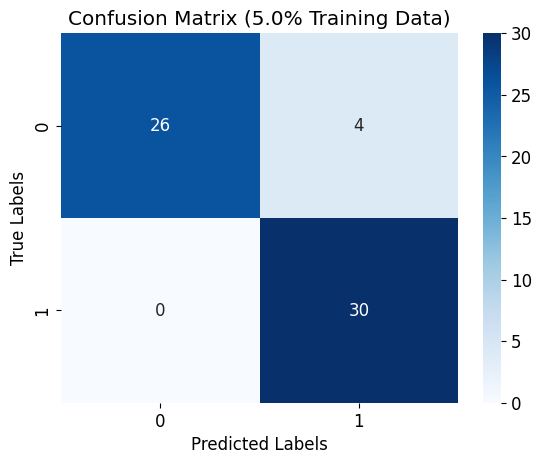

In [153]:
evaluate_con_mat(train_set, test_labels, pred_vqtask1)

# <center><h1><b>Task 4 (Healthy_Plasma vs Healthy_Plasma_NPs)</b></h1></center>

In [61]:
#==================Predictor Variables for dataset 4===================================
X_train = dataset4[['Zeta Potential', 'Cond', 'Mean Count Rate']]
X_test = dataset9[['Zeta Potential', 'Cond', 'Mean Count Rate']]
#===================Output Variable========================================
y_train = dataset4['Sample Name']
y_test = dataset9['Sample Name']
y_train = y_train.map(lambda x: 1 if x == 6 else 0)
y_test = y_test.map(lambda x: 1 if x == 6 else 0)

## Logistic Regression

### Logistic Regression without hyperparameter tuning

In [73]:
#=====================Logistic Regression Model with different training sets================
eval_mod=evaluate_model(LogisticRegression(solver='lbfgs', max_iter=1000), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.500000 with 70.0% training records
Execution Time(LogisticRegression model): 0.007753 seconds with 70.0% training records

Accuracy score(LogisticRegression model): 0.475000 with 50.0% training records
Execution Time(LogisticRegression model): 0.007351 seconds with 50.0% training records

Accuracy score(LogisticRegression model): 0.491667 with 10.0% training records
Execution Time(LogisticRegression model): 0.007303 seconds with 10.0% training records

Accuracy score(LogisticRegression model): 0.383333 with 5.0% training records
Execution Time(LogisticRegression model): 0.007349 seconds with 5.0% training records



In [74]:
#===============================Hyperparameter Tuning================================
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
clf_LR = LogisticRegression(solver = 'newton-cg', max_iter=1000)
param_grid = { 'C': [0.001, 0.01, 0.1, 1, 10, 100],'penalty': ['l2'], 'solver': ['newton-cg','liblinear', 'saga']}
grid_search = GridSearchCV(clf_LR, param_grid, cv=10, verbose=0 ,scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}


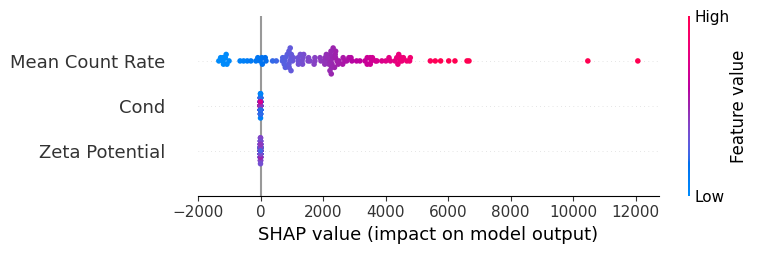

In [75]:
best_model = grid_search.best_estimator_
# Use SHAP's LinearExplainer with the best model
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    explainer = shap.LinearExplainer(best_model, X_train, feature_perturbation="interventional")
    shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values,X_test)

### Logistic Regression with hyperparameter tuning

In [76]:
#==============================Logistic Regression Model with Hyperparameter Tuning===========================
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
acc_LR, pred_LR, train_data, pred_proba_LR = evaluate_model(LogisticRegression(solver = best_params['solver'], penalty=best_params['penalty'], C = best_params['C']), train_set, X_train_scaled, y_train, X_test_scaled, y_test)

Accuracy score(LogisticRegression model): 0.133333 with 70.0% training records
Execution Time(LogisticRegression model): 0.001054 seconds with 70.0% training records

Accuracy score(LogisticRegression model): 0.408333 with 50.0% training records
Execution Time(LogisticRegression model): 0.001050 seconds with 50.0% training records

Accuracy score(LogisticRegression model): 0.425000 with 10.0% training records
Execution Time(LogisticRegression model): 0.001037 seconds with 10.0% training records

Accuracy score(LogisticRegression model): 0.475000 with 5.0% training records
Execution Time(LogisticRegression model): 0.001018 seconds with 5.0% training records



### Learning Curve for Logistic Regression

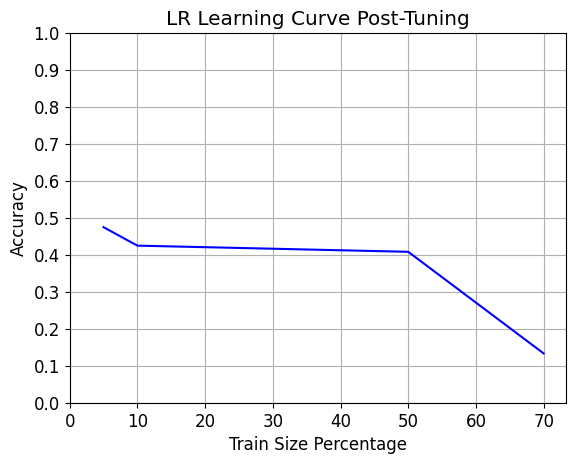

In [77]:
#===============================Learning Curve for LR===========================================
plt.plot(training_sample,acc_LR, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Logistic Regression

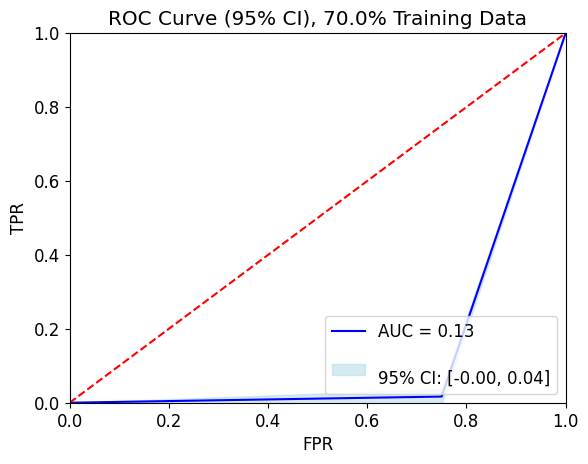

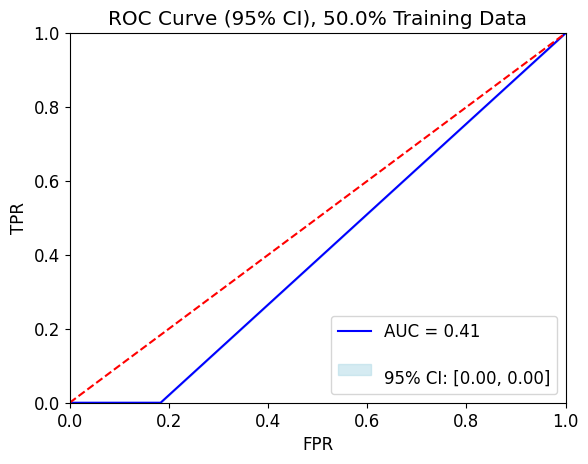

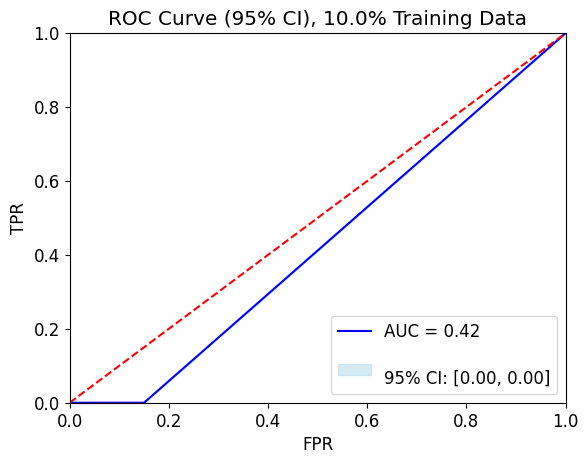

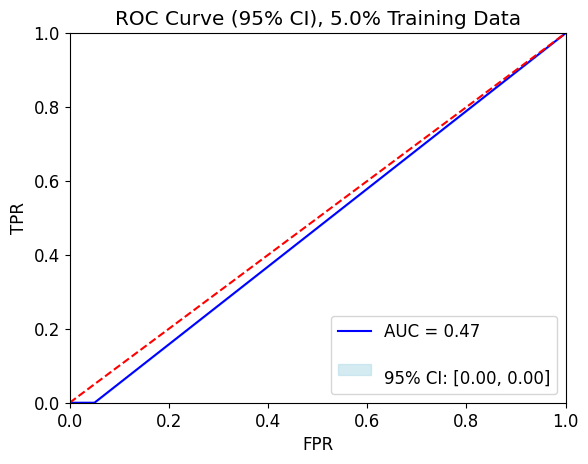

In [78]:
evaluate_ROC(train_set, y_test, pred_LR)

### Confusion Matrix for Logistic Regression

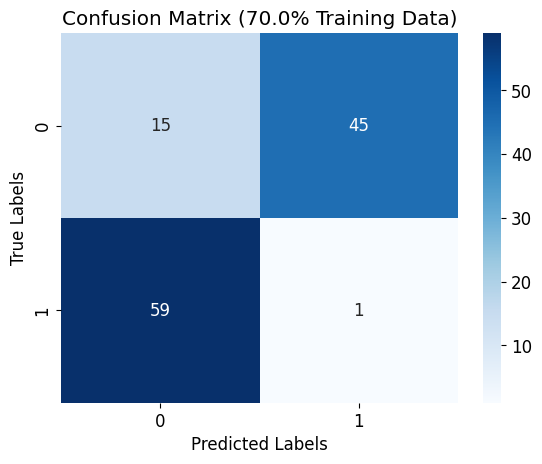

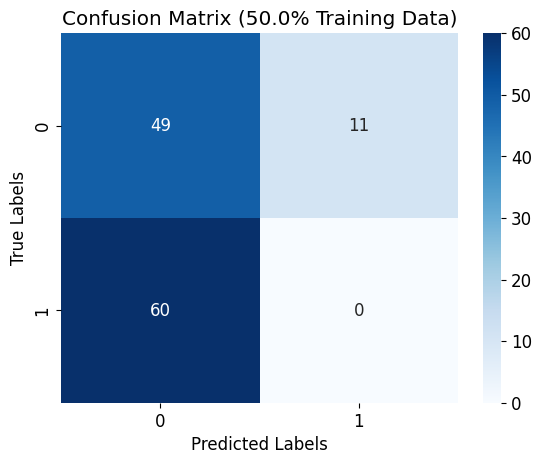

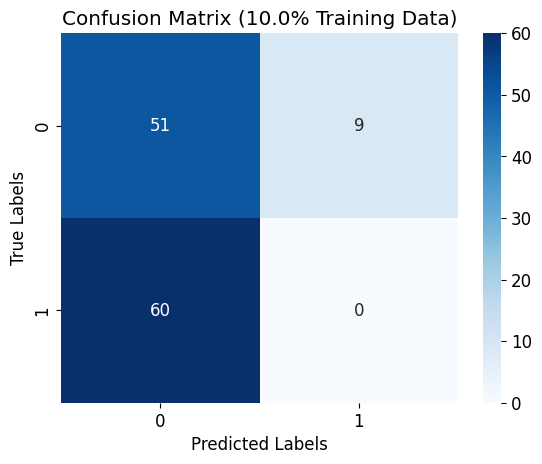

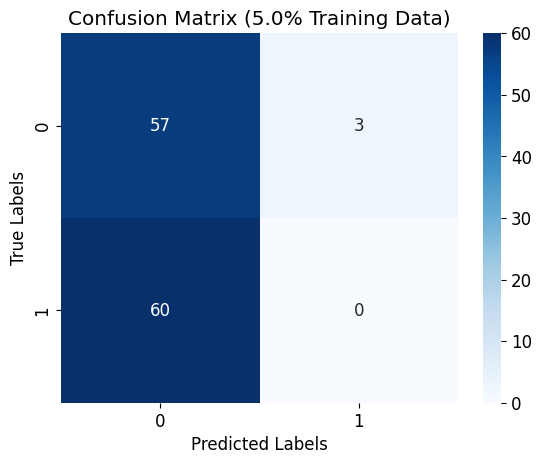

In [79]:
evaluate_con_mat(train_set, y_test, pred_LR)

In [80]:
del acc_LR, pred_LR, train_data, pred_proba_LR, best_params, clf_LR

## Random Forest

### Random Forest without hyperparameter tuning

In [81]:
eval_mod=evaluate_model(RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10), train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.175000 with 70.0% training records
Execution Time(RandomForestClassifier model): 0.185076 seconds with 70.0% training records

Accuracy score(RandomForestClassifier model): 0.150000 with 50.0% training records
Execution Time(RandomForestClassifier model): 0.182098 seconds with 50.0% training records

Accuracy score(RandomForestClassifier model): 0.450000 with 10.0% training records
Execution Time(RandomForestClassifier model): 0.176991 seconds with 10.0% training records

Accuracy score(RandomForestClassifier model): 0.500000 with 5.0% training records
Execution Time(RandomForestClassifier model): 0.175142 seconds with 5.0% training records



In [82]:
#==============================Hyperparameter  Tuning======================================
clf_RF = RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10)
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
}
grid_search = GridSearchCV(estimator=clf_RF, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 200}


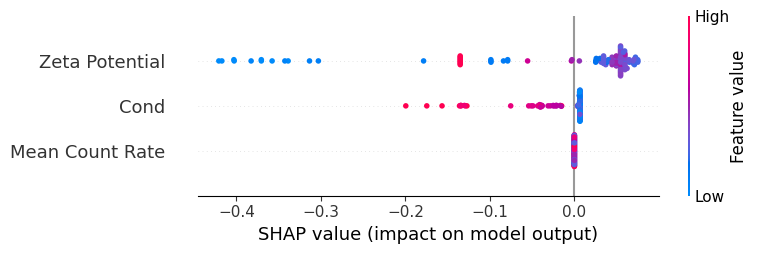

In [83]:
X_train_norm = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_norm = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
explainer_rf = shap.Explainer(grid_search.best_estimator_, X_train_norm)
shap_values_rf = explainer_rf(X_test_norm)
shap_values_class_1 = shap_values_rf.values[..., 1]
shap.summary_plot(shap_values_class_1, X_test_norm)

### Random Forest with hyperparameter tuning

In [84]:
#==============================Random Forest Model with Hyperparameter Tuning===========================
acc_RF, pred_RF, train_data, pred_proba_RF = evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.183333 with 70.0% training records
Execution Time(RandomForestClassifier model): 0.134617 seconds with 70.0% training records

Accuracy score(RandomForestClassifier model): 0.166667 with 50.0% training records
Execution Time(RandomForestClassifier model): 0.126522 seconds with 50.0% training records

Accuracy score(RandomForestClassifier model): 0.391667 with 10.0% training records
Execution Time(RandomForestClassifier model): 0.121891 seconds with 10.0% training records

Accuracy score(RandomForestClassifier model): 0.475000 with 5.0% training records
Execution Time(RandomForestClassifier model): 0.121090 seconds with 5.0% training records



### Learning Curve for Random Forest

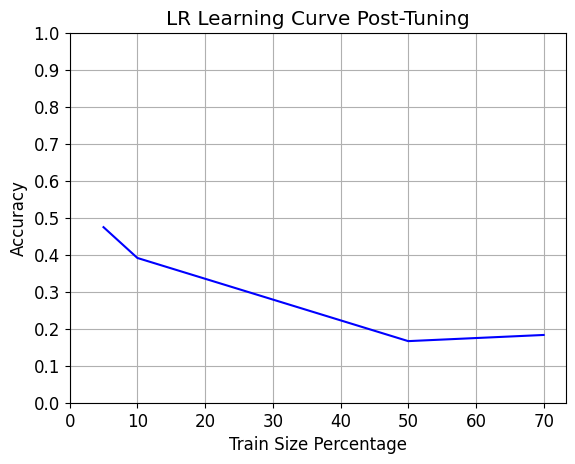

In [85]:
#===============================Learning Curve for Random Forest===========================================
plt.plot(training_sample,acc_RF, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Random Forest

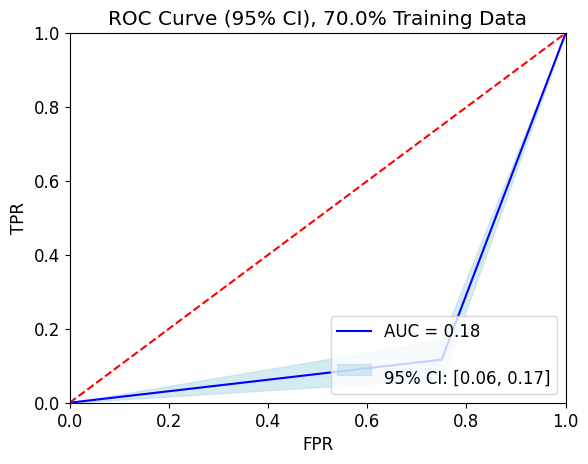

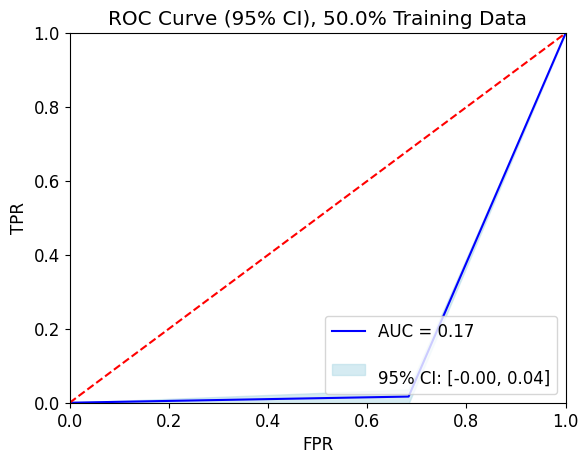

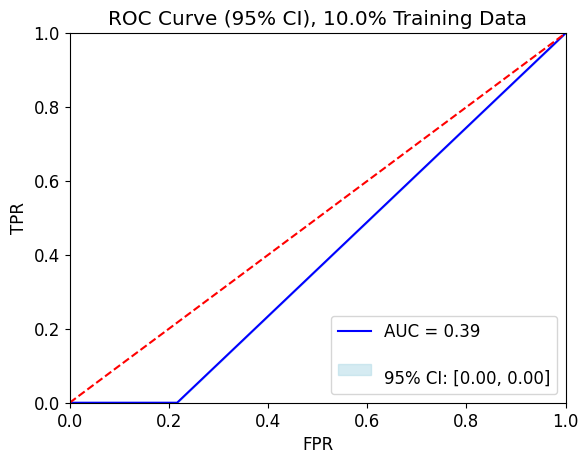

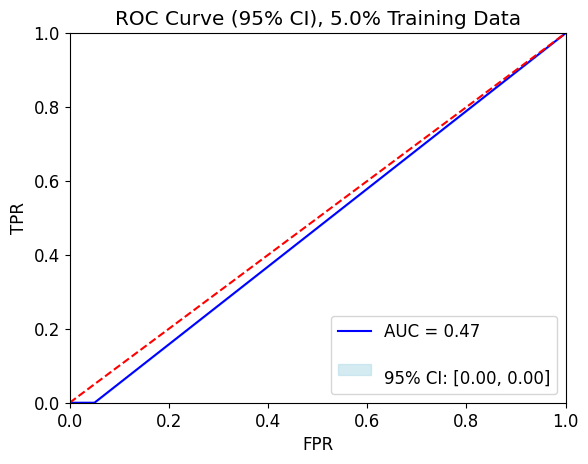

In [86]:
evaluate_ROC(train_set, y_test, pred_RF)

### Confusion Matrix for Random Forest

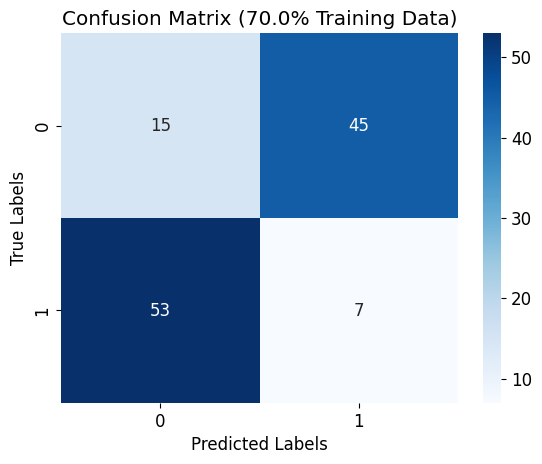

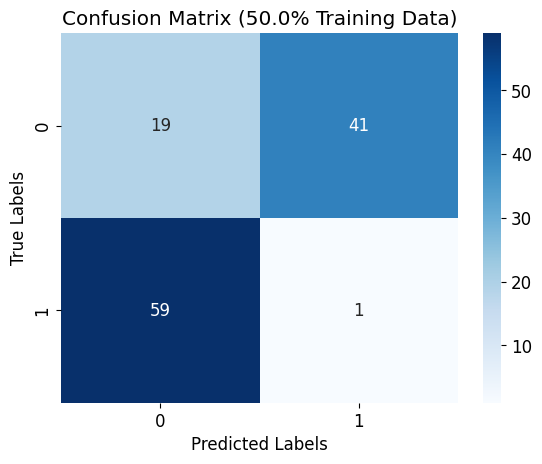

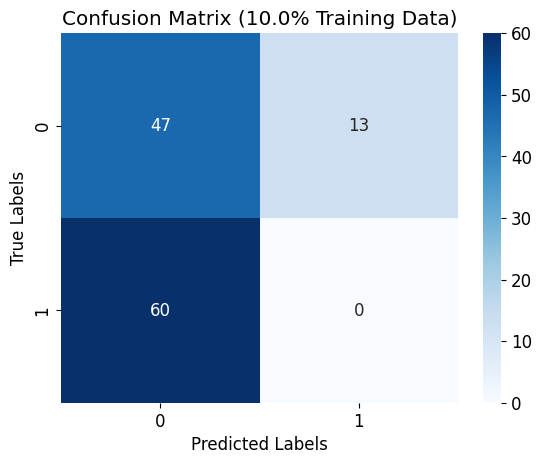

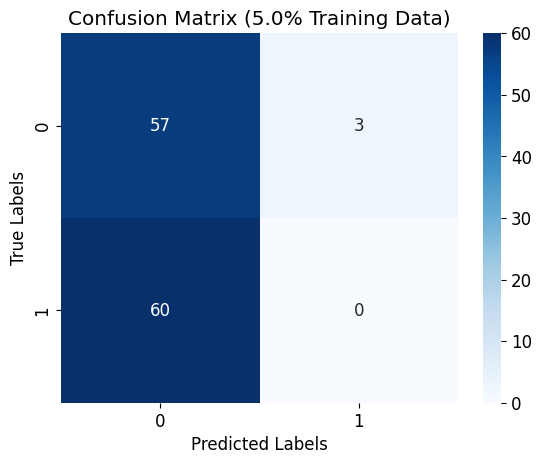

In [87]:
evaluate_con_mat(train_set, y_test, pred_RF)

In [88]:
del acc_RF, pred_RF, train_data, pred_proba_RF, best_params, clf_RF

## Support Vector Classifier

### Support Vector Classifier without hyperparameter tuning

In [89]:
eval_mod=evaluate_model(SVC(kernel='sigmoid', probability=True, C = 100, gamma='auto'), train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.500000 with 70.0% training records
Execution Time(SVC model): 0.010954 seconds with 70.0% training records

Accuracy score(SVC model): 0.500000 with 50.0% training records
Execution Time(SVC model): 0.009434 seconds with 50.0% training records

Accuracy score(SVC model): 0.500000 with 10.0% training records
Execution Time(SVC model): 0.007801 seconds with 10.0% training records

Accuracy score(SVC model): 0.500000 with 5.0% training records
Execution Time(SVC model): 0.007460 seconds with 5.0% training records



In [90]:
#==========================Hyperparameter Tuning==========================
clf_SVM = SVC(probability=True)
param_grid = {
    'C': [1, 10, 100],  # Reduce the range of C
    'kernel': ['sigmoid','rbf'],  # Focus on one kernel type
    'gamma': [0.01, 0.1]  # Keep a smaller range of gamma
}
grid_search = GridSearchCV(estimator=clf_SVM, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}


Using 280 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/120 [00:00<?, ?it/s]

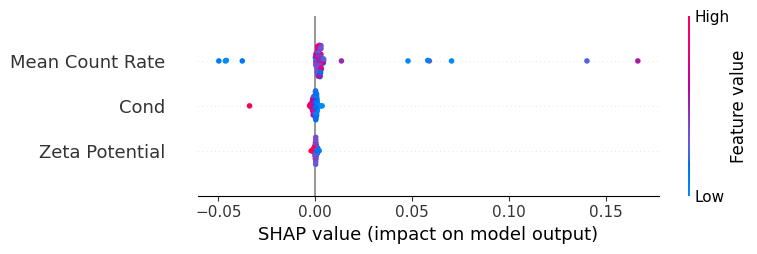

In [91]:
best_model = grid_search.best_estimator_
explainer_svc = shap.KernelExplainer(best_model.predict_proba, X_train)
shap_values_svc = explainer_svc(X_test)
shap_values_svc_class_1 = shap_values_svc.values[..., 1]
shap.summary_plot(shap_values_svc_class_1, X_test)

### Support Vector Classifier with hyperparameter tuning

In [92]:
acc_SVC, pred_SVC, train_data, pred_proba_SVC=evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.508333 with 70.0% training records
Execution Time(SVC model): 0.020700 seconds with 70.0% training records

Accuracy score(SVC model): 0.508333 with 50.0% training records
Execution Time(SVC model): 0.016823 seconds with 50.0% training records

Accuracy score(SVC model): 0.508333 with 10.0% training records
Execution Time(SVC model): 0.009277 seconds with 10.0% training records

Accuracy score(SVC model): 0.500000 with 5.0% training records
Execution Time(SVC model): 0.008340 seconds with 5.0% training records



### Learning Curve for Support Vector Classifier

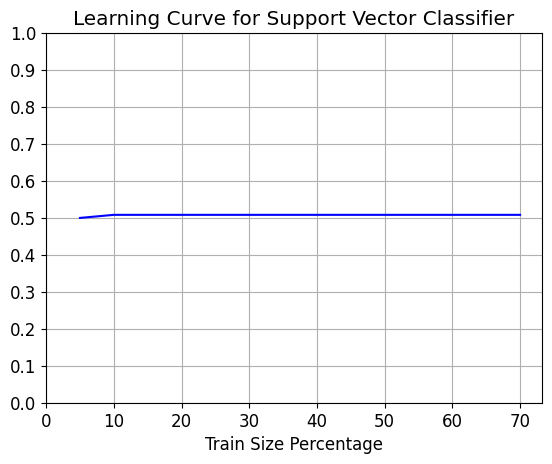

In [93]:
#===============================Learning Curve for SVC===========================================
plt.plot(training_sample,acc_SVC, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for Support Vector Classifier')
plt.show()

### ROC Curve for Support Vector Classifier

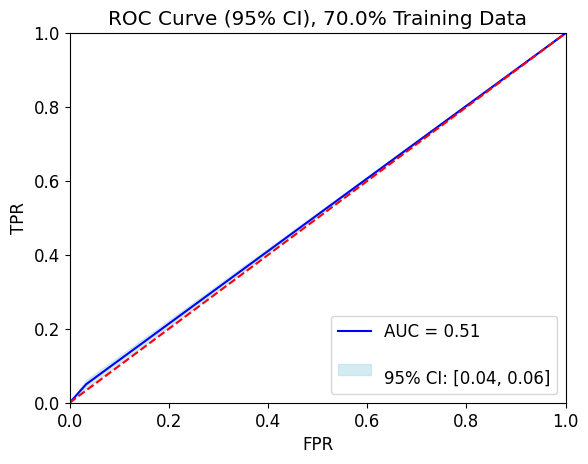

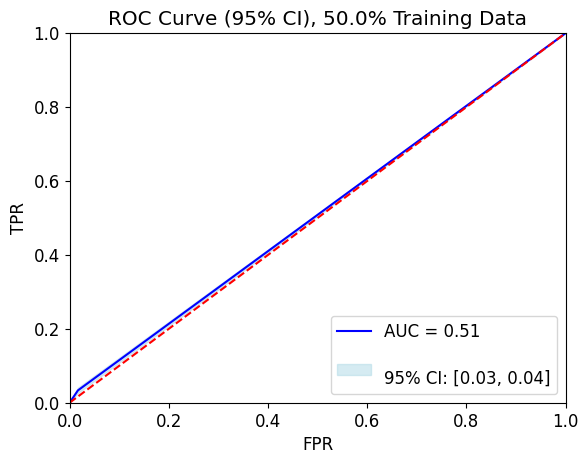

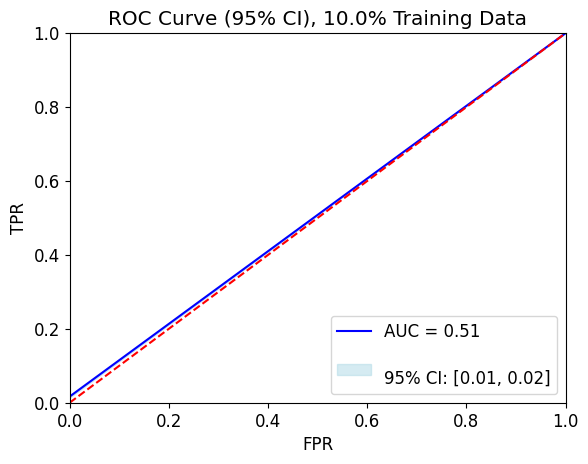

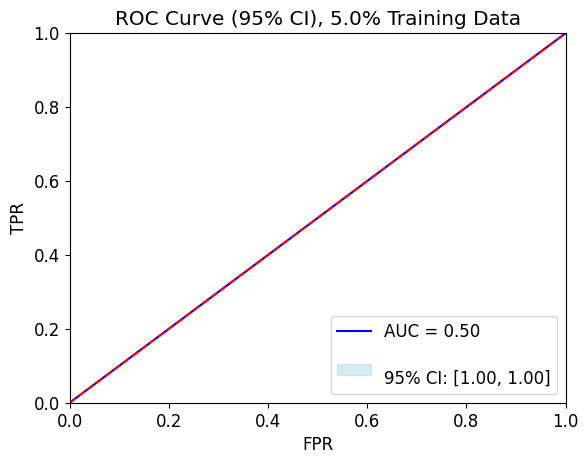

In [94]:
evaluate_ROC(train_set, y_test, pred_SVC)

### Confusion Matrix for Support Vector Classifier

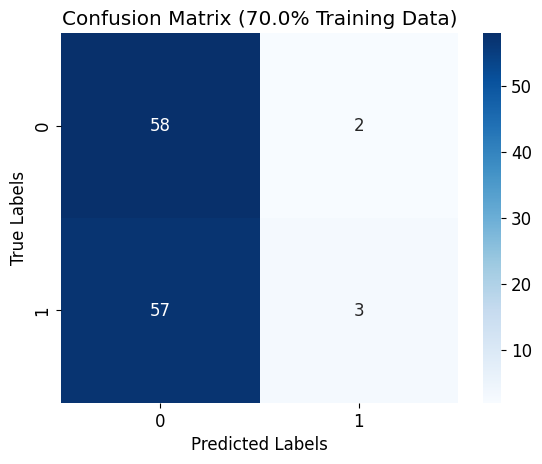

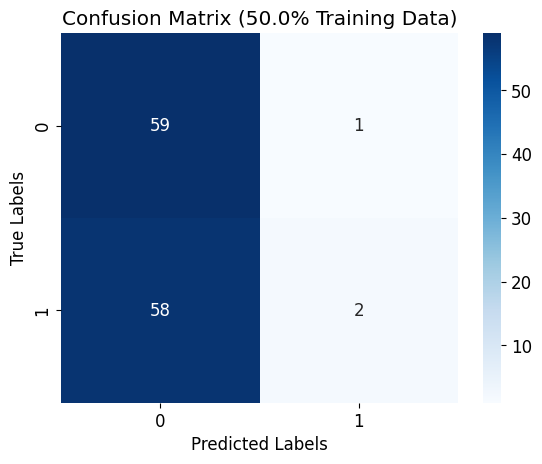

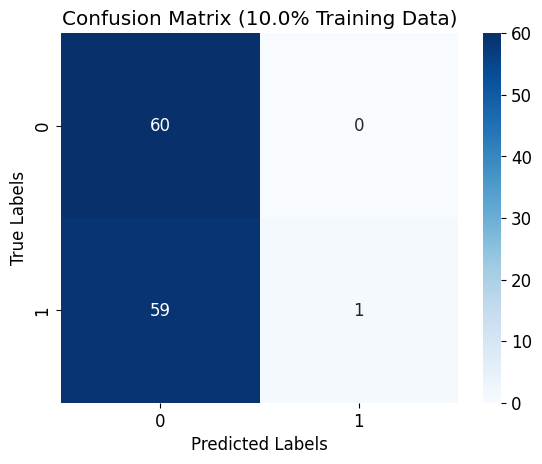

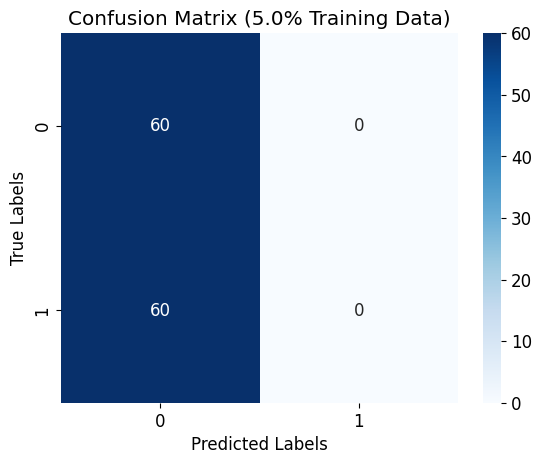

In [95]:
evaluate_con_mat(train_set, y_test, pred_SVC)

In [96]:
del acc_SVC, pred_SVC, train_data, pred_proba_SVC, best_params, clf_SVM

## Vector Quantum Classifier

In [62]:
#=====================Vector Quantum Classifier Model with different training sets================
scaler = StandardScaler()
train_features = scaler.fit_transform(X_train)
test_features = scaler.transform(X_test)
train_labels = y_train
test_labels = y_test
num_features = train_features.shape[1]
feature_map = ZZFeatureMap(feature_dimension=num_features, reps=1)

In [63]:
# del X_train, y_train

In [64]:
# ansatz = RealAmplitudes(num_qubits=num_features, entanglement='sca', reps= 1)
ansatz = EfficientSU2(num_qubits=num_features, reps=1)

In [65]:
optimizer = op.UMDA(maxiter=100)

In [66]:
sampler = Sampler()

### Vector Quantum Classifier with Hyperparameter Tuning

In [67]:
#======================================VQC=================================================
clf_vqc = VQC(
    sampler=sampler,
    feature_map=feature_map,
    ansatz = ansatz,
    loss = 'cross_entropy',
    optimizer=optimizer
)
acc_vqtask1 = []
pred_vqtask1 = []
for elm in train_set:
    vqc = copy.deepcopy(clf_vqc)
    X_t, dummy_x, y_t, dummy_y = train_test_split(train_features, train_labels, train_size=elm, random_state=algorithm_globals.random_seed)
    vqc.fit(X_t, y_t.values)
    start = time.time()
    pred = vqc.predict(test_features)
    end = time.time()
    accuracy = accuracy_score(test_labels.values, pred)
    pred_vqtask1.append(pred)
    acc_vqtask1.append(accuracy)
    execution_time = end - start
    print(f'Accuracy score(VQC Model): {accuracy} with {elm*100}% training records')
    print(f'Execution Tim(VQC Model): {execution_time} seconds with {elm*100}% training records')
    print()
#======================================VQC=================================================

Accuracy score(VQC Model): 0.48333333333333334 with 70.0% training records
Execution Tim(VQC Model): 0.3878211975097656 seconds with 70.0% training records

Accuracy score(VQC Model): 0.5916666666666667 with 50.0% training records
Execution Tim(VQC Model): 0.5034396648406982 seconds with 50.0% training records

Accuracy score(VQC Model): 0.5 with 10.0% training records
Execution Tim(VQC Model): 0.39874744415283203 seconds with 10.0% training records

Accuracy score(VQC Model): 0.575 with 5.0% training records
Execution Tim(VQC Model): 0.39078259468078613 seconds with 5.0% training records



## Learning Curve for VQC

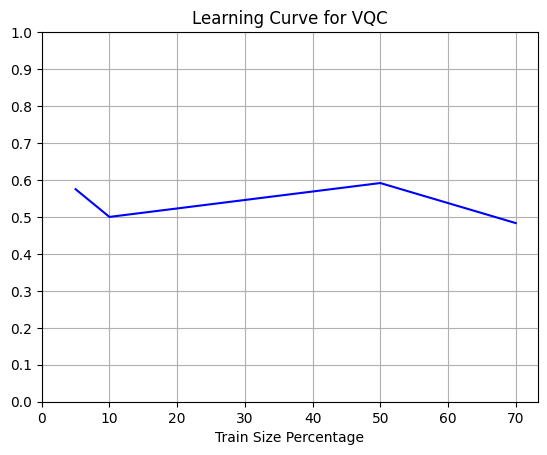

In [68]:
#===============================Learning Curve for VQC===========================================
plt.plot(training_sample,acc_vqtask1, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for VQC')
plt.show()

### 3D Scatter Plot for VQC Model

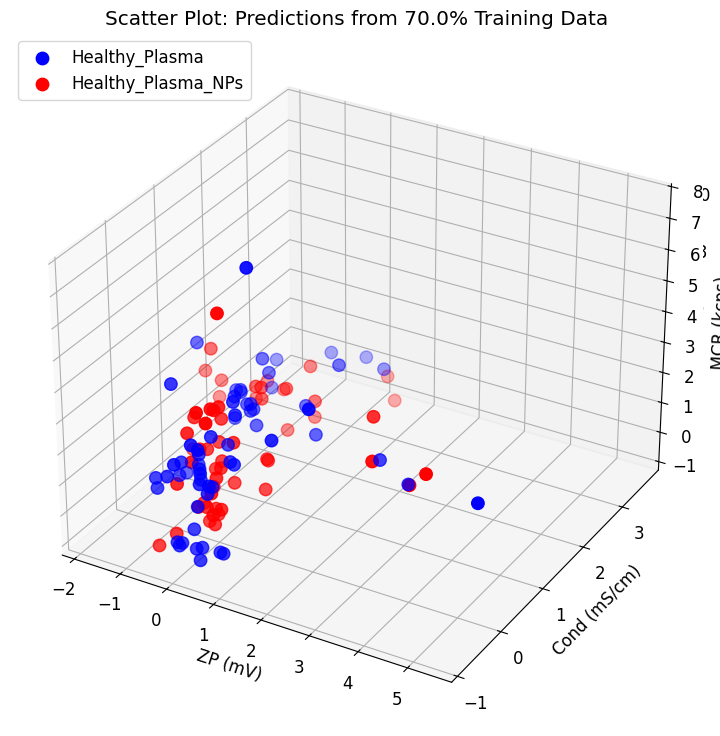

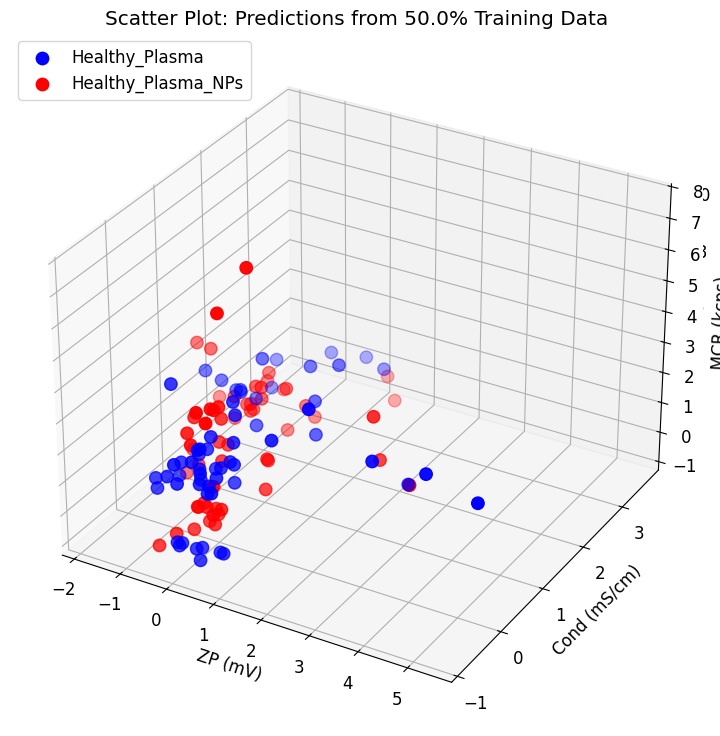

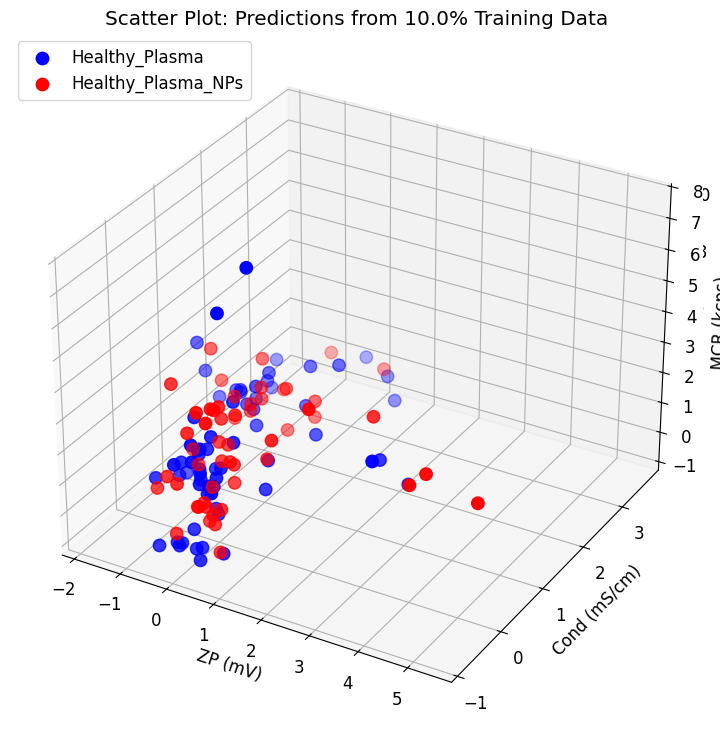

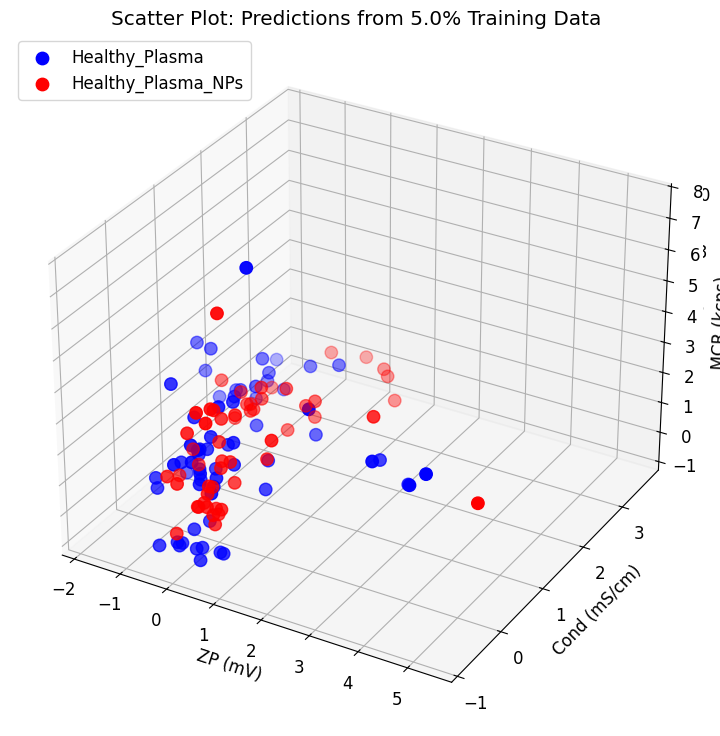

In [69]:
#=======================================3D Scatter Plot===============================
for i in range(len(train_set)):
    plt.rcParams.update({'font.size': 12})
    fig = plt.figure(figsize=(9,9))
    ax = plt.subplot(1,1,1,projection='3d')
    ax = fig.add_subplot(111,projection='3d')
    ax.scatter(test_features[pred_vqtask1[i]==0,0], test_features[pred_vqtask1[i]==0,1], test_features[pred_vqtask1[i]==0,2], c='blue', marker='o', label='Healthy_Plasma', s=80)
    ax.scatter(test_features[pred_vqtask1[i]==1,0], test_features[pred_vqtask1[i]==1,1], test_features[pred_vqtask1[i]==1,2], c='red', marker='o', label='Healthy_Plasma_NPs',s=80)
    # Set labels for each axis
    ax.set_xlabel('ZP (mV)')
    ax.set_ylabel('Cond (mS/cm)')
    ax.set_zlabel('MCR (kcps)')
    ax.set_title(f'Scatter Plot: Predictions from {train_set[i]*100}% Training Data')
    ax.tick_params("z", which="major",length=15,width = 2.0)
    ax.legend(loc='upper left')
    plt.show()

### ROC Curve for Vector Quantum Classifier

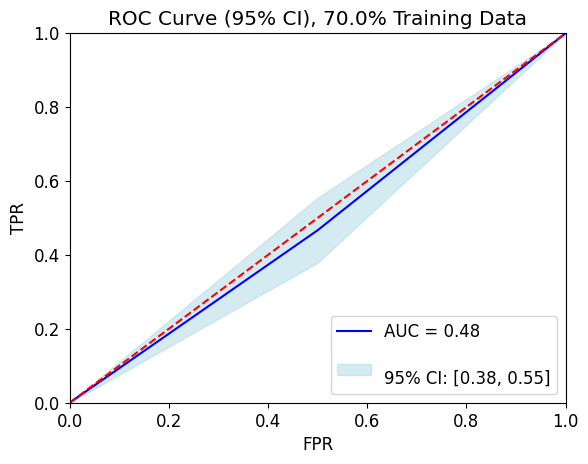

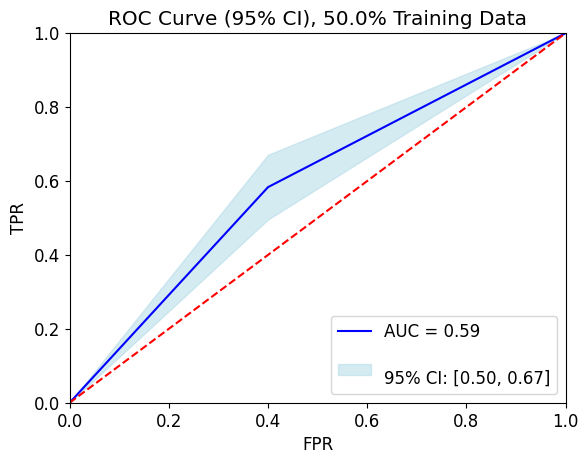

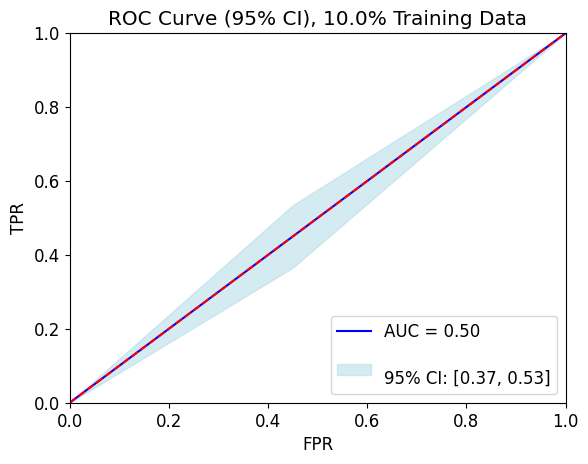

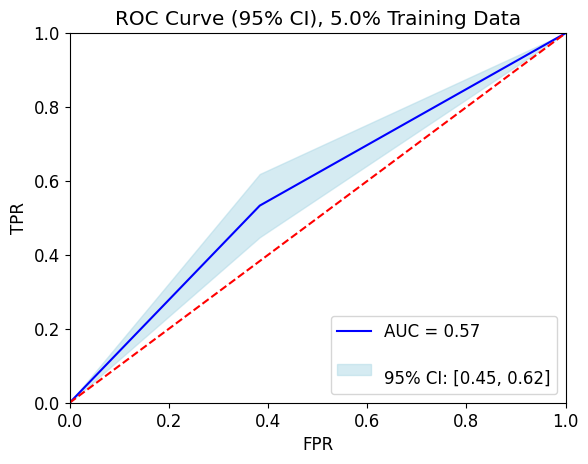

In [70]:
evaluate_ROC(train_set, test_labels, pred_vqtask1)

### Confusion Matrix for Vector Quantum Classifier

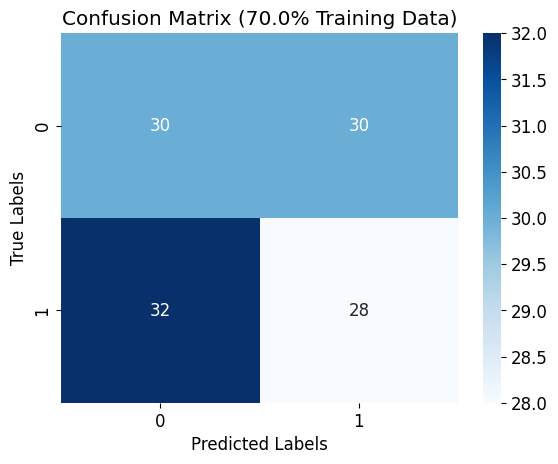

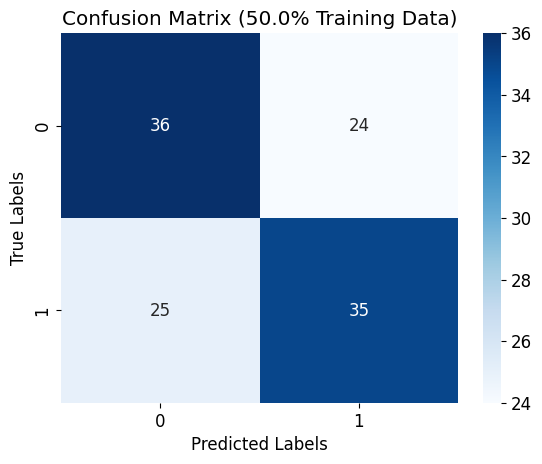

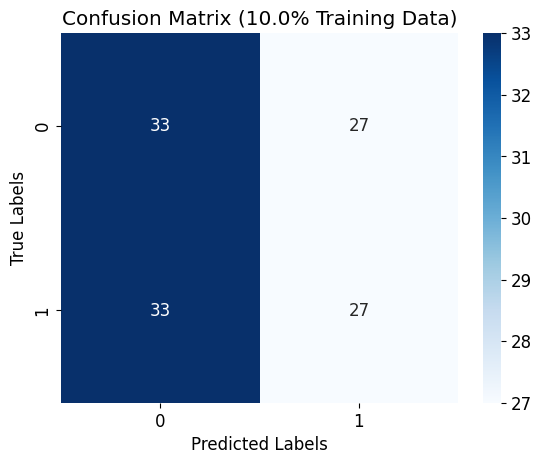

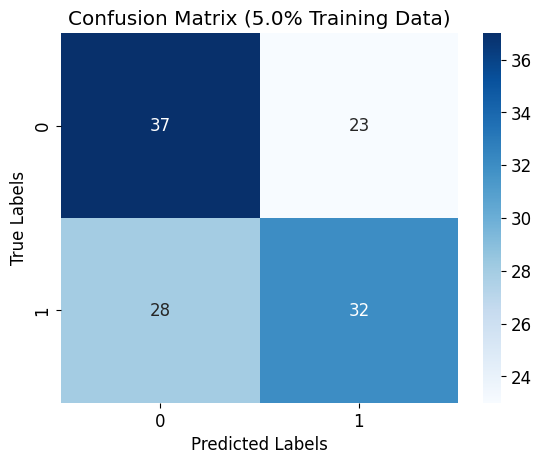

In [71]:
evaluate_con_mat(train_set, test_labels, pred_vqtask1)

# <center><h1><b>Task 5 (Cancer_Plasma vs Cancer_Plasma_NPs)</b></h1></center>

In [63]:
#==================Predictor Variables for dataset 5===================================
X_train = dataset5[['Zeta Potential', 'Cond', 'Mean Count Rate']]
X_test = dataset10[['Zeta Potential', 'Cond', 'Mean Count Rate']]
#===================Output Variable========================================
y_train = dataset5['Sample Name']
y_test = dataset10['Sample Name']
y_train = y_train.map(lambda x: 1 if x == 7 else 0)
y_test = y_test.map(lambda x: 1 if x == 7 else 0)

In [64]:
# Log-transform Mean_Count_Rate (if skewed)
X_train['Mean_Count_Rate_log'] = np.log(X_train['Mean Count Rate'])
X_test['Mean_Count_Rate_log'] = np.log(X_test['Mean Count Rate'])

X_train = X_train[['Zeta Potential', 'Cond', 'Mean_Count_Rate_log']]
X_test = X_test[['Zeta Potential', 'Cond', 'Mean_Count_Rate_log']]

## Logistic Regression

### Logistic Regression without hyperparameter tuning

In [63]:
#=====================Logistic Regression Model with different training sets================
eval_mod=evaluate_model(LogisticRegression(solver='lbfgs', max_iter=1000), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.483333 with 70.0% training records
Execution Time(LogisticRegression model): 0.002593 seconds with 70.0% training records

Accuracy score(LogisticRegression model): 0.525000 with 50.0% training records
Execution Time(LogisticRegression model): 0.002165 seconds with 50.0% training records

Accuracy score(LogisticRegression model): 0.483333 with 10.0% training records
Execution Time(LogisticRegression model): 0.001965 seconds with 10.0% training records

Accuracy score(LogisticRegression model): 0.516667 with 5.0% training records
Execution Time(LogisticRegression model): 0.001843 seconds with 5.0% training records



In [64]:
#===============================Hyperparameter Tuning================================
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
clf_LR = LogisticRegression(solver = 'lbfgs', max_iter=1000)
param_grid = { 'C': [0.001, 0.01, 0.1, 1, 10, 100],'penalty': ['l2'], 'solver': ['newton-cg','lbfgs' ,'liblinear', 'saga']}
grid_search = GridSearchCV(clf_LR, param_grid, cv=10, verbose=0 ,scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}


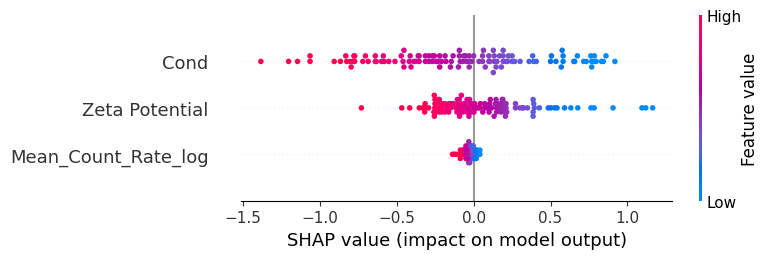

In [65]:
best_model = grid_search.best_estimator_
# Use SHAP's LinearExplainer with the best model
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    explainer = shap.LinearExplainer(best_model, X_train, feature_perturbation="interventional")
    shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values,X_test)

### Logistic Regression with hyperparameter tuning

In [66]:
#==============================Logistic Regression Model with Hyperparameter Tuning===========================
acc_LR, pred_LR, train_data, pred_proba_LR = evaluate_model(LogisticRegression(solver = best_params['solver'], penalty=best_params['penalty'], C = best_params['C']), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.500000 with 70.0% training records
Execution Time(LogisticRegression model): 0.002202 seconds with 70.0% training records

Accuracy score(LogisticRegression model): 0.533333 with 50.0% training records
Execution Time(LogisticRegression model): 0.001930 seconds with 50.0% training records

Accuracy score(LogisticRegression model): 0.566667 with 10.0% training records
Execution Time(LogisticRegression model): 0.001924 seconds with 10.0% training records

Accuracy score(LogisticRegression model): 0.500000 with 5.0% training records
Execution Time(LogisticRegression model): 0.001739 seconds with 5.0% training records



### Learning Curve for Logistic Regression

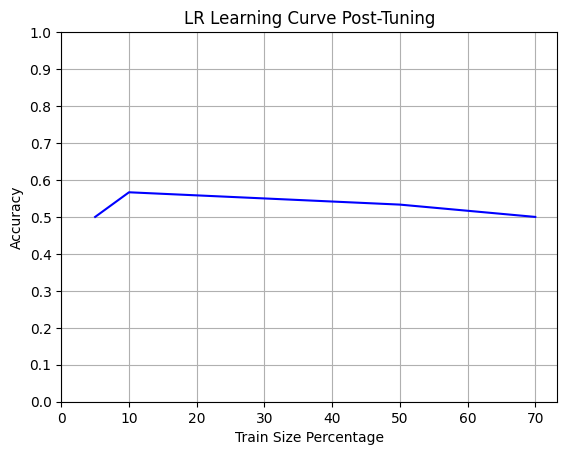

In [67]:
#===============================Learning Curve for LR===========================================
plt.plot(training_sample,acc_LR, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Logistic Regression

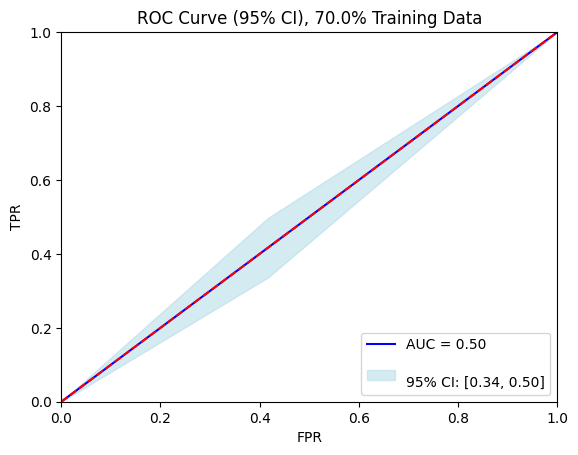

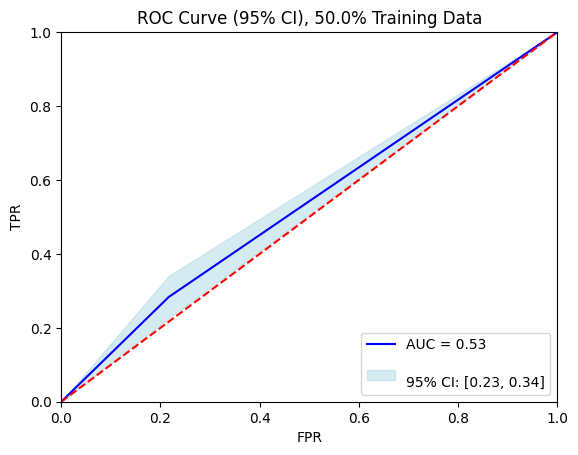

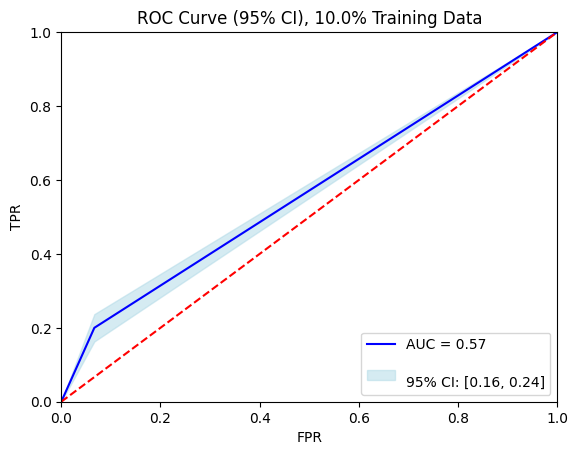

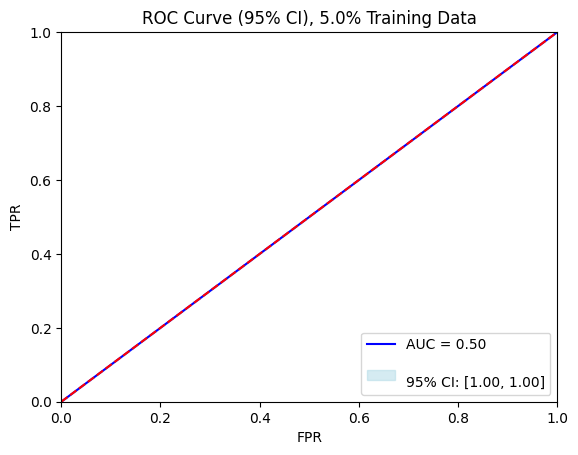

In [68]:
evaluate_ROC(train_set, y_test, pred_LR)

### Confusion Matrix for Logistic Regression

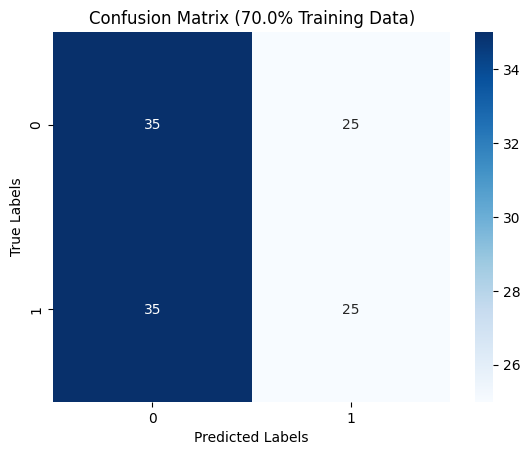

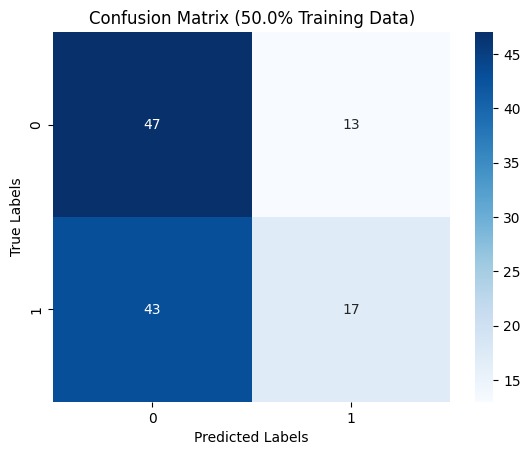

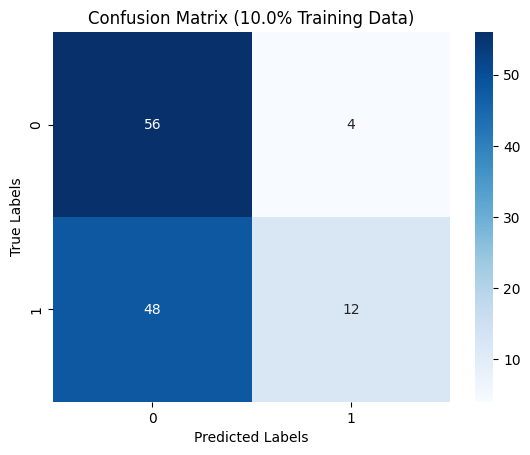

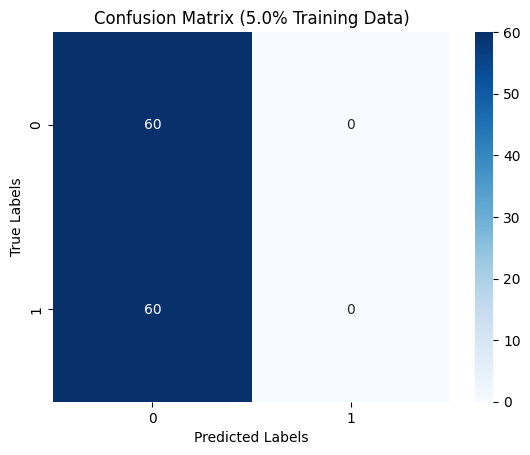

In [69]:
evaluate_con_mat(train_set, y_test, pred_LR)

In [70]:
del acc_LR, pred_LR, train_data, pred_proba_LR, best_params, clf_LR

## Random Forest

### Random Forest without hyperparameter tuning

In [71]:
eval_mod=evaluate_model(RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10), train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.466667 with 70.0% training records
Execution Time(RandomForestClassifier model): 0.031857 seconds with 70.0% training records

Accuracy score(RandomForestClassifier model): 0.516667 with 50.0% training records
Execution Time(RandomForestClassifier model): 0.024965 seconds with 50.0% training records

Accuracy score(RandomForestClassifier model): 0.458333 with 10.0% training records
Execution Time(RandomForestClassifier model): 0.024230 seconds with 10.0% training records

Accuracy score(RandomForestClassifier model): 0.500000 with 5.0% training records
Execution Time(RandomForestClassifier model): 0.023126 seconds with 5.0% training records



In [72]:
#==============================Hyperparameter  Tuning======================================
clf_RF = RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10)
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
}
grid_search = GridSearchCV(estimator=clf_RF, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'max_depth': 20, 'min_samples_split': 10, 'n_estimators': 100}


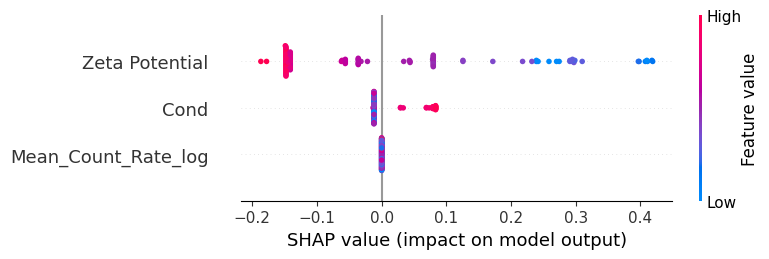

In [73]:
X_train_norm = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_norm = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
explainer_rf = shap.Explainer(grid_search.best_estimator_, X_train_norm)
shap_values_rf = explainer_rf(X_test_norm)
shap_values_class_1 = shap_values_rf.values[..., 1]
shap.summary_plot(shap_values_class_1, X_test_norm)

### Random Forest with hyperparameter tuning

In [74]:
#==============================Random Forest Model with Hyperparameter Tuning===========================
acc_RF, pred_RF, train_data, pred_proba_RF = evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.508333 with 70.0% training records
Execution Time(RandomForestClassifier model): 0.011127 seconds with 70.0% training records

Accuracy score(RandomForestClassifier model): 0.533333 with 50.0% training records
Execution Time(RandomForestClassifier model): 0.011488 seconds with 50.0% training records

Accuracy score(RandomForestClassifier model): 0.508333 with 10.0% training records
Execution Time(RandomForestClassifier model): 0.011039 seconds with 10.0% training records

Accuracy score(RandomForestClassifier model): 0.500000 with 5.0% training records
Execution Time(RandomForestClassifier model): 0.009027 seconds with 5.0% training records



### Learning Curve for Random Forest

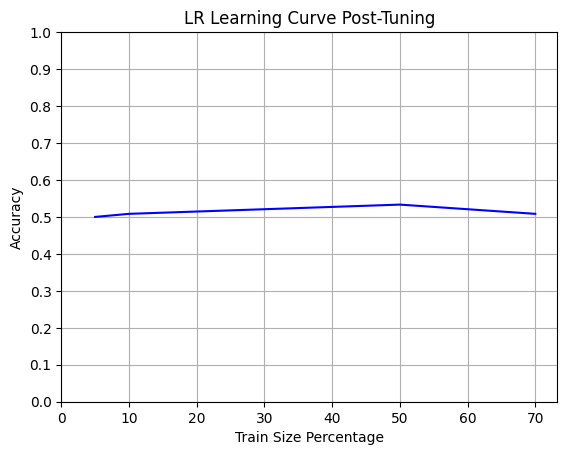

In [75]:
#===============================Learning Curve for Random Forest===========================================
plt.plot(training_sample,acc_RF, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Random Forest

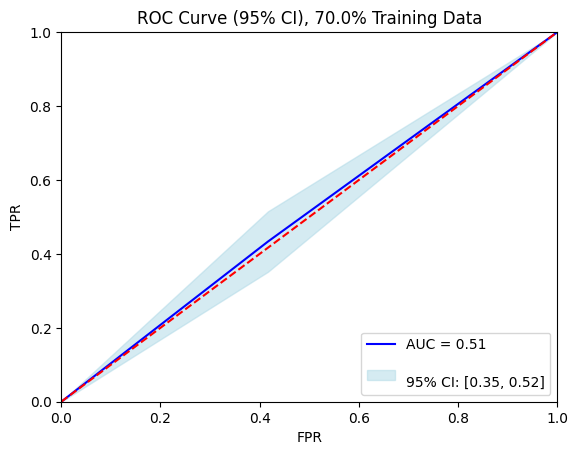

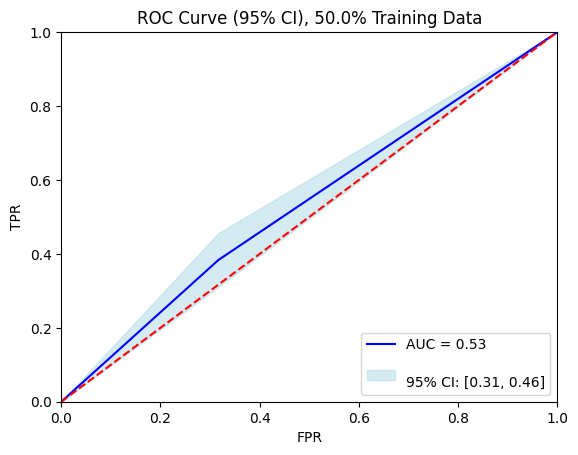

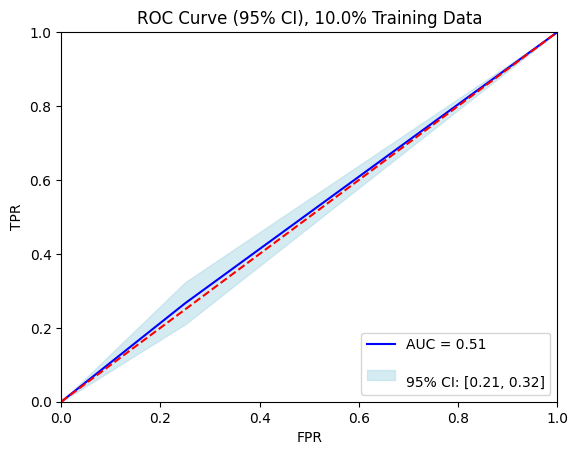

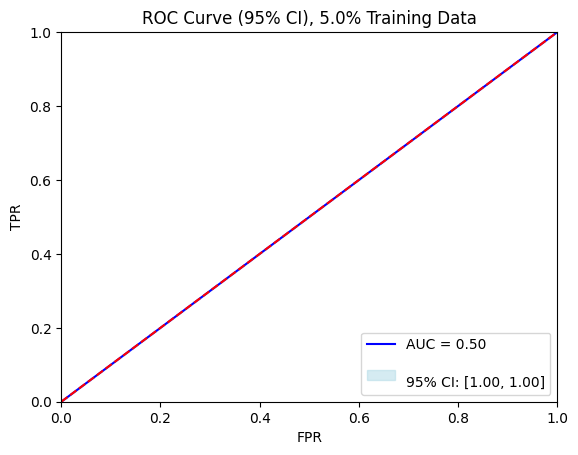

In [76]:
evaluate_ROC(train_set, y_test, pred_RF)

### Confusion Matrix for Random Forest

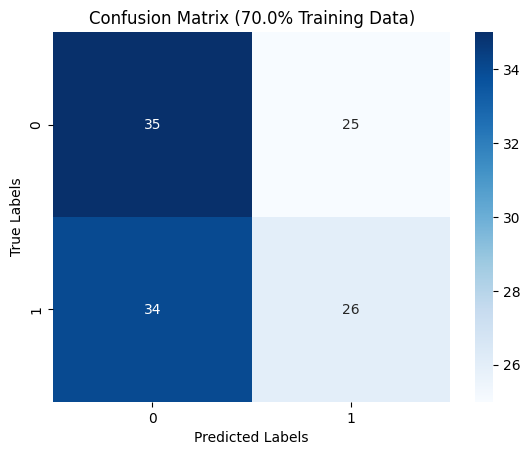

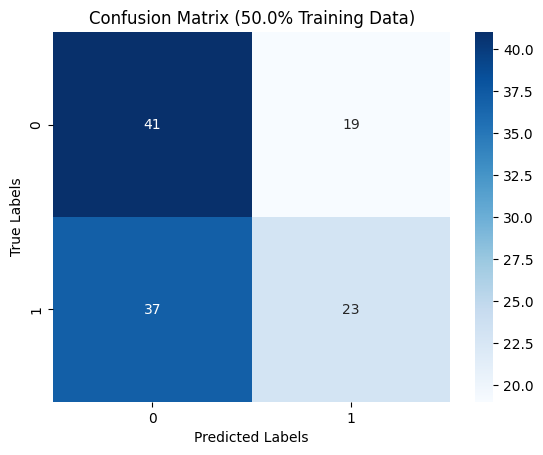

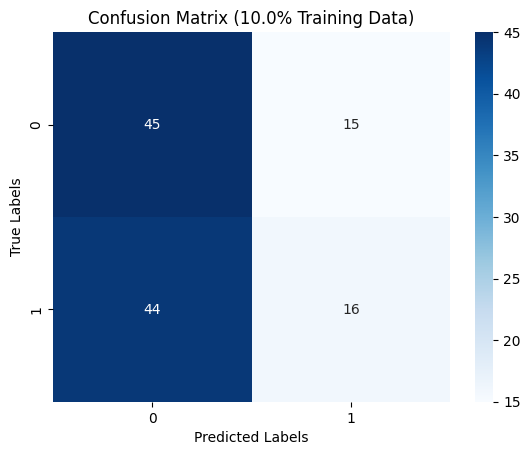

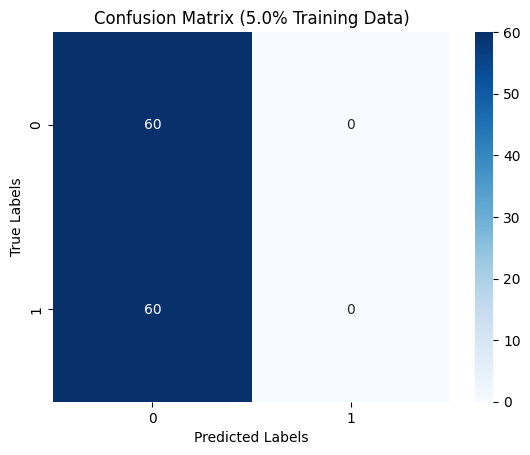

In [77]:
evaluate_con_mat(train_set, y_test, pred_RF)

In [78]:
del acc_RF, pred_RF, train_data, pred_proba_RF, best_params, clf_RF

## Support Vector Classifier

### Support Vector Classifier without hyperparameter tuning

In [79]:
eval_mod=evaluate_model(SVC(kernel='sigmoid', probability=True, C = 100, gamma='auto'), train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.500000 with 70.0% training records
Execution Time(SVC model): 0.003765 seconds with 70.0% training records

Accuracy score(SVC model): 0.500000 with 50.0% training records
Execution Time(SVC model): 0.002969 seconds with 50.0% training records

Accuracy score(SVC model): 0.500000 with 10.0% training records
Execution Time(SVC model): 0.002271 seconds with 10.0% training records

Accuracy score(SVC model): 0.500000 with 5.0% training records
Execution Time(SVC model): 0.002012 seconds with 5.0% training records



In [80]:
#==========================Hyperparameter Tuning==========================
clf_SVM = SVC(probability=True)
param_grid = {
    'C': [1, 10, 100],  # Reduce the range of C
    'kernel': ['sigmoid','rbf'],  # Focus on one kernel type
    'gamma': [0.01, 0.1]  # Keep a smaller range of gamma
}
grid_search = GridSearchCV(estimator=clf_SVM, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 100, 'gamma': 0.1, 'kernel': 'rbf'}


Using 280 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/120 [00:00<?, ?it/s]

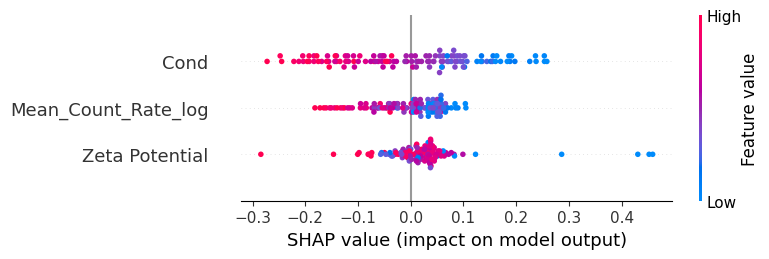

In [81]:
best_model = grid_search.best_estimator_
explainer_svc = shap.KernelExplainer(best_model.predict_proba, X_train)
shap_values_svc = explainer_svc(X_test)
shap_values_svc_class_1 = shap_values_svc.values[..., 1]
shap.summary_plot(shap_values_svc_class_1, X_test)

### Support Vector Classifier with hyperparameter tuning

In [82]:
acc_SVC, pred_SVC, train_data, pred_proba_SVC=evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.458333 with 70.0% training records
Execution Time(SVC model): 0.004059 seconds with 70.0% training records

Accuracy score(SVC model): 0.483333 with 50.0% training records
Execution Time(SVC model): 0.002650 seconds with 50.0% training records

Accuracy score(SVC model): 0.458333 with 10.0% training records
Execution Time(SVC model): 0.001680 seconds with 10.0% training records

Accuracy score(SVC model): 0.500000 with 5.0% training records
Execution Time(SVC model): 0.001551 seconds with 5.0% training records



### Learning Curve for Support Vector Classifier

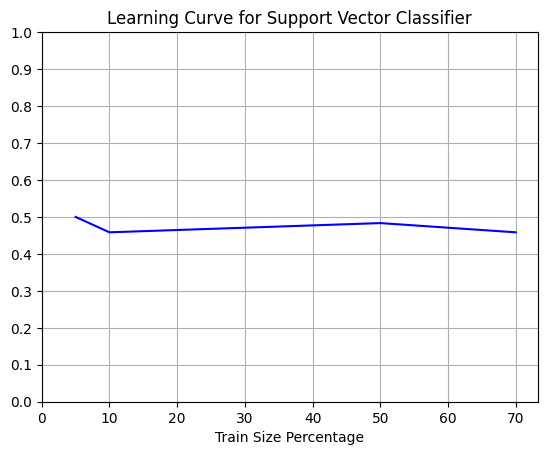

In [83]:
#===============================Learning Curve for SVC===========================================
plt.plot(training_sample,acc_SVC, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for Support Vector Classifier')
plt.show()

### ROC Curve for Support Vector Classifier

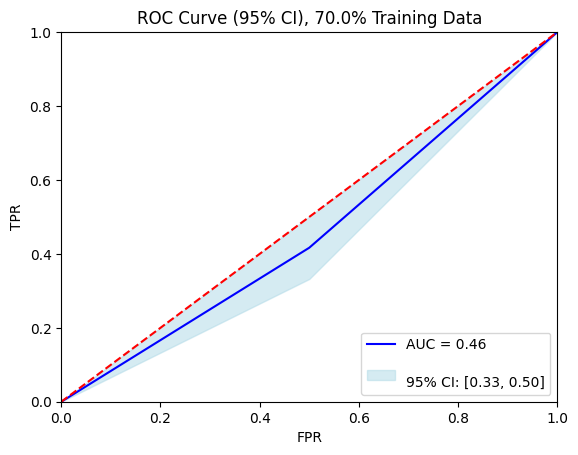

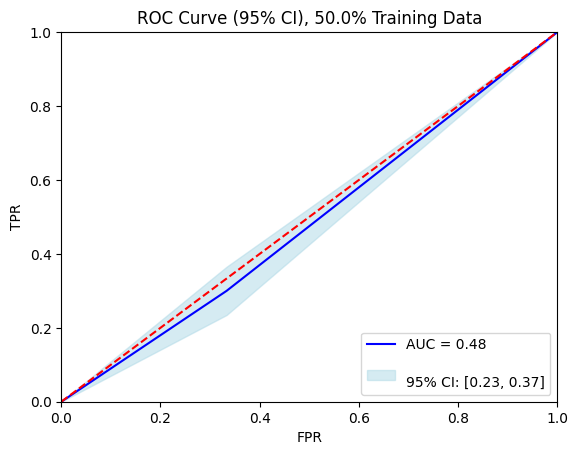

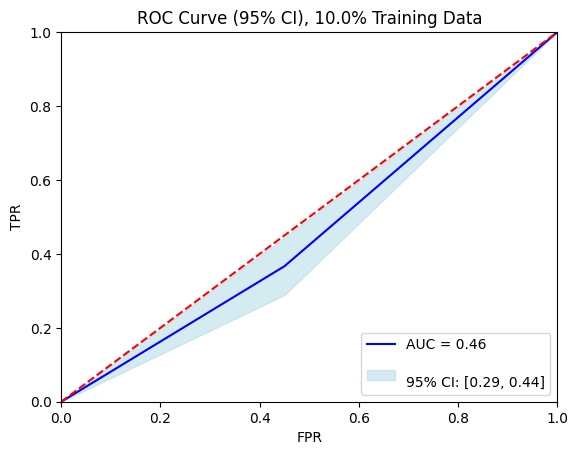

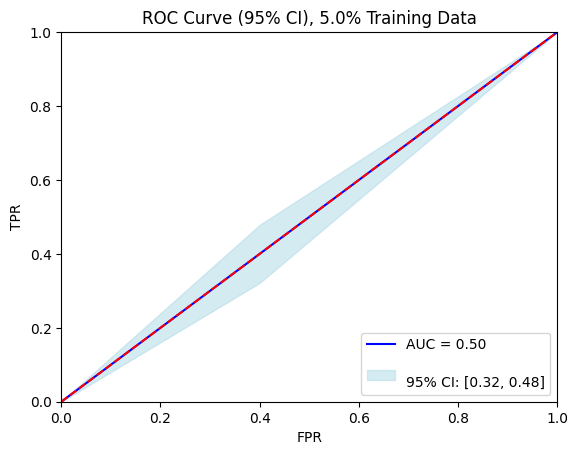

In [84]:
evaluate_ROC(train_set, y_test, pred_SVC)

### Confusion Matrix for Support Vector Classifier

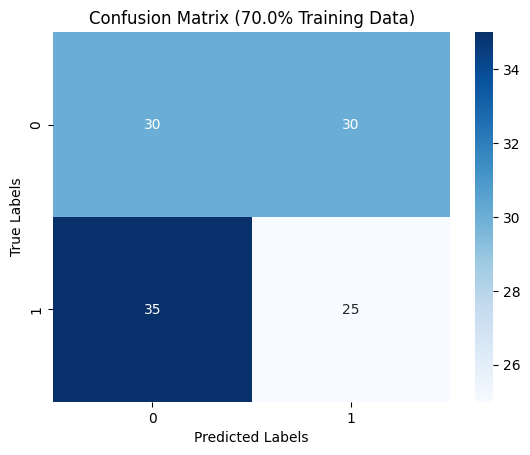

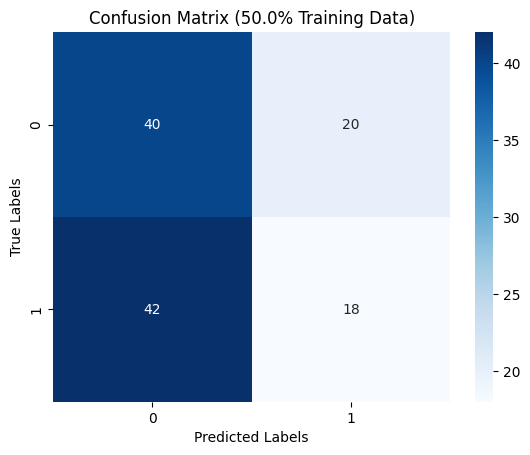

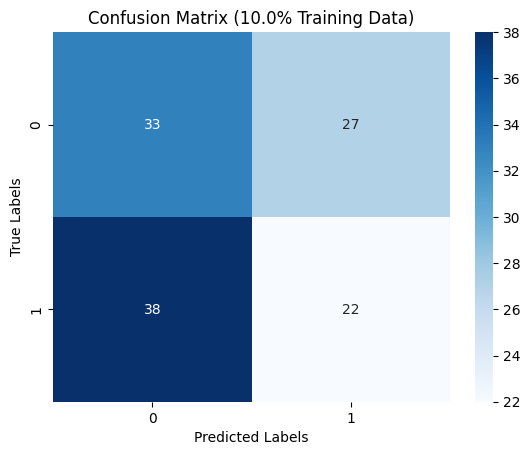

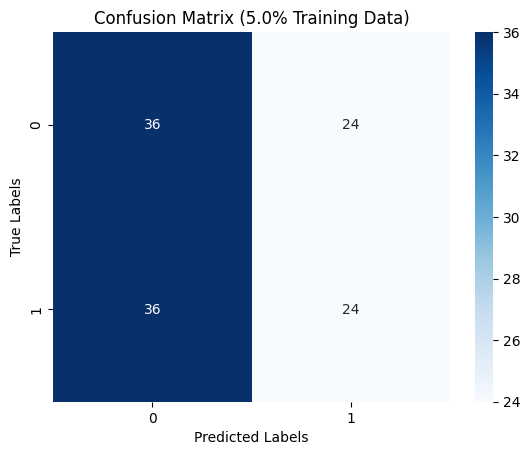

In [85]:
evaluate_con_mat(train_set, y_test, pred_SVC)

In [86]:
del acc_SVC, pred_SVC, train_data, pred_proba_SVC, best_params, clf_SVM

## Vector Quantum Classifier

In [88]:
#=====================Vector Quantum Classifier Model with different training sets================
scaler = StandardScaler()
train_features = scaler.fit_transform(X_train)
train_labels = y_train
test_features = scaler.transform(X_test)
test_labels = y_test
num_features = train_features.shape[1]
feature_map = ZZFeatureMap(feature_dimension=num_features, reps=1)

In [89]:
# del X_train, y_train

In [90]:
ansatz = EfficientSU2(num_qubits=num_features, entanglement = 'sca',  reps=1)

In [91]:
optimizer = op.COBYLA(maxiter=150)
sampler = Sampler()

### Vector Quantum Classifier with Hyperparameter Tuning

In [92]:
#======================================VQC=================================================
clf_vqc = VQC(
    sampler=sampler,
    feature_map=feature_map,
    ansatz=ansatz,
    loss = 'cross_entropy',
    optimizer=optimizer
)
acc_vqtask1 = []
pred_vqtask1 = []
for elm in train_set:
    vqc = copy.deepcopy(clf_vqc)
    X_t, dummy_x, y_t, dummy_y = train_test_split(train_features, train_labels, train_size=elm, random_state=algorithm_globals.random_seed)
    vqc.fit(X_t, y_t.values)
    start = time.time()
    pred = vqc.predict(test_features)
    end = time.time()
    accuracy = accuracy_score(test_labels.values, pred)
    pred_vqtask1.append(pred)
    acc_vqtask1.append(accuracy)
    execution_time = end - start
    print(f'Accuracy score(VQC Model): {accuracy} with {elm*100}% training records')
    print(f'Execution Tim(VQC Model): {execution_time} seconds with {elm*100}% training records')
    print()
#======================================VQC=================================================

Accuracy score(VQC Model): 0.633333333333333 with 70.0% training records
Execution Tim(VQC Model): 0.5380845069885254 seconds with 70.0% training records

Accuracy score(VQC Model): 0.6172 with 50.0% training records
Execution Tim(VQC Model): 0.38813185691833496 seconds with 50.0% training records

Accuracy score(VQC Model): 0.575 with 10.0% training records
Execution Tim(VQC Model): 0.38667845726013184 seconds with 10.0% training records

Accuracy score(VQC Model): 0.566666666666666 with 5.0% training records
Execution Tim(VQC Model): 0.44286394119262695 seconds with 5.0% training records



## Learning Curve for VQC

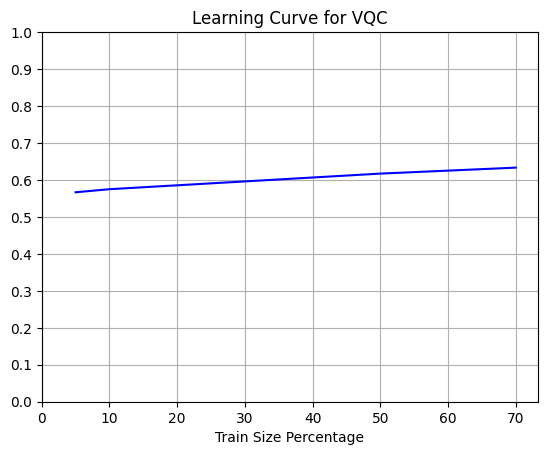

In [93]:
#===============================Learning Curve for VQC===========================================
plt.plot(training_sample,acc_vqtask1, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for VQC')
plt.show()

### 3D Scatter Plot for VQC Model

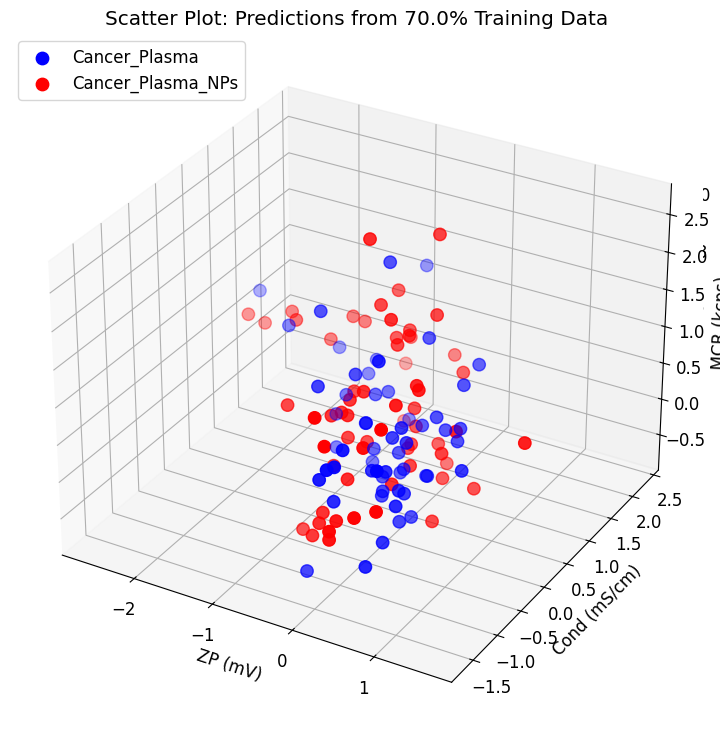

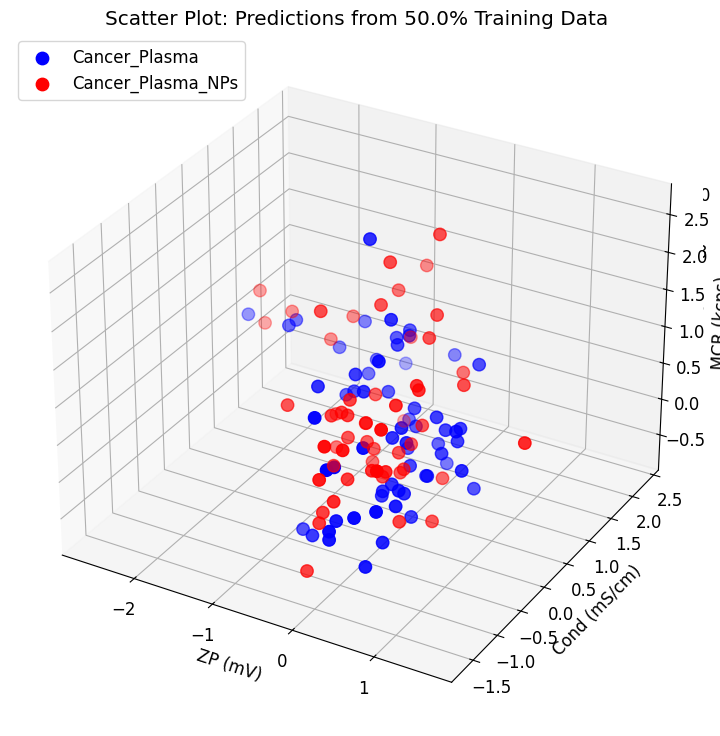

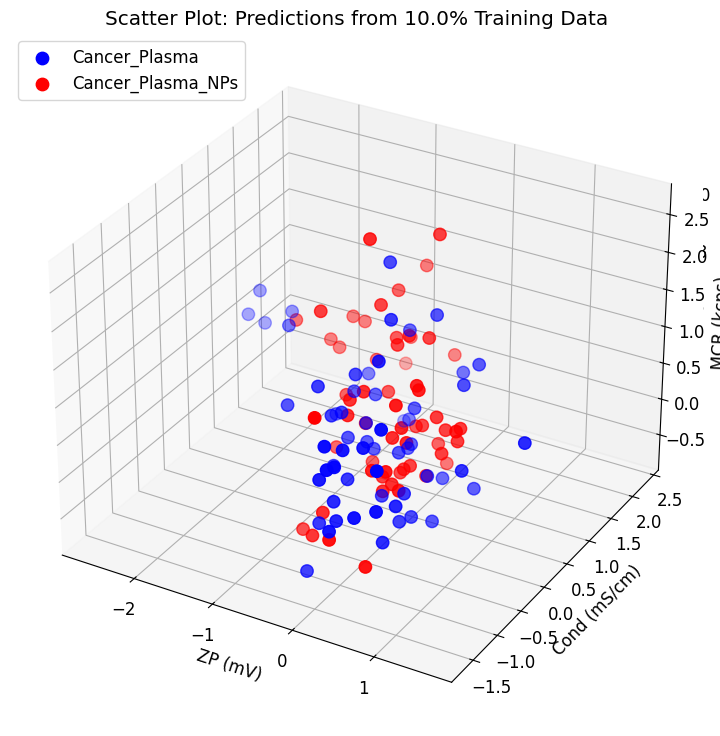

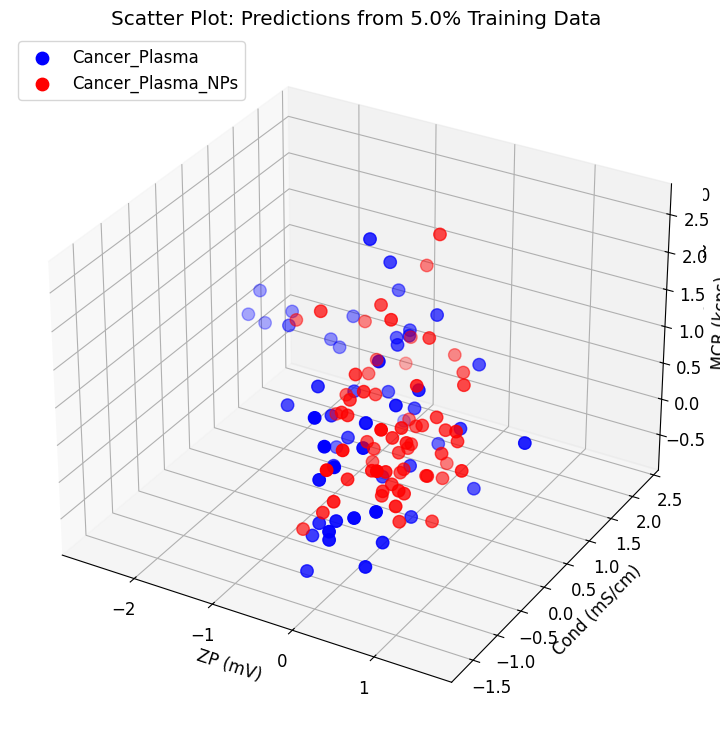

In [94]:
#=======================================3D Scatter Plot===============================
for i in range(len(train_set)):
    plt.rcParams.update({'font.size': 12})
    fig = plt.figure(figsize=(9,9))
    ax = plt.subplot(1,1,1,projection='3d')
    ax = fig.add_subplot(111,projection='3d')
    ax.scatter(test_features[pred_vqtask1[i]==0,0], test_features[pred_vqtask1[i]==0,1], test_features[pred_vqtask1[i]==0,2], c='blue', marker='o', label='Cancer_Plasma', s=80)
    ax.scatter(test_features[pred_vqtask1[i]==1,0], test_features[pred_vqtask1[i]==1,1], test_features[pred_vqtask1[i]==1,2], c='red', marker='o', label='Cancer_Plasma_NPs',s=80)
  # Set labels for each axis
    ax.set_xlabel('ZP (mV)')
    ax.set_ylabel('Cond (mS/cm)')
    ax.set_zlabel('MCR (kcps)')
    ax.set_title(f'Scatter Plot: Predictions from {train_set[i]*100}% Training Data')
    ax.tick_params("z", which="major",length=15,width = 2.0)
    ax.legend(loc='upper left')
    plt.show()

### ROC Curve for Vector Quantum Classifier

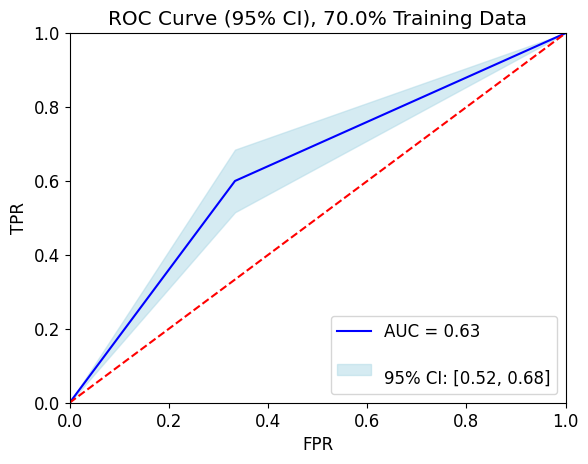

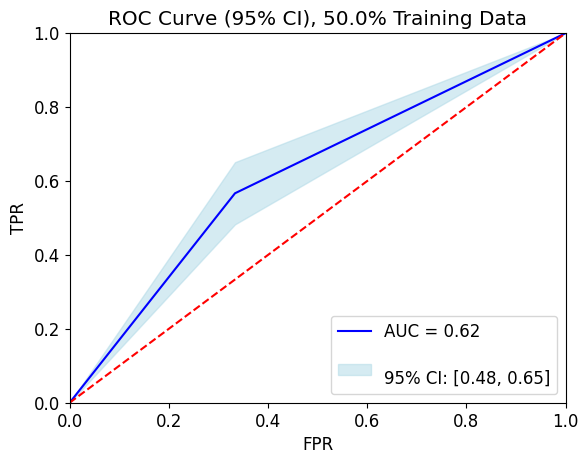

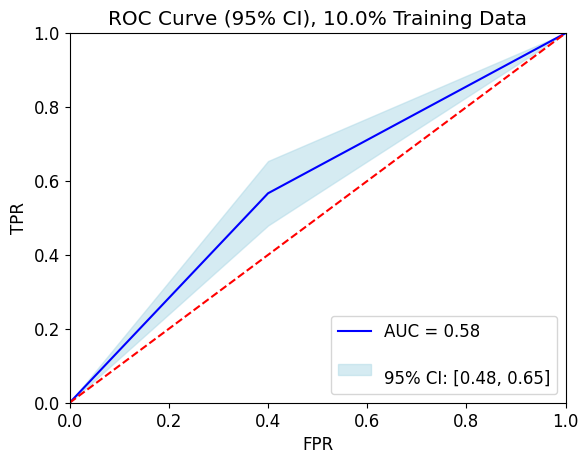

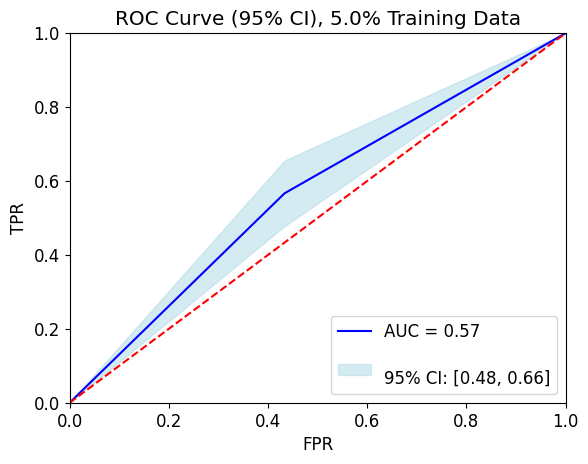

In [109]:
evaluate_ROC(train_set, test_labels, pred_vqtask1)

### Confusion Matrix for Vector Quantum Classifier

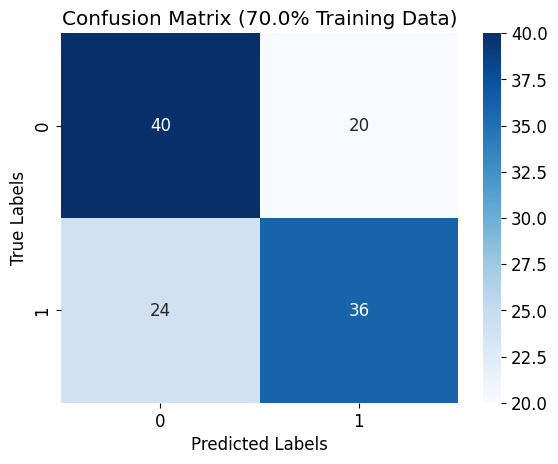

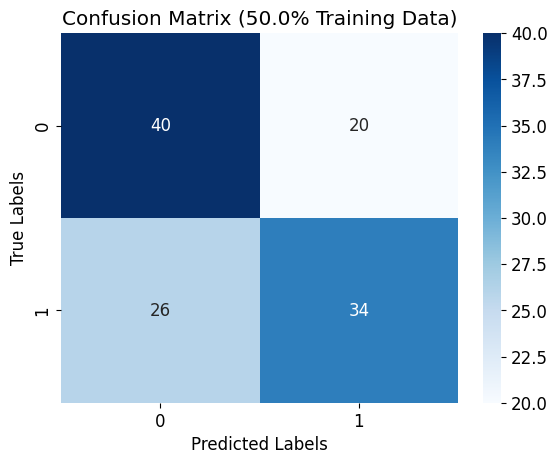

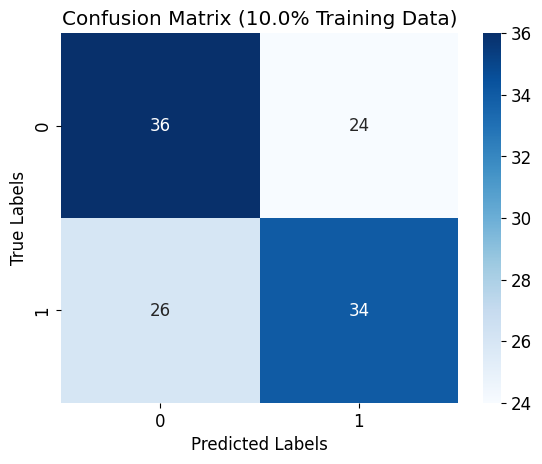

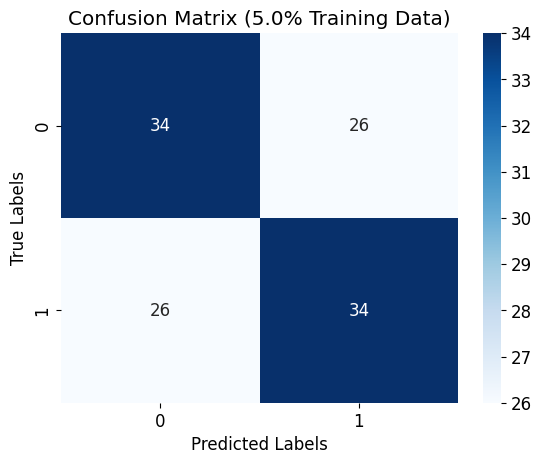

In [110]:
evaluate_con_mat(train_set, test_labels, pred_vqtask1)

# <center><h1><b>Task 6 (Healthy_EVs_NPs vs Cancer_EVs_NPs)</b></h1></center>

In [61]:
#==================Predictor Variables for dataset 4===================================
X_train = dataset11[['Zeta Potential', 'Cond', 'Mean Count Rate']]
X_test = dataset12[['Zeta Potential', 'Cond', 'Mean Count Rate']]
#===================Output Variable========================================
y_train = dataset11['Sample Name']
y_test = dataset12['Sample Name']
y_train = y_train.map(lambda x: 1 if x == 3 else 0)
y_test = y_test.map(lambda x: 1 if x == 3 else 0)

## Logistic Regression

### Logistic Regression without hyperparameter tuning (Healthy_EVs_NPs vs Cancer_EVs_NPs)

In [62]:
#=====================Logistic Regression Model with different training sets================
eval_mod=evaluate_model(LogisticRegression(solver='lbfgs', max_iter=1000), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.866667 with 70.0% training records
Execution Time(LogisticRegression model): 0.002209 seconds with 70.0% training records

Accuracy score(LogisticRegression model): 0.816667 with 50.0% training records
Execution Time(LogisticRegression model): 0.001749 seconds with 50.0% training records

Accuracy score(LogisticRegression model): 0.733333 with 10.0% training records
Execution Time(LogisticRegression model): 0.001512 seconds with 10.0% training records

Accuracy score(LogisticRegression model): 0.816667 with 5.0% training records
Execution Time(LogisticRegression model): 0.001453 seconds with 5.0% training records



In [63]:
#===============================Hyperparameter Tuning================================
clf_LR = LogisticRegression(solver = 'lbfgs', max_iter=1000)
param_grid = { 'C': [0.001, 0.01, 0.1, 1, 10, 100],'penalty': ['l2'], 'solver': ['newton-cg','lbfgs' ,'liblinear', 'saga']}
grid_search = GridSearchCV(clf_LR, param_grid, cv=10, verbose=0 ,scoring='accuracy')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

/home/abhishek.f/.local/lib/python3.9/site-packages/sklearn/utils/optimize.py:44: LineSearchWarning: The line search algorithm did not converge
  ret = line_search_wolfe2(
/home/abhishek.f/.local/lib/python3.9/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/home/abhishek.f/.local/lib/python3.9/site-packages/sklearn/utils/optimize.py:44: LineSearchWarning: The line search algorithm did not converge
  ret = line_search_wolfe2(
/home/abhishek.f/.local/lib/python3.9/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/home/abhishek.f/.local/lib/python3.9/site-packages/sklearn/utils/optimize.py:44: LineSearchWarning: The line search algorithm did not converge
  ret = line_search_wolfe2(
/home/abhishek.f/.local/lib/python3.9/site-packages/sklearn/utils/optimize.py:204: UserWarning: Line Search failed
  warnings.warn("Line Search failed")
/home/abhishek.f/.conda/e

Best hyperparameters: {'C': 0.01, 'penalty': 'l2', 'solver': 'newton-cg'}


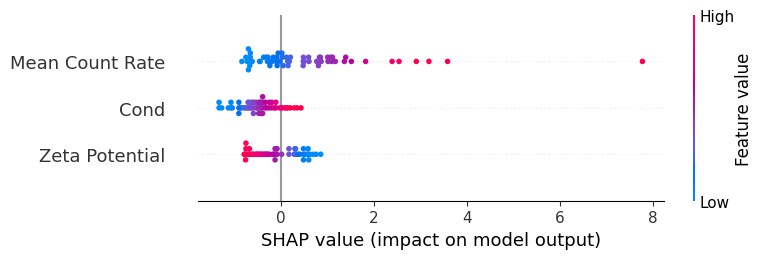

In [64]:
best_model = grid_search.best_estimator_
# Use SHAP's LinearExplainer with the best model
with warnings.catch_warnings():
    warnings.simplefilter(action='ignore', category=FutureWarning)
    explainer = shap.LinearExplainer(best_model, X_train, feature_perturbation="interventional")
    shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values,X_test)

### Logistic Regression with hyperparameter tuning (Healthy_EVs_NPs vs Cancer_EVs_NPs)

In [65]:
#==============================Logistic Regression Model with Hyperparameter Tuning===========================
acc_LR, pred_LR, train_data, pred_proba_LR = evaluate_model(LogisticRegression(solver = best_params['solver'], penalty=best_params['penalty'], C = best_params['C']), train_set, X_train, y_train, X_test, y_test)

Accuracy score(LogisticRegression model): 0.866667 with 70.0% training records
Execution Time(LogisticRegression model): 0.001002 seconds with 70.0% training records

Accuracy score(LogisticRegression model): 0.866667 with 50.0% training records
Execution Time(LogisticRegression model): 0.000960 seconds with 50.0% training records

Accuracy score(LogisticRegression model): 0.800000 with 10.0% training records
Execution Time(LogisticRegression model): 0.000940 seconds with 10.0% training records

Accuracy score(LogisticRegression model): 0.783333 with 5.0% training records
Execution Time(LogisticRegression model): 0.000949 seconds with 5.0% training records



### Learning Curve for Logistic Regression (Healthy_EVs_NPs vs Cancer_EVs_NPs)

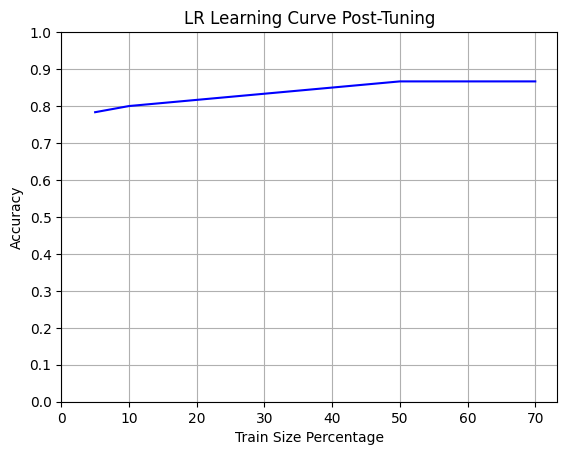

In [66]:
#===============================Learning Curve for LR===========================================
plt.plot(training_sample,acc_LR, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Logistic Regression (Healthy_EVs_NPs vs Cancer_EVs_NPs)

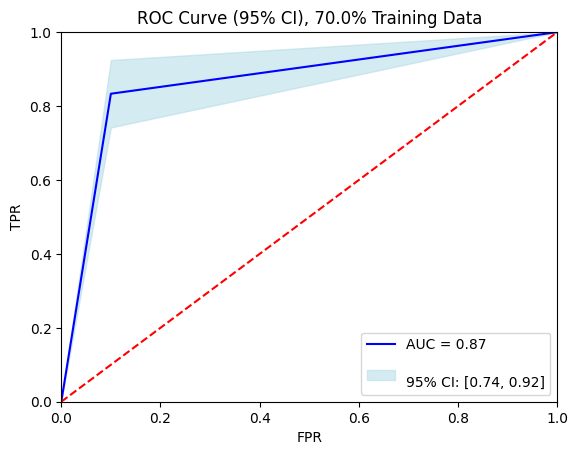

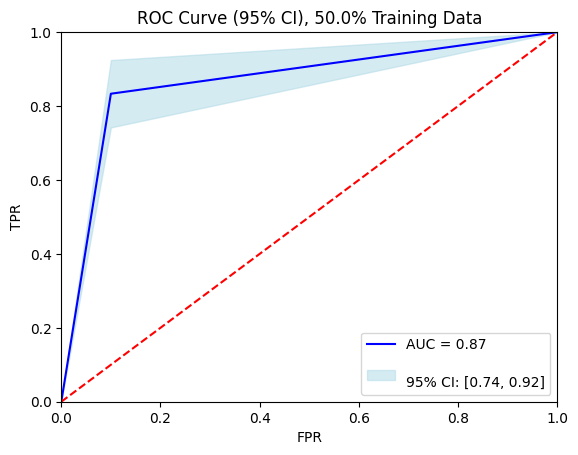

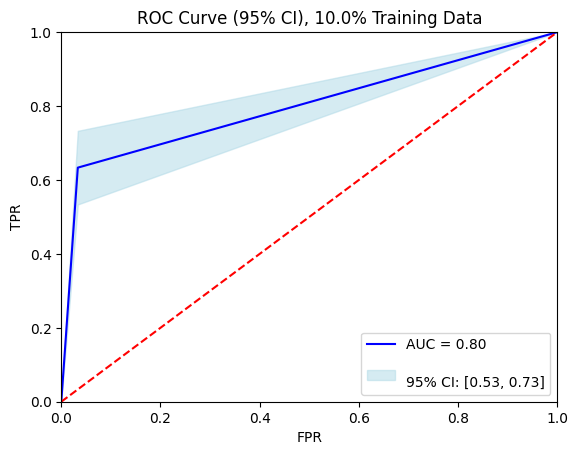

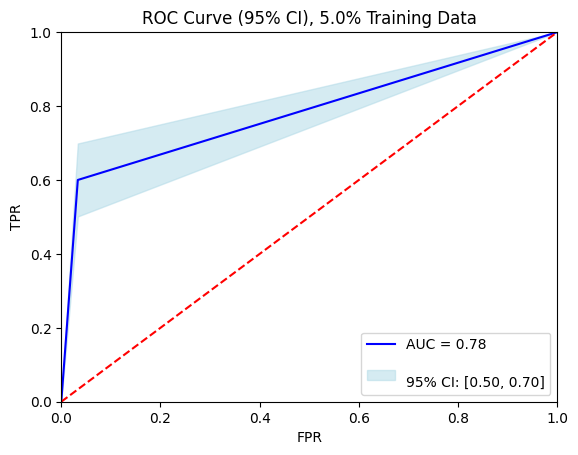

In [67]:
evaluate_ROC(train_set, y_test, pred_LR)

### Confusion Matrix for Logistic Regression (Healthy_EVs_NPs vs Cancer_EVs_NPs)

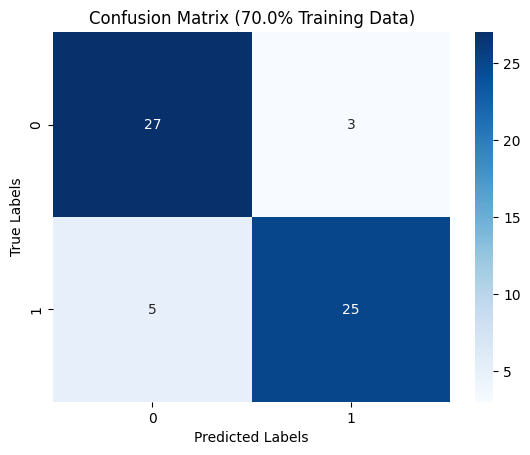

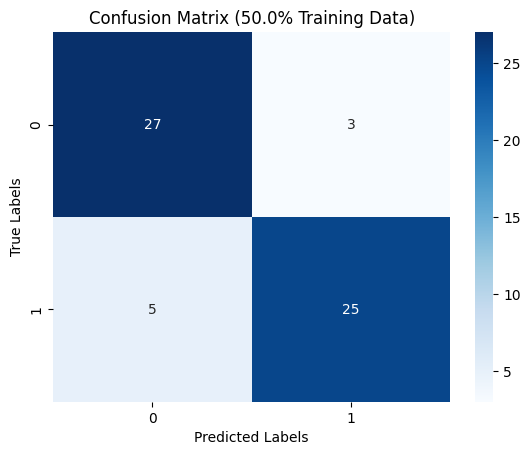

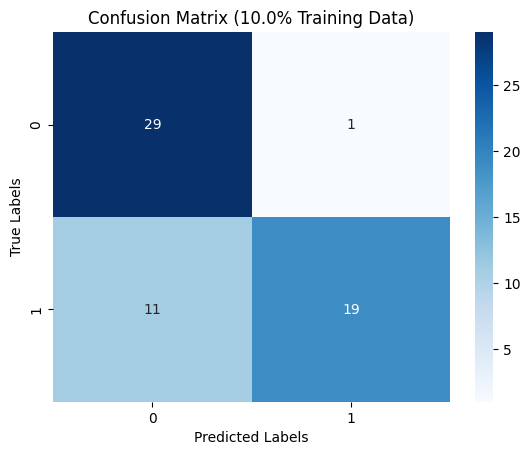

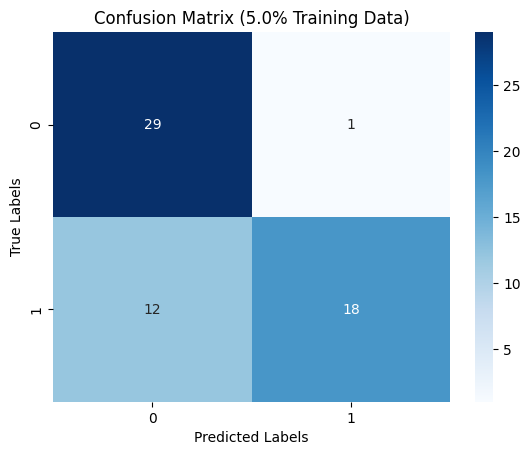

In [68]:
evaluate_con_mat(train_set, y_test, pred_LR)

In [69]:
del acc_LR, pred_LR, train_data, pred_proba_LR, best_params, clf_LR

## Random Forest

### Random Forest without hyperparameter tuning (Healthy_EVs_NPs vs Cancer_EVs_NPs)

In [70]:
eval_mod=evaluate_model(RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10), train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.866667 with 70.0% training records
Execution Time(RandomForestClassifier model): 0.026143 seconds with 70.0% training records

Accuracy score(RandomForestClassifier model): 0.850000 with 50.0% training records
Execution Time(RandomForestClassifier model): 0.027836 seconds with 50.0% training records

Accuracy score(RandomForestClassifier model): 0.500000 with 10.0% training records
Execution Time(RandomForestClassifier model): 0.025186 seconds with 10.0% training records

Accuracy score(RandomForestClassifier model): 0.500000 with 5.0% training records
Execution Time(RandomForestClassifier model): 0.021419 seconds with 5.0% training records



In [71]:
#==============================Hyperparameter  Tuning======================================
clf_RF = RandomForestClassifier(n_estimators = 300, max_depth = 10,  min_samples_split = 10)
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
}
grid_search = GridSearchCV(estimator=clf_RF, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'max_depth': 30, 'min_samples_split': 2, 'n_estimators': 100}


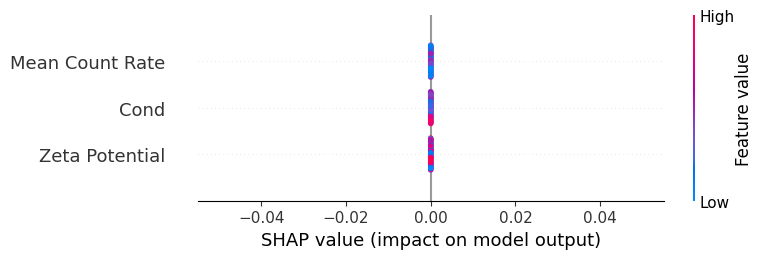

In [72]:
scaler = StandardScaler()
X_train_norm = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_norm = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
explainer_rf = shap.Explainer(grid_search.best_estimator_, X_train_norm)
shap_values_rf = explainer_rf(X_test_norm)
shap_values_class_1 = shap_values_rf.values[..., 1]
shap.summary_plot(shap_values_class_1, X_test_norm)

### Random Forest with hyperparameter tuning (Healthy_EVs_NPs vs Cancer_EVs_NPs)

In [73]:
#==============================Random Forest Model with Hyperparameter Tuning===========================
acc_RF, pred_RF, train_data, pred_proba_RF = evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(RandomForestClassifier model): 0.866667 with 70.0% training records
Execution Time(RandomForestClassifier model): 0.008205 seconds with 70.0% training records

Accuracy score(RandomForestClassifier model): 0.816667 with 50.0% training records
Execution Time(RandomForestClassifier model): 0.008994 seconds with 50.0% training records

Accuracy score(RandomForestClassifier model): 0.683333 with 10.0% training records
Execution Time(RandomForestClassifier model): 0.007957 seconds with 10.0% training records

Accuracy score(RandomForestClassifier model): 0.616667 with 5.0% training records
Execution Time(RandomForestClassifier model): 0.007939 seconds with 5.0% training records



### Learning Curve for Random Forest (Healthy_EVs_NPs vs Cancer_EVs_NPs)

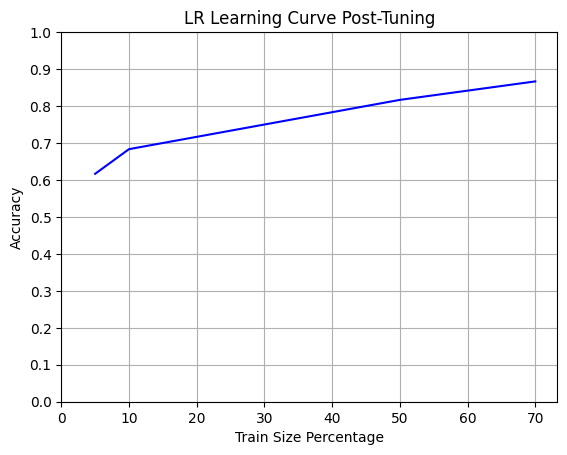

In [74]:
#===============================Learning Curve for Random Forest===========================================
plt.plot(training_sample,acc_RF, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.ylabel('Accuracy')
plt.title('LR Learning Curve Post-Tuning')
plt.show()

### ROC Curve for Random Forest (Healthy_EVs_NPs vs Cancer_EVs_NPs)

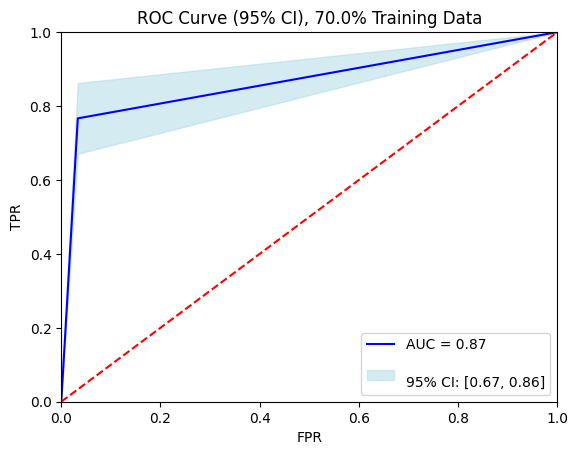

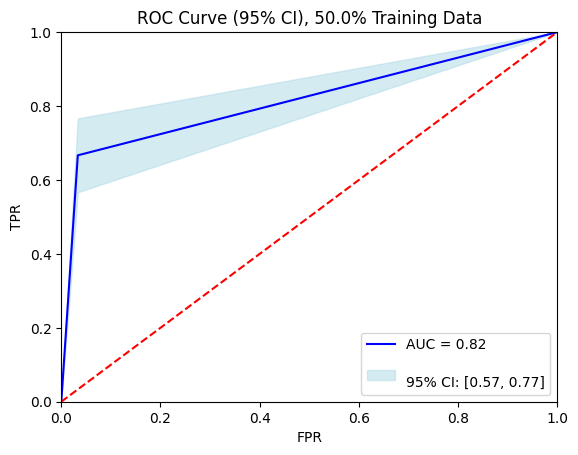

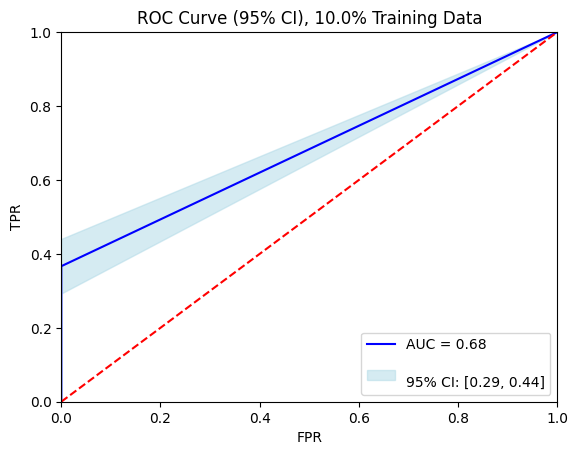

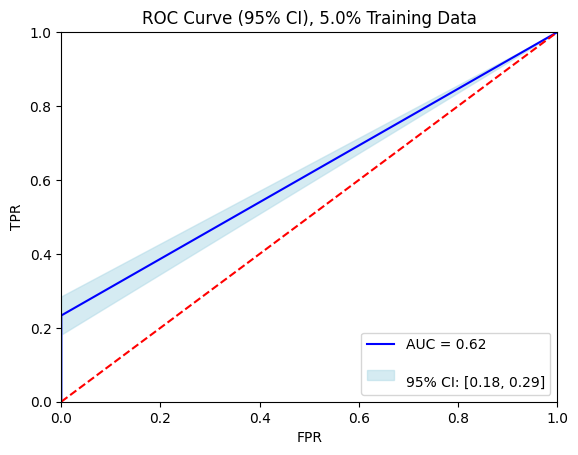

In [75]:
evaluate_ROC(train_set, y_test, pred_RF)

### Confusion Matrix for Random Forest (Healthy_EVs_NPs vs Cancer_EVs_NPs)

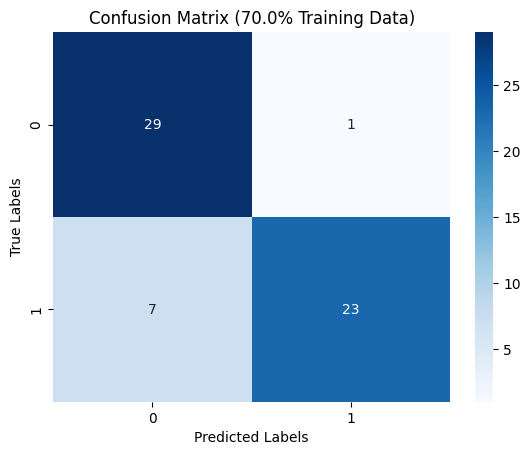

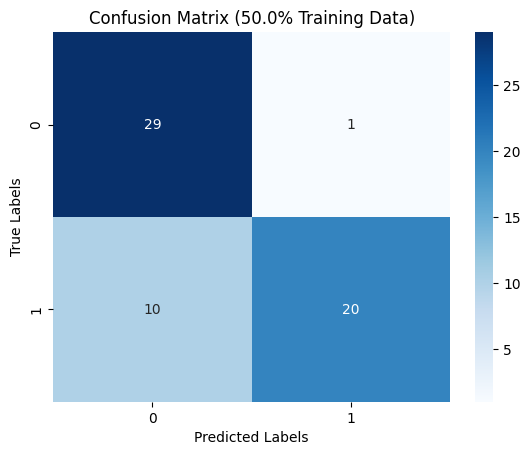

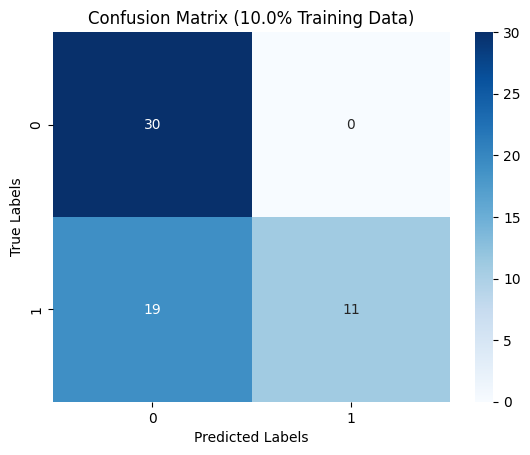

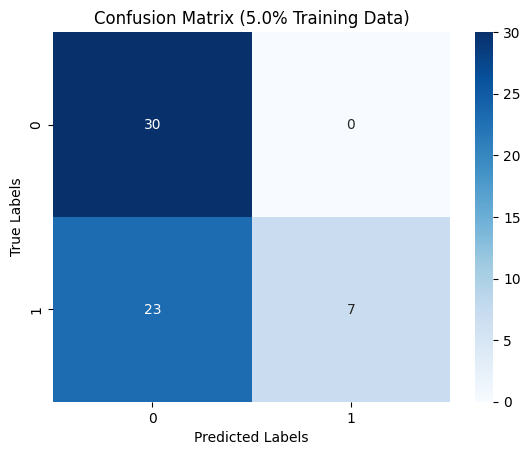

In [76]:
evaluate_con_mat(train_set, y_test, pred_RF)

In [77]:
del  acc_RF, pred_RF, train_data, pred_proba_RF, best_params, clf_RF

## Support Vector Classifier

### Support Vector Classifier  without hyperparameter tuning (Healthy_EVs_NPs vs Cancer_EVs_NPs)

In [78]:
eval_mod=evaluate_model(SVC(kernel='sigmoid', probability=True, C = 100, gamma='auto'), train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.500000 with 70.0% training records
Execution Time(SVC model): 0.002982 seconds with 70.0% training records

Accuracy score(SVC model): 0.500000 with 50.0% training records
Execution Time(SVC model): 0.002594 seconds with 50.0% training records

Accuracy score(SVC model): 0.500000 with 10.0% training records
Execution Time(SVC model): 0.002276 seconds with 10.0% training records

Accuracy score(SVC model): 0.500000 with 5.0% training records
Execution Time(SVC model): 0.002083 seconds with 5.0% training records



In [79]:
#==========================Hyperparameter Tuning==========================
clf_SVM = SVC(probability=True)
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': [0.01, 0.1]
}
grid_search = GridSearchCV(estimator=clf_SVM, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
print(f"Best hyperparameters: {best_params}")

Best hyperparameters: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear'}


Using 140 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/60 [00:00<?, ?it/s]

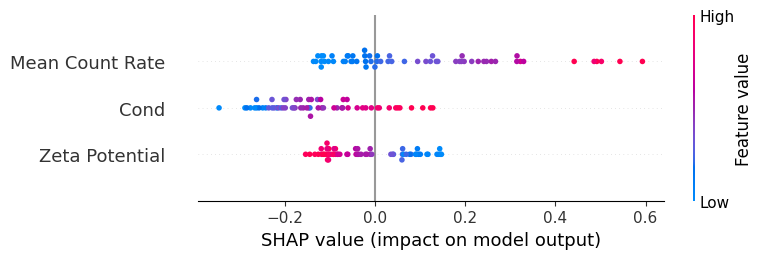

In [80]:
best_model = grid_search.best_estimator_
explainer_svc = shap.KernelExplainer(best_model.predict_proba, X_train)
shap_values_svc = explainer_svc(X_test)
shap_values_svc_class_1 = shap_values_svc.values[..., 1]
shap.summary_plot(shap_values_svc_class_1, X_test)

### Support Vector Classifier with hyperparameter tuning (Healthy_EVs_NPs vs Cancer_EVs_NPs)

In [81]:
acc_SVC, pred_SVC, train_data, pred_proba_SVC=evaluate_model(grid_search.best_estimator_, train_set, X_train, y_train, X_test, y_test)

Accuracy score(SVC model): 0.833333 with 70.0% training records
Execution Time(SVC model): 0.002446 seconds with 70.0% training records

Accuracy score(SVC model): 0.850000 with 50.0% training records
Execution Time(SVC model): 0.002152 seconds with 50.0% training records

Accuracy score(SVC model): 0.666667 with 10.0% training records
Execution Time(SVC model): 0.000957 seconds with 10.0% training records

Accuracy score(SVC model): 0.750000 with 5.0% training records
Execution Time(SVC model): 0.000958 seconds with 5.0% training records



### Learning Curve for Support Vector Classifier (Healthy_EVs vs Cancer_EVs)

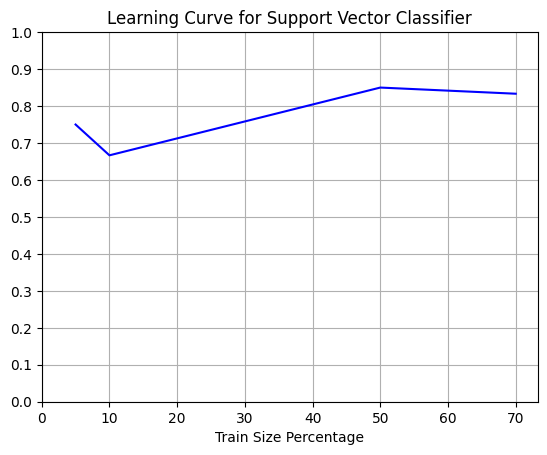

In [82]:
#===============================Learning Curve for SVC===========================================
plt.plot(training_sample,acc_SVC, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for Support Vector Classifier')
plt.show()

### ROC Curve for Support Vector Classifier (Healthy_EVs_NPs vs Cancer_EVs_NPs)

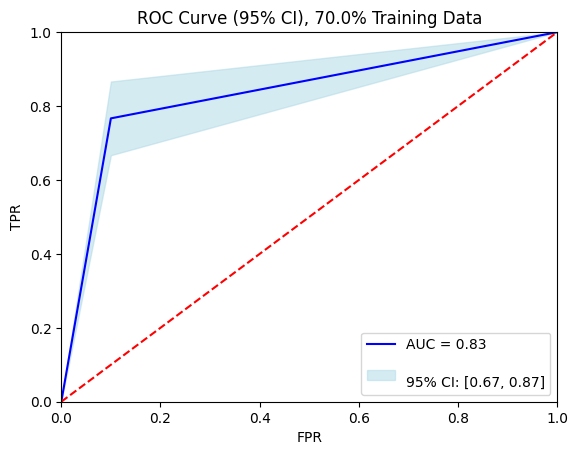

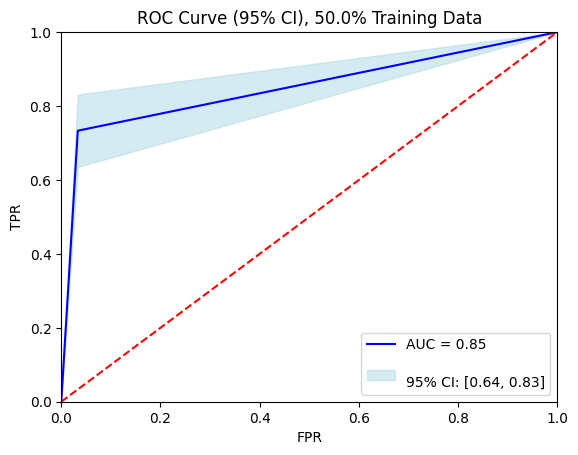

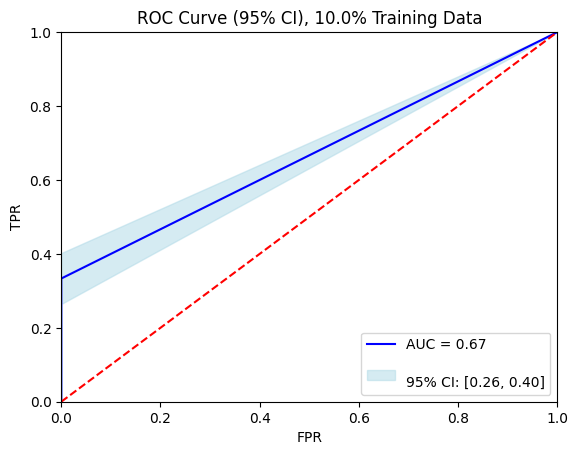

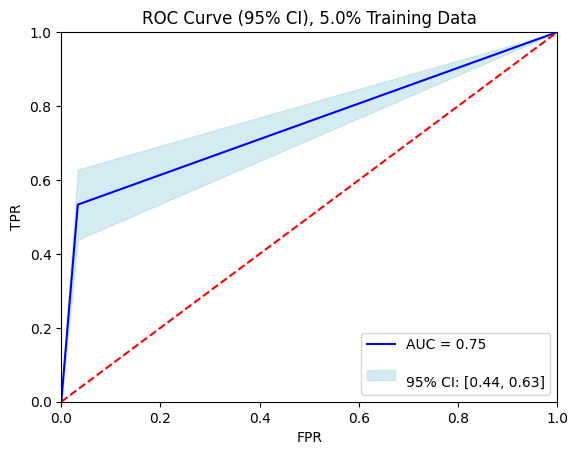

In [83]:
evaluate_ROC(train_set, y_test, pred_SVC)

### Confusion Matrix for Support Vector Classifier (Healthy_EVs_NPs vs Cancer_EVs_NPs)

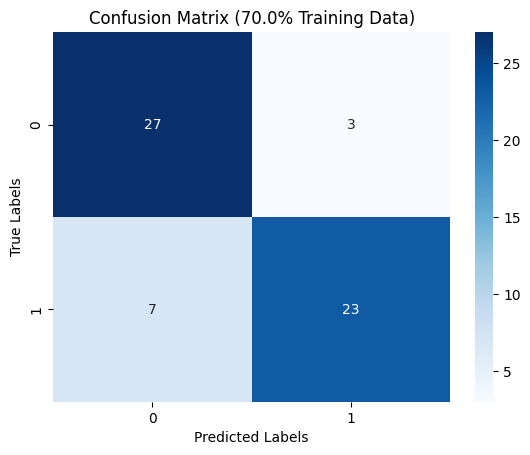

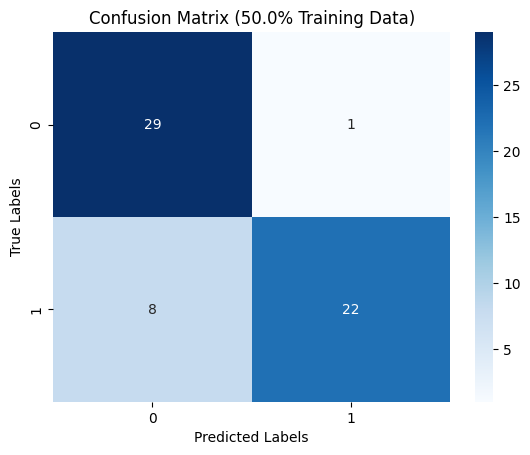

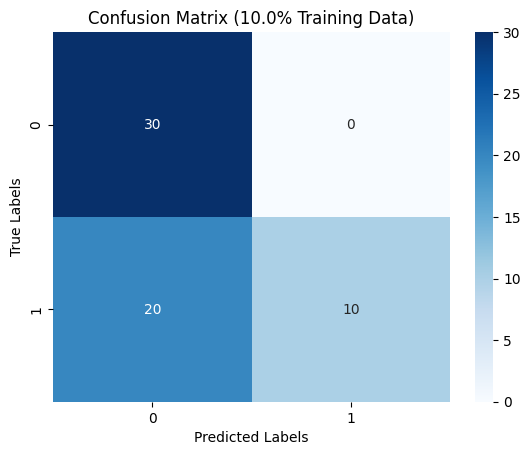

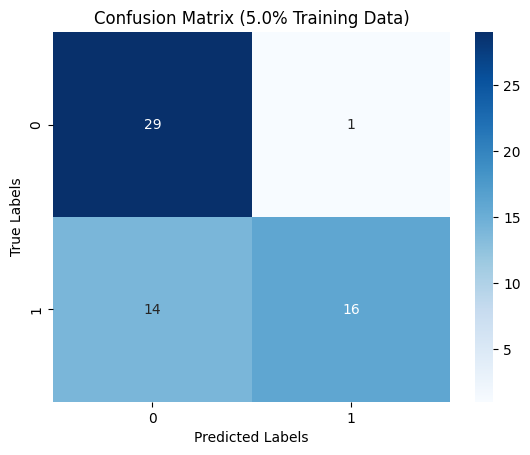

In [84]:
evaluate_con_mat(train_set, y_test, pred_SVC)

In [85]:
del acc_SVC, pred_SVC, train_data, pred_proba_SVC, best_params, clf_SVM

## Vector Quantum Classifier

In [87]:
#=====================Vector Quantum Classifier Model with different training sets================
scaler = MinMaxScaler()
train_features = scaler.fit_transform(X_train)
train_labels = y_train
test_features = scaler.transform(X_test)
test_labels = y_test
num_features = train_features.shape[1]
feature_map = ZZFeatureMap(feature_dimension=num_features, reps=1)

In [88]:
# del X_train, y_train

In [89]:
ansatz = EfficientSU2(num_qubits=num_features,entanglement='sca', reps=2)

In [90]:
optimizer = op.COBYLA(maxiter=300)

In [91]:
sampler = Sampler()

### Vector Quantum Classifier with Hyperparameter Tuning (Healthy_EVs_NPs vs Cancer_EVs_NPs)

In [92]:
#======================================VQC=================================================
clf_vqc = VQC(
    sampler=sampler,
    feature_map=feature_map,
    ansatz=ansatz,
    loss = 'squared_error',
    optimizer=optimizer
)
acc_vqtask1 = []
pred_vqtask1 = []
for elm in train_set:
    vqc = copy.deepcopy(clf_vqc)
    X_t, dummy_x, y_t, dummy_y = train_test_split(train_features, train_labels, train_size=elm, random_state=algorithm_globals.random_seed)
    vqc.fit(X_t, y_t.values)
    start = time.time()
    pred = vqc.predict(test_features)
    end = time.time()
    accuracy = accuracy_score(test_labels.values, pred)
    execution_time = end-start
    pred_vqtask1.append(pred)
    acc_vqtask1.append(accuracy)
    print(f'Accuracy score(VQC Model): {accuracy} with {elm*100}% training records')
    print(f'Execution Time(VQC Model): {execution_time} seconds with {elm*100}% training records')
    print()
#======================================VQC=================================================

Accuracy score(VQC Model): 0.7666666666666667 with 70.0% training records
Execution Time(VQC Model): 0.2461695671081543 seconds with 70.0% training records

Accuracy score(VQC Model): 0.7666666666666667 with 50.0% training records
Execution Time(VQC Model): 0.25885796546936035 seconds with 50.0% training records

Accuracy score(VQC Model): 0.6333333333333333 with 10.0% training records
Execution Time(VQC Model): 0.2463524341583252 seconds with 10.0% training records

Accuracy score(VQC Model): 0.6666666666666666 with 5.0% training records
Execution Time(VQC Model): 0.35219907760620117 seconds with 5.0% training records



## Learning Curve for VQC

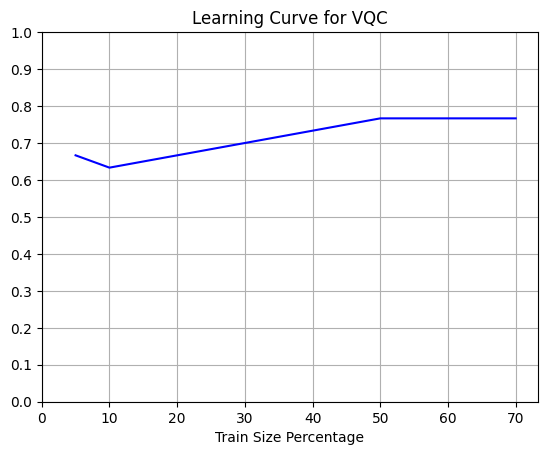

In [93]:
#===============================Learning Curve for VQC===========================================
plt.plot(training_sample,acc_vqtask1, color = 'b', )
plt.xticks([0,10, 20, 30, 40, 50, 60, 70])
plt.yticks([0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.xlabel('Train Size Percentage')
plt.title('Learning Curve for VQC')
plt.show()

### 3D Scatter Plot for VQC Model (Healthy_EVs_NPs vs Cancer_EVs_NPs)

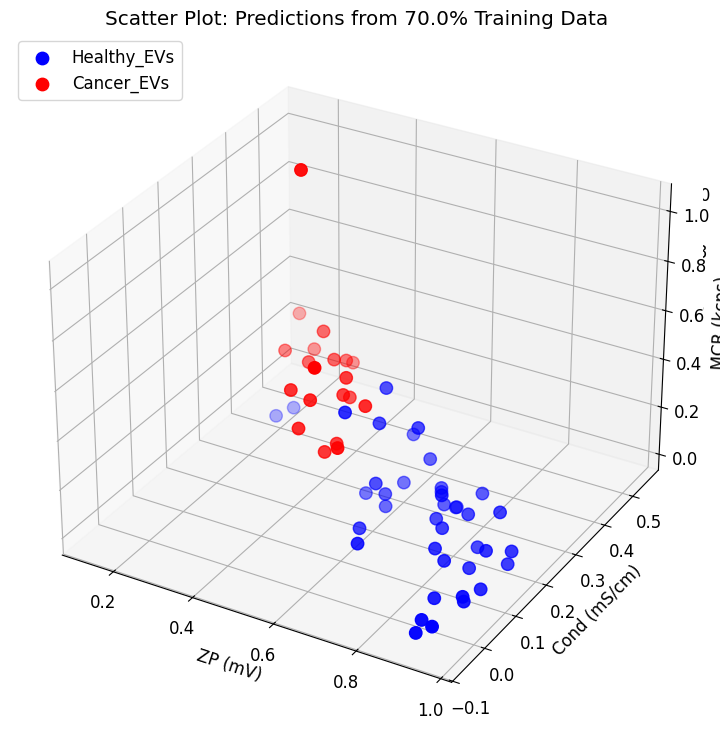

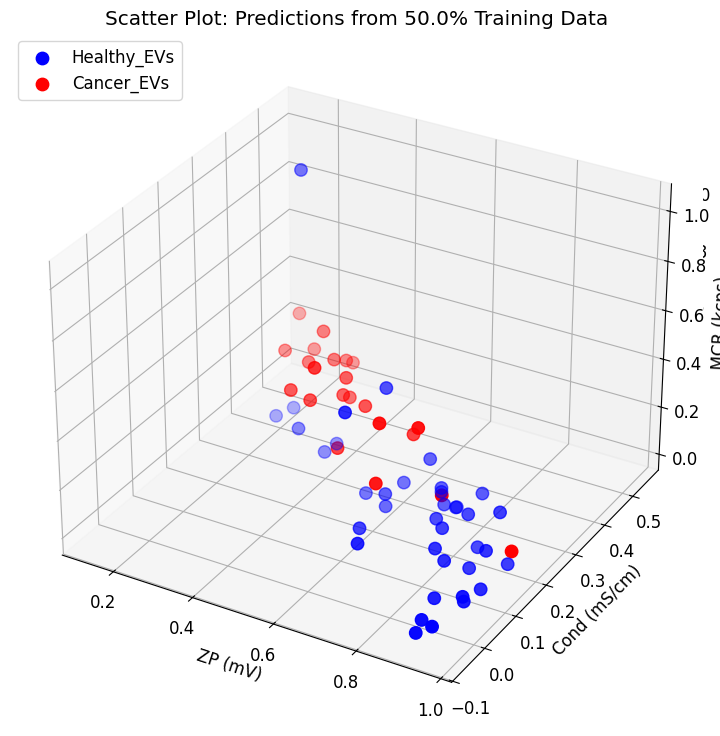

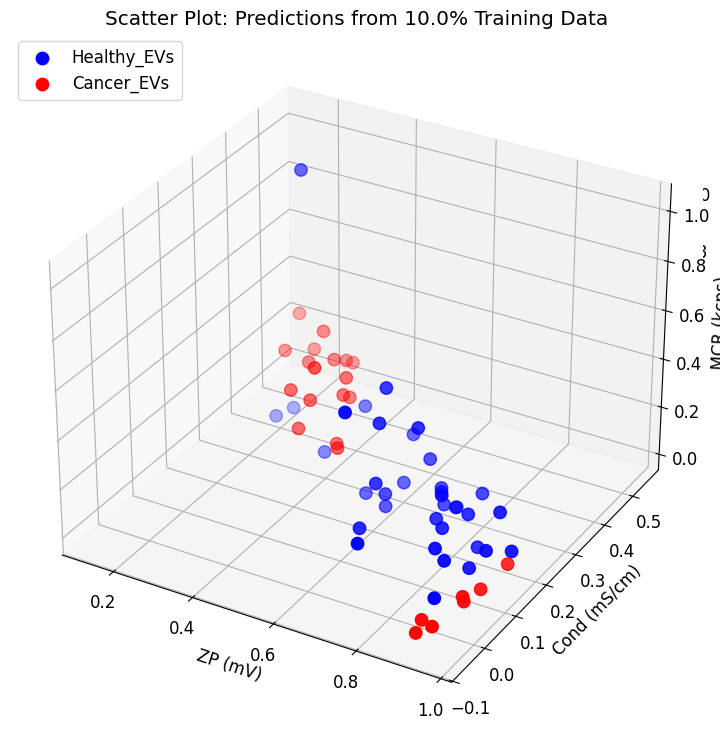

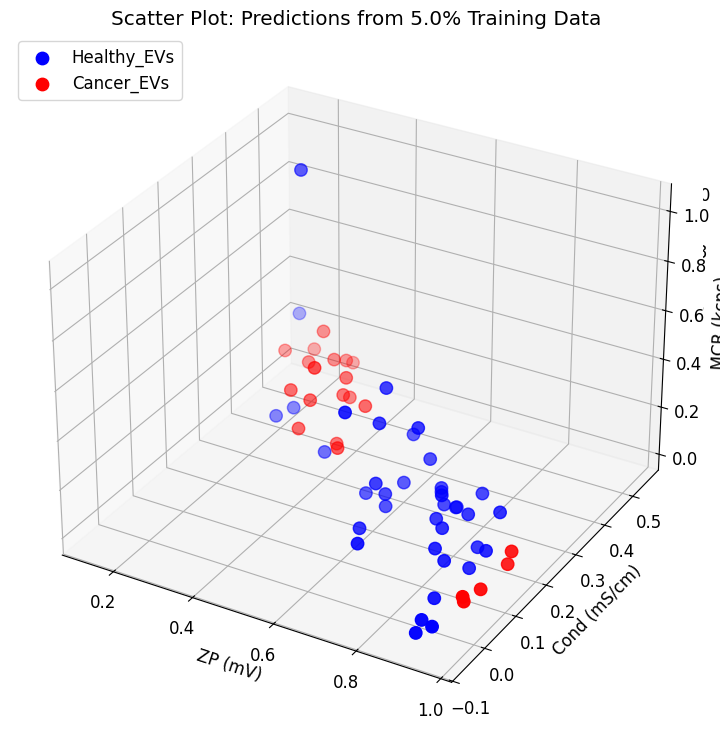

In [94]:
#=======================================3D Scatter Plot===============================
for i in range(len(train_set)):
    plt.rcParams.update({'font.size': 12})
    fig = plt.figure(figsize=(9,9))
    ax = plt.subplot(1,1,1,projection='3d')
    ax = fig.add_subplot(111,projection='3d')
    ax.scatter(test_features[pred_vqtask1[i]==0,0], test_features[pred_vqtask1[i]==0,1], test_features[pred_vqtask1[i]==0,2], c='blue', marker='o', label='Healthy_EVs', s=80)
    ax.scatter(test_features[pred_vqtask1[i]==1,0], test_features[pred_vqtask1[i]==1,1], test_features[pred_vqtask1[i]==1,2], c='red', marker='o', label='Cancer_EVs',s=80)
  # Set labels for each axis
    ax.set_xlabel('ZP (mV)')
    ax.set_ylabel('Cond (mS/cm)')
    ax.set_zlabel('MCR (kcps)')
    ax.set_title(f'Scatter Plot: Predictions from {train_set[i]*100}% Training Data')
    ax.tick_params("z", which="major",length=15,width = 2.0)
    ax.legend(loc='upper left')
    plt.show()

### ROC Curve for Vector Quantum Classifier (Healthy_EVs_NPs vs Cancer_EVs_NPs)

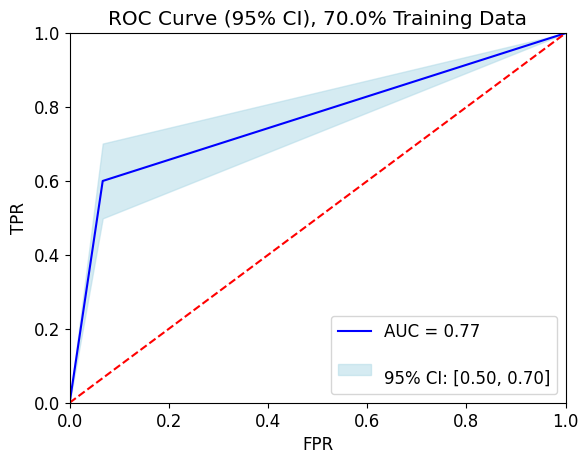

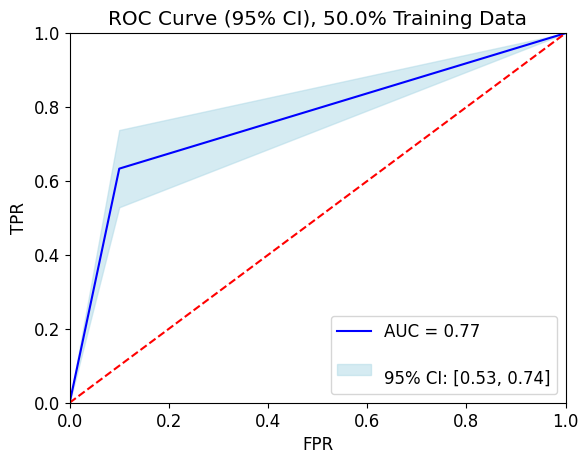

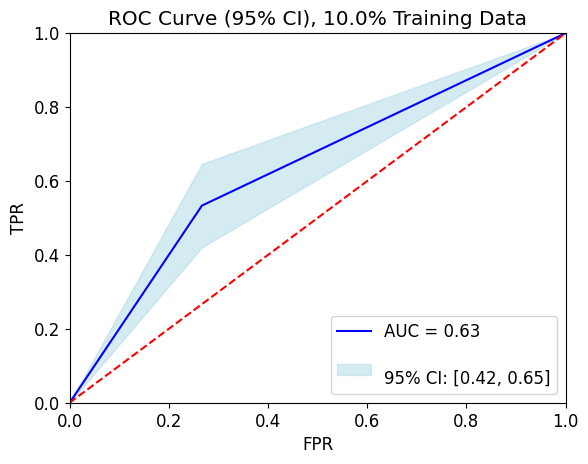

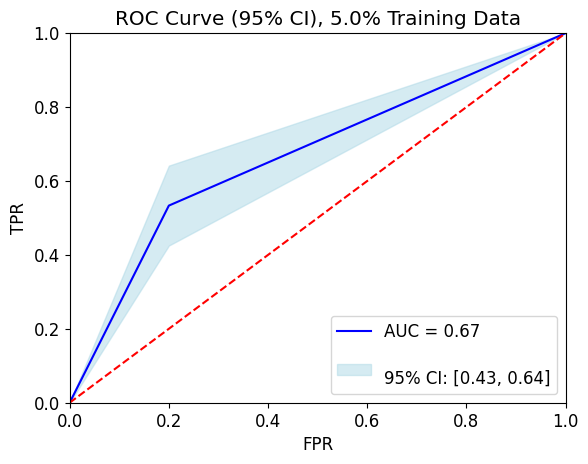

In [95]:
evaluate_ROC(train_set, test_labels, pred_vqtask1)

### Confusion Matrix for Vector Quantum Classifier (Healthy_EVs_NPs vs Cancer_EVs_NPs)

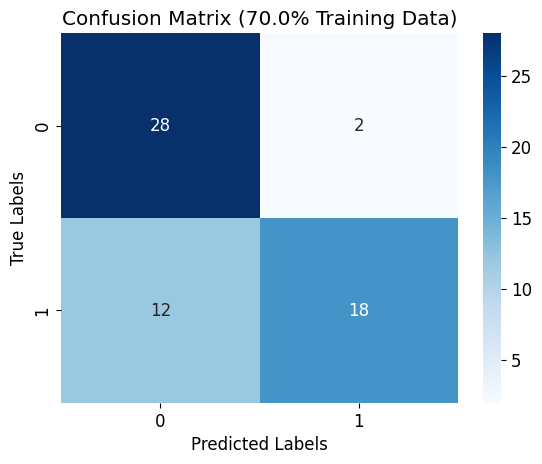

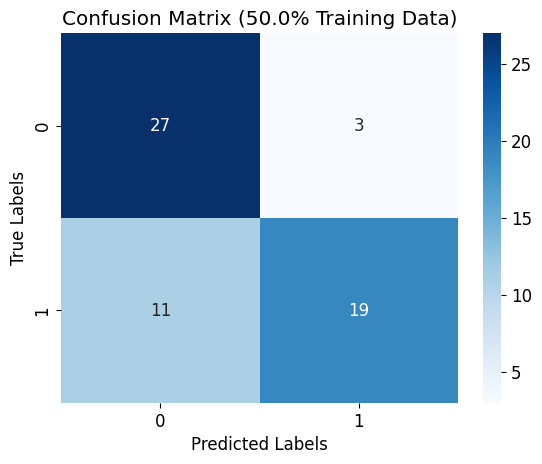

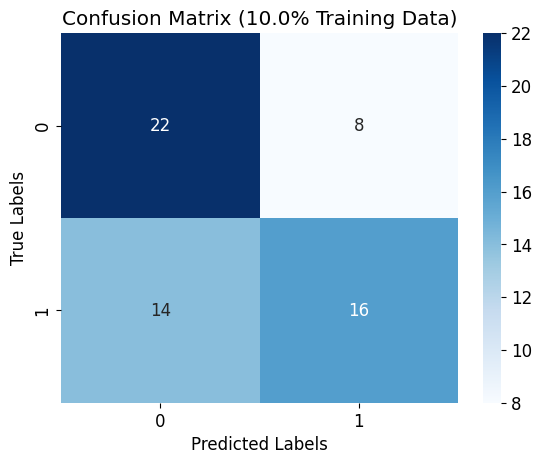

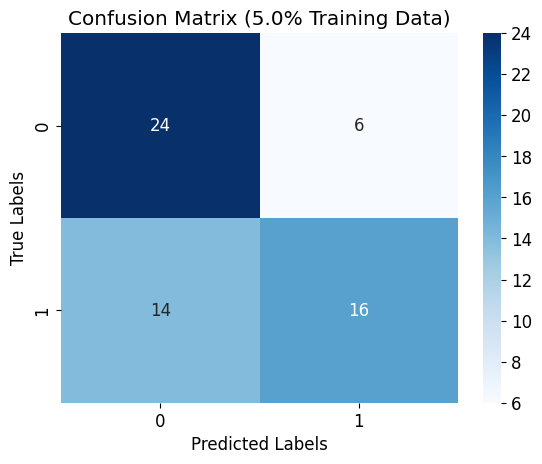

In [96]:
evaluate_con_mat(train_set, test_labels, pred_vqtask1)